<a href="https://colab.research.google.com/github/BrainConnection/Dynamical_Decoupling_Project/blob/main/5.%201Q%20DD%20(13).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Environment Setting



In [ ]:
!pip install qutip
!pip install numpy
!pip install matplotlib
!pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 18.8 MB/s eta 0:00:00


In [ ]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
from scipy.optimize import curve_fit

# CP CPMG UDD XY4 XY8 XY16 Sequence

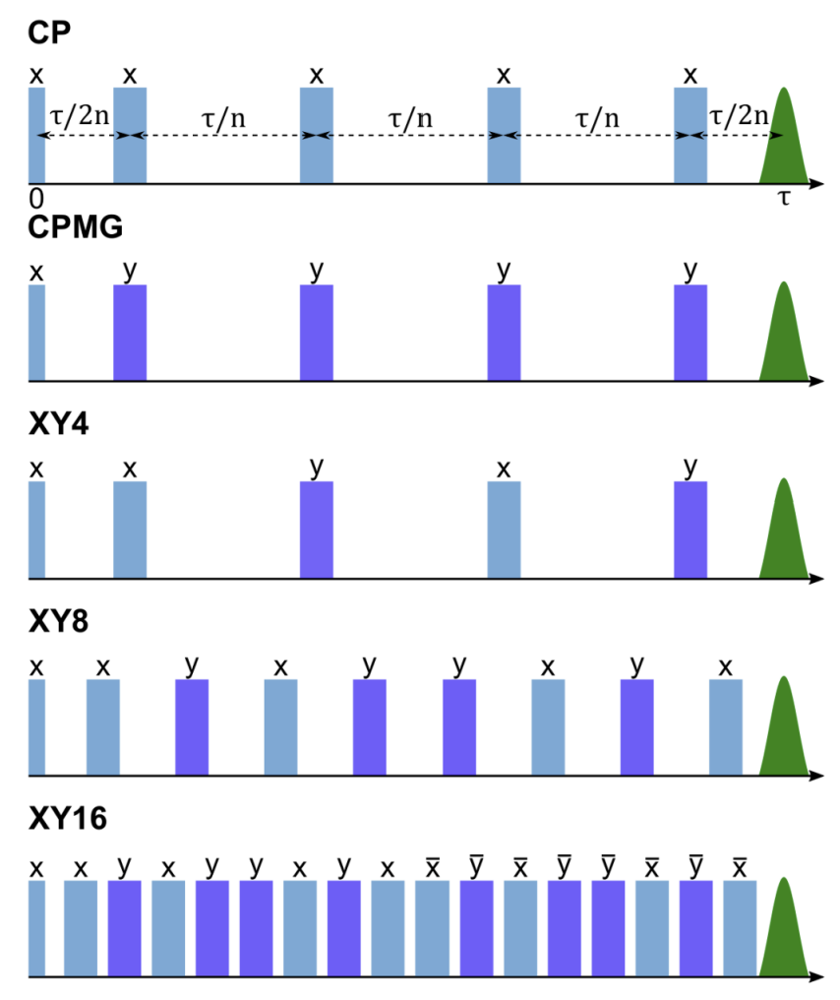

In [ ]:
# Modulate each pulse timing (Equivalent Spacing)
# pulse list
# skip pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N):

    T = T_end - T_srt
    Seq_list = []
    for i in range(N):
      Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq


# Modulate each pulse timing (Sinusoidal Spacing)
# pulse list
# skip pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing_UDD(T_srt, T_end, N):

    T = T_end - T_srt
    Seq_list = []

    shift = 0
    for i in range(N):
      shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
      Seq_list.append(T_srt + shift)

    Seq = np.array(Seq_list)

    return Seq

In [ ]:
# Single Square Pulse Envolope

def Single_pulse_env(t, B, T_cent):

    return B * (t > T_cent-0.5*np.pi/B) * (t < T_cent+0.5*np.pi/B)


# Single Square Pulse (lab frame)

def Single_pulse(t, B, Omega_qd, T_cent, Phi_qd):

    return Single_pulse_env(t, B, T_cent) * np.cos(Omega_qd * t + Phi_qd)

In [ ]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt_r'] # duration of the readout drive, in units of ns
    T_end = args['T_end_r'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)


def Hrd_lab_frame(t, args):
    omega_rd = args['Omega_rd']
    return Hrd_rotating_frame(t, args) * np.cos(omega_rd * t)

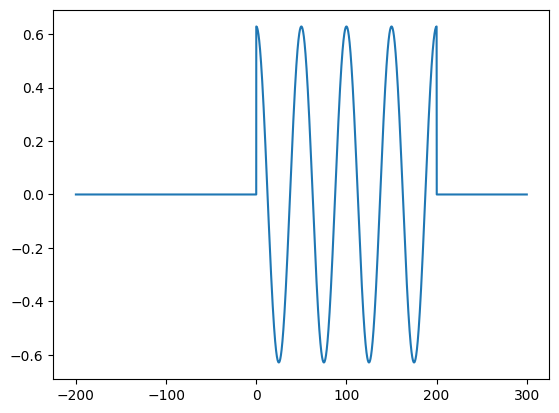

In [ ]:
# resonator drive pulse simulation

tlist = np.linspace(-200, 300, 10000)
plt.figure()
plt.plot(tlist, Hrd_lab_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt_r': 0, 'T_end_r': 200, 'Omega_rd': 2*np.pi*0.02}))

## CP CPMG UDD Sequence

In [ ]:
# CP (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N_seq (number of pulse)

def CP_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N)
    pulse = 0

    for T_cent in Seq:
      pulse = pulse + Single_pulse(t, B, Omega_qd, T_cent, 0)

    return pulse

In [ ]:
# CPMG (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N_seq (number of pulse)

def CPMG_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N)
    pulse = 0

    for T_cent in Seq:
      pulse = pulse + Single_pulse(t, B, Omega_qd, T_cent, 0.5*np.pi)

    return pulse

In [ ]:
# CPMG (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N_seq (number of pulse)

def UDD_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, N)
    pulse = 0

    for T_cent in Seq:
      pulse = pulse + Single_pulse(t, B, Omega_qd, T_cent, 0.5*np.pi)

    return pulse

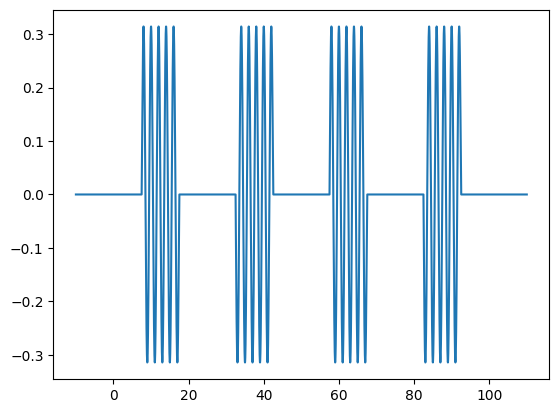

In [ ]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CP_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 4, 'Omega_qd': 2*np.pi*0.5}))

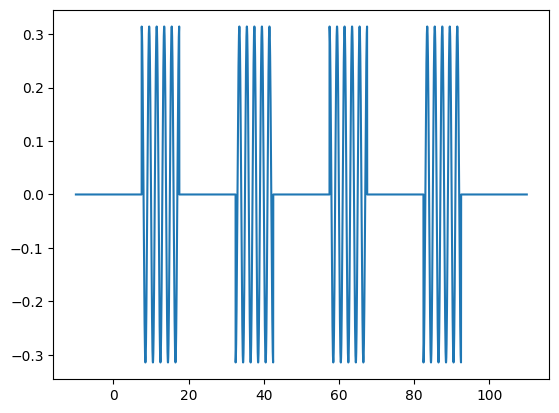

In [ ]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CPMG_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 4, 'Omega_qd': 2*np.pi*0.5}))

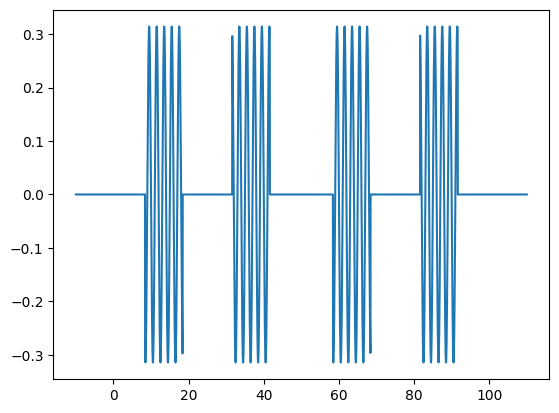

In [ ]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 4, 'Omega_qd': 2*np.pi*0.5}))

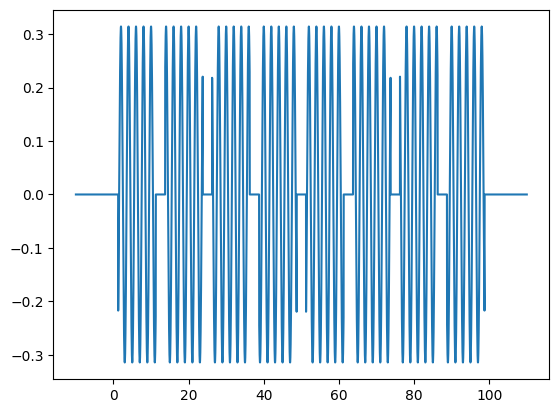

In [ ]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CP_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 8, 'Omega_qd': 2*np.pi*0.5}))

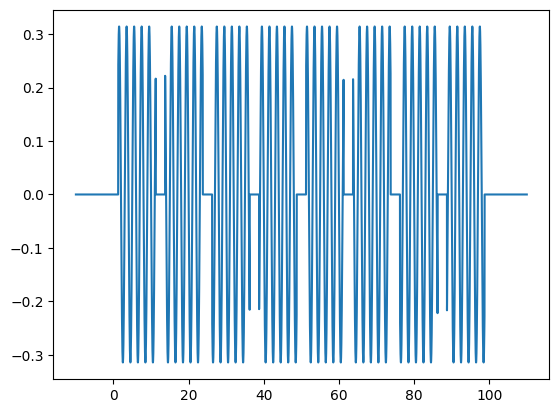

In [ ]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CPMG_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 8, 'Omega_qd': 2*np.pi*0.5}))

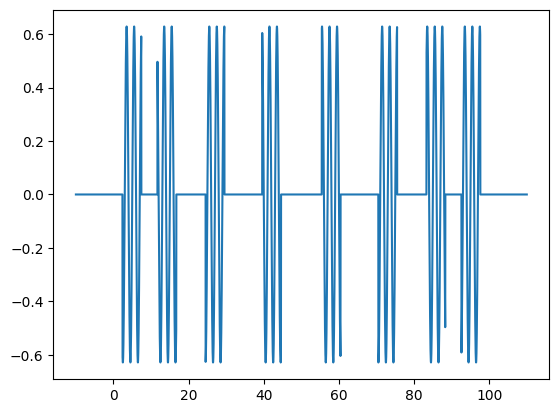

In [ ]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD_lab_frame(tlist, {'B': 2*np.pi*0.1, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 8, 'Omega_qd': 2*np.pi*0.5}))

## XY4 XY8 XY16 Sequence

In [ ]:
# XY4 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def XY4_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, 4)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 1.0*np.pi)

    return pulse

In [ ]:
# XY8 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def XY8_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, 8)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 1.0*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 1.0*np.pi)

    return pulse

In [ ]:
# XY16 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def XY16_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, 16)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 0)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[8], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[9], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[10], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[11], 1.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[12], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[13], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[14], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[15], np.pi)

    return pulse

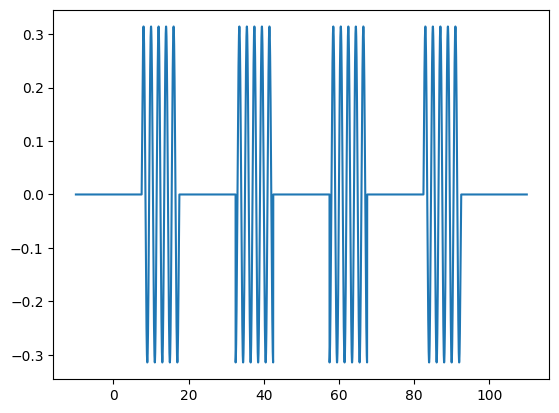

In [ ]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, XY4_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

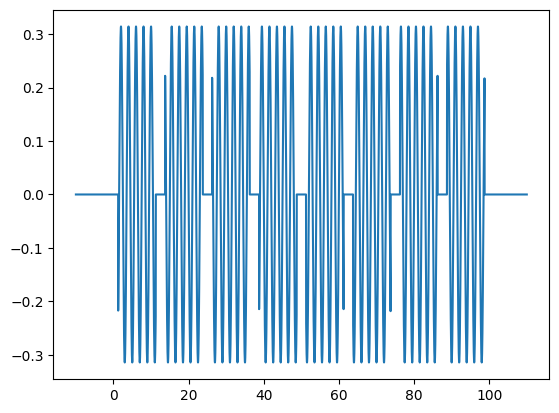

In [ ]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, XY8_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

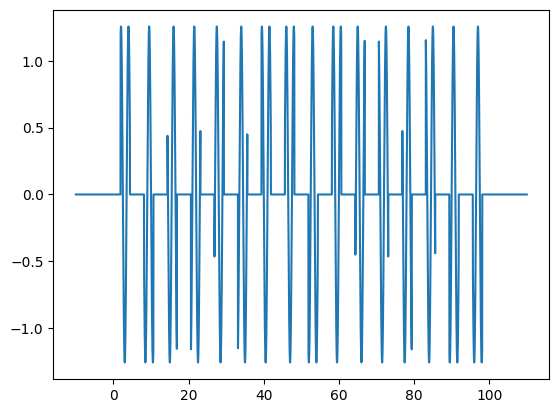

In [ ]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, XY16_lab_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

## UDD4 UDD8 UDD16 Sequence

In [ ]:
# UDD4 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def UDD4_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, 4)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    return pulse

In [ ]:
# UDD8 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def UDD8_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, 8)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 0)

    return pulse

In [ ]:
# UDD16 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def UDD16_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, 16)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 0)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[8], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[9], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[10], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[11], 1.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[12], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[13], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[14], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[15], np.pi)

    return pulse

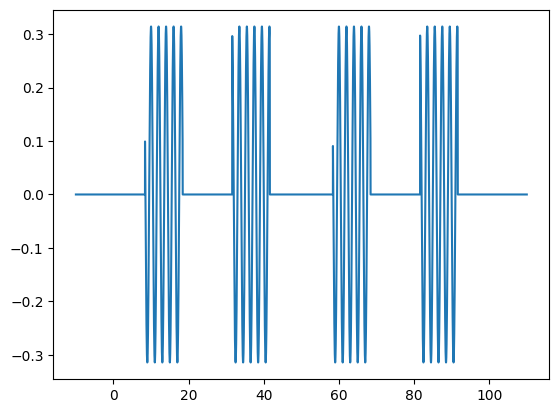

In [ ]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD4_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

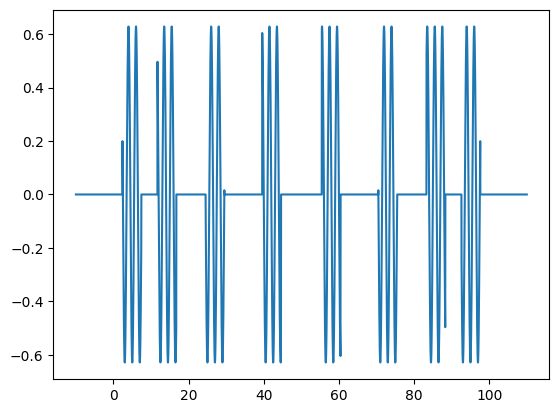

In [ ]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD8_lab_frame(tlist, {'B': 2*np.pi*0.1, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

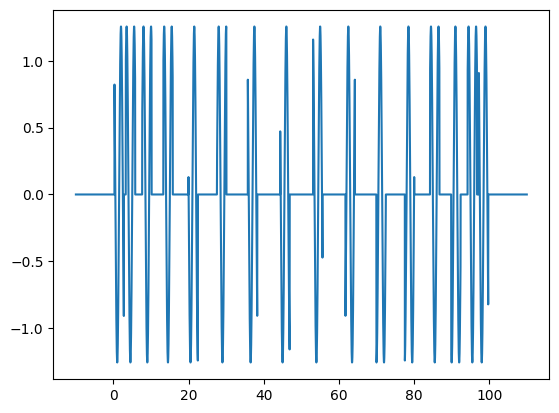

In [ ]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD16_lab_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{3\pi}{8}) |0\rangle + \sin(\frac{3\pi}{8}) |1\rangle $

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(3*np.pi/8) * psi_20 + np.sin(3*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [ ]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.006288864770346229
[0.7036655234717203, -0.0, -0.6905313510795019]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

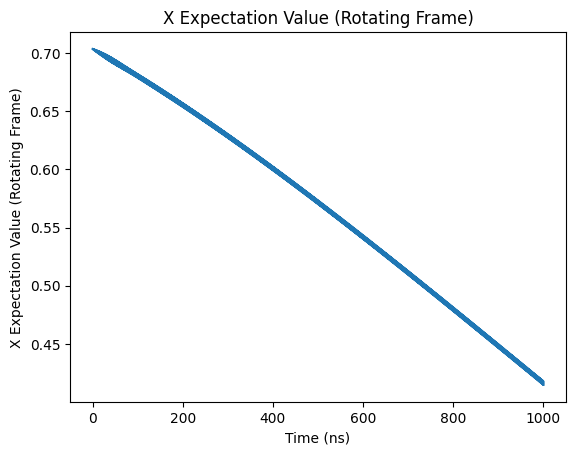

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

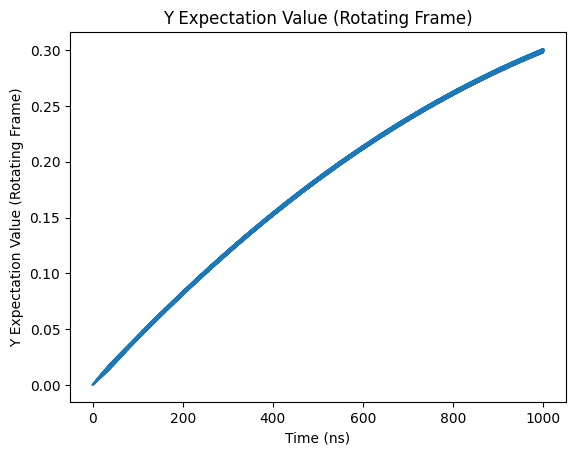

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

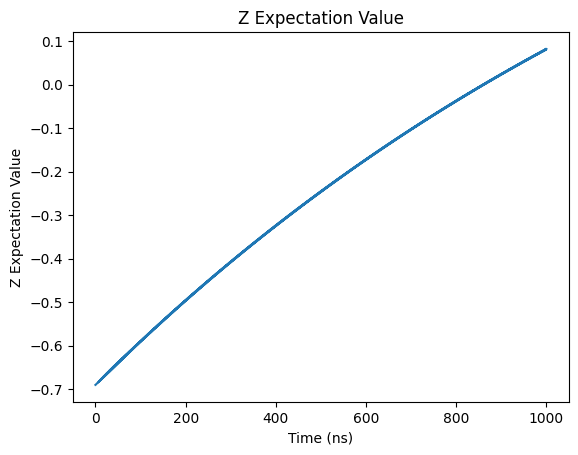

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

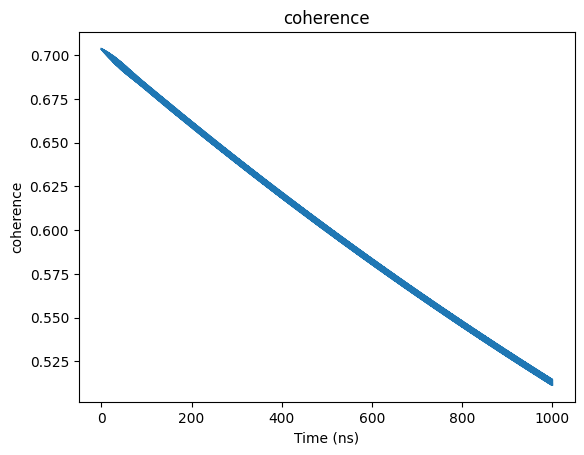

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

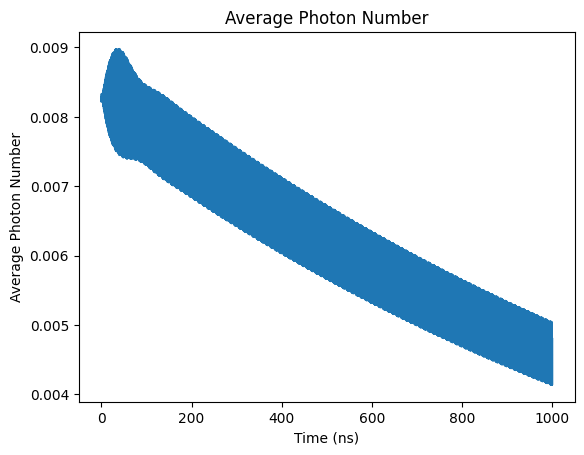

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

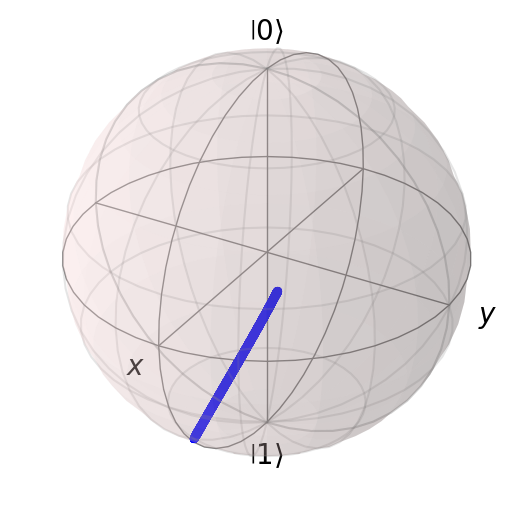

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [ ]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004936398038460416


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

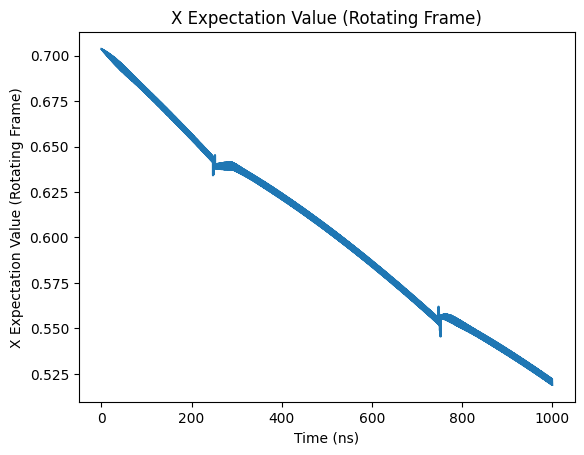

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

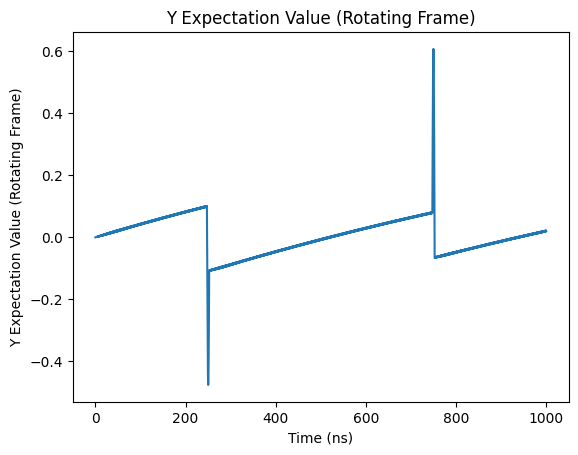

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

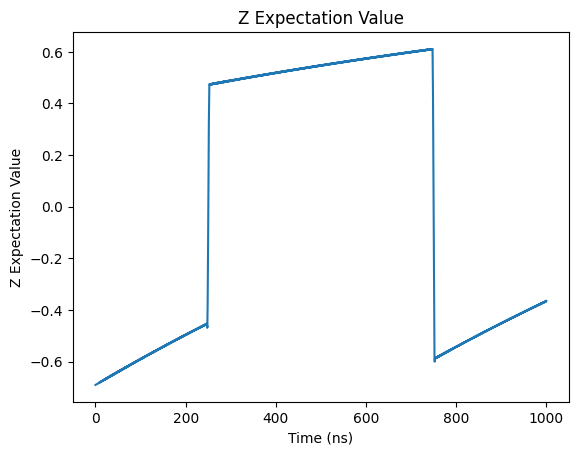

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

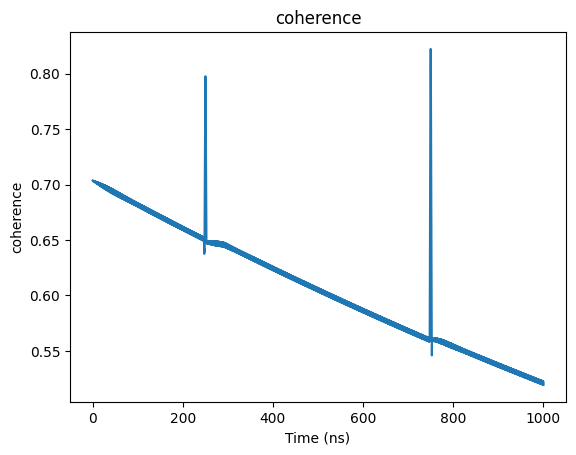

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

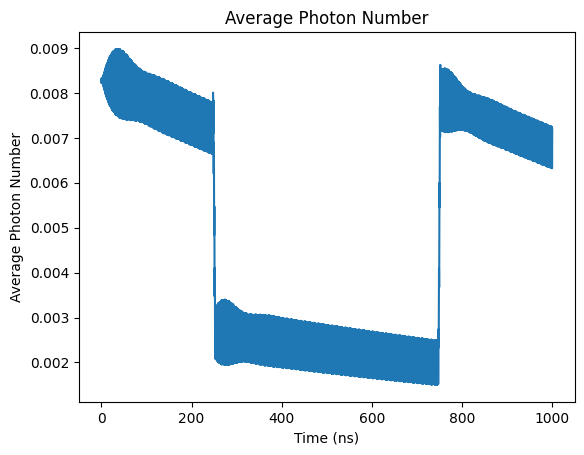

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

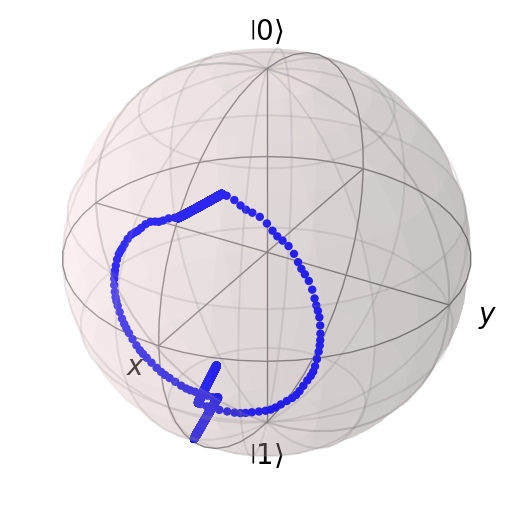

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005002191430210726


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

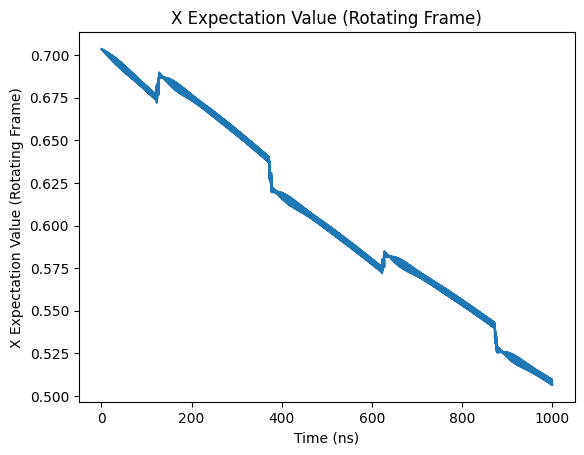

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

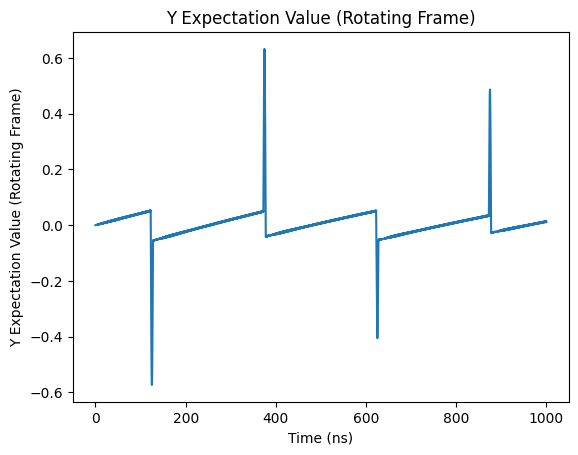

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

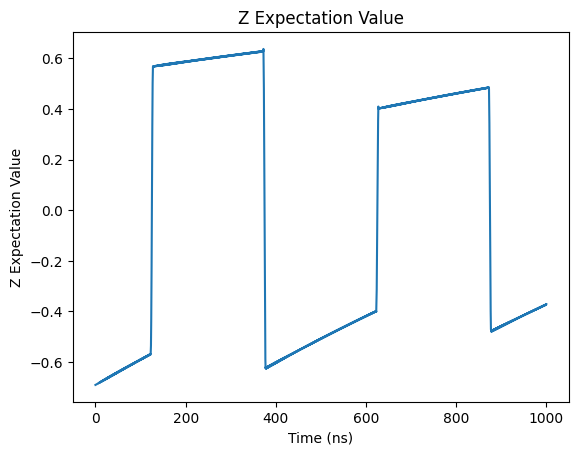

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

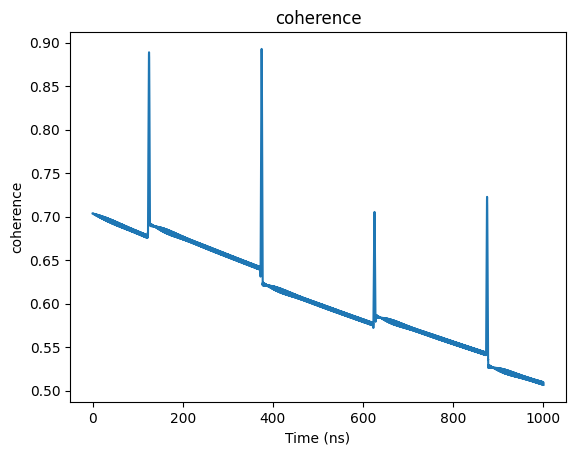

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

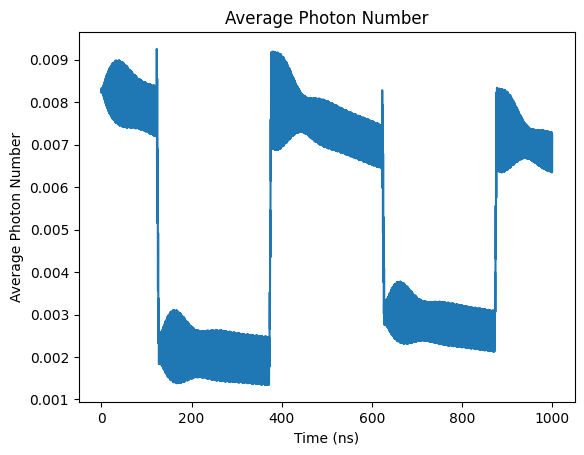

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

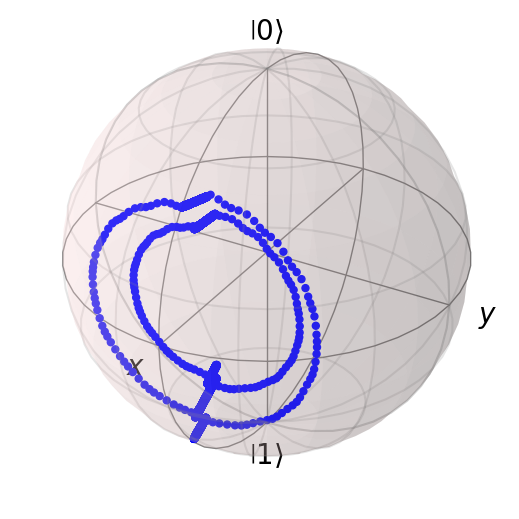

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004918313954169554


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

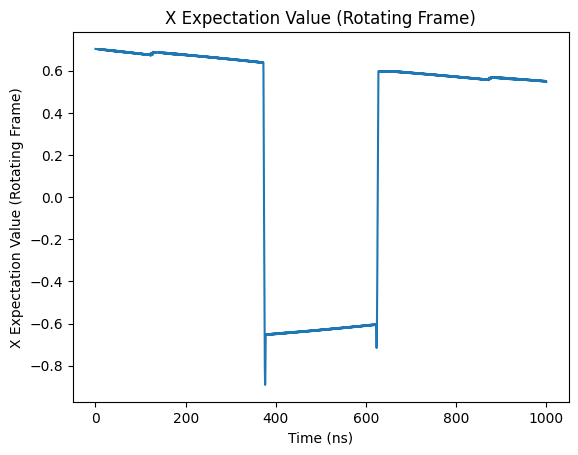

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

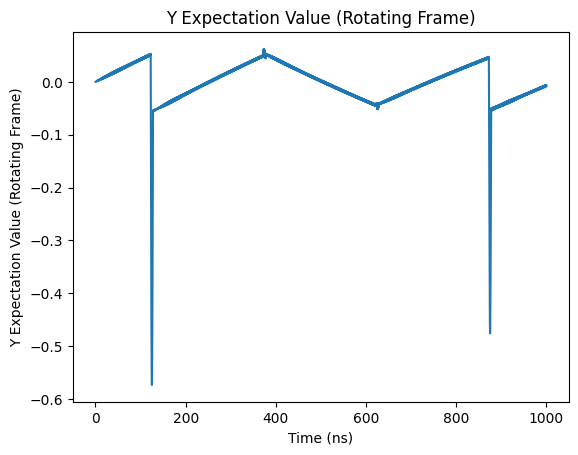

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

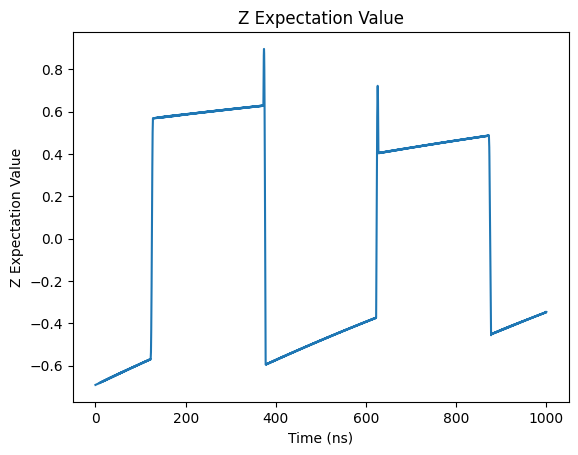

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

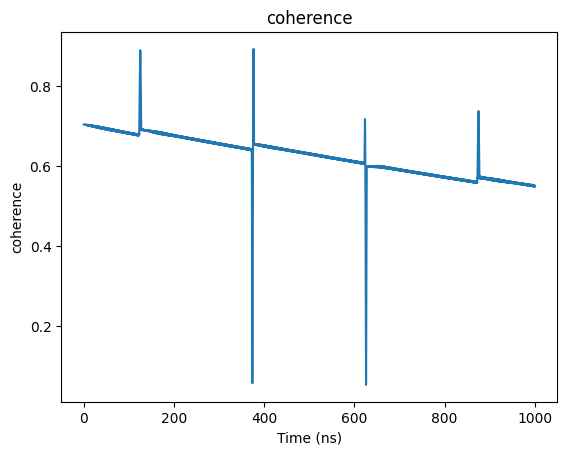

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

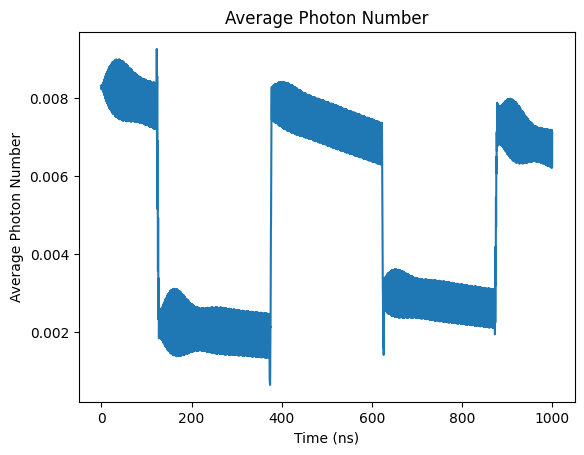

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

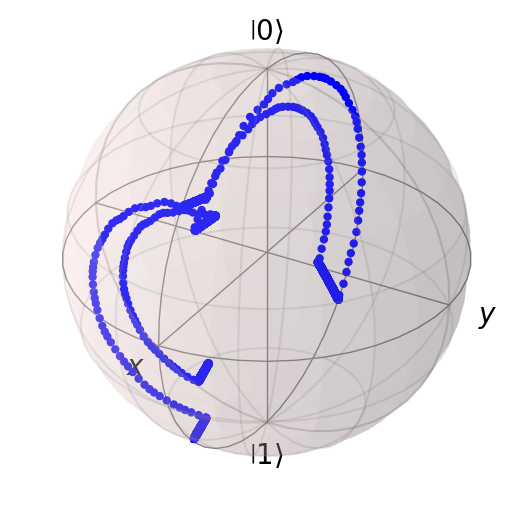

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005017781929264284


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

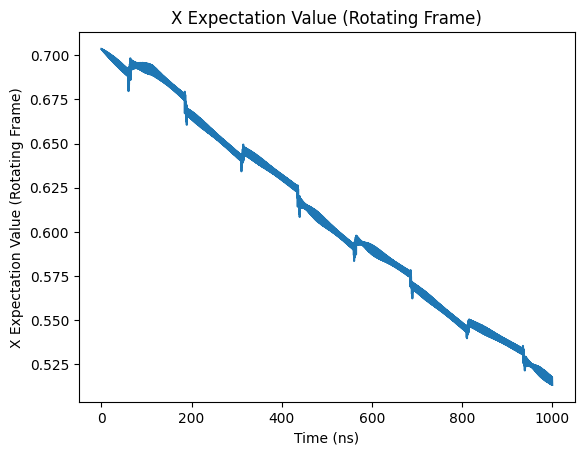

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

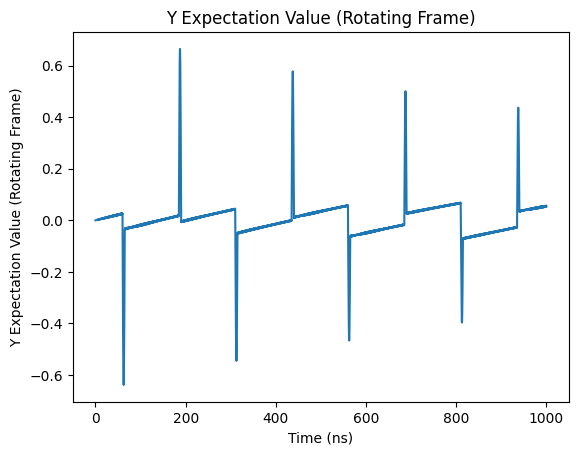

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

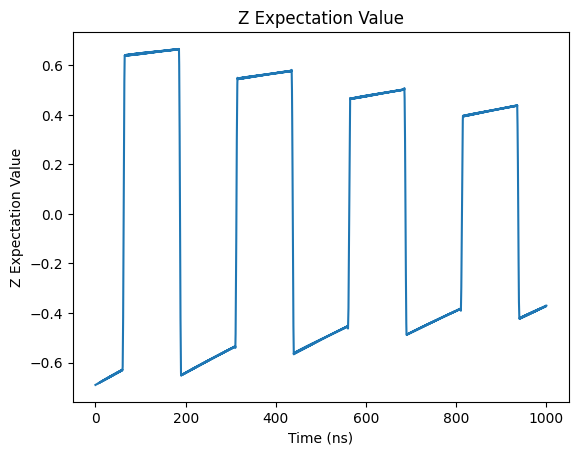

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

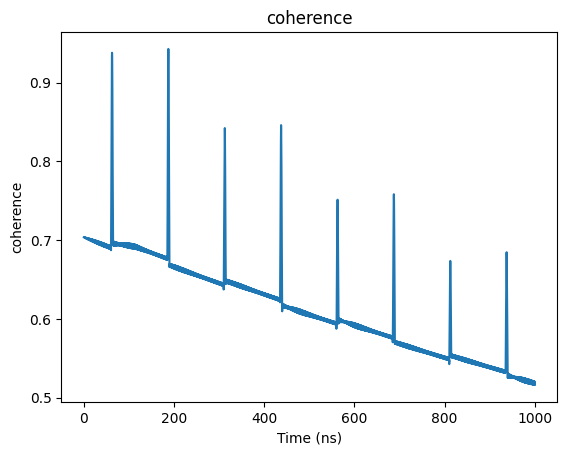

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

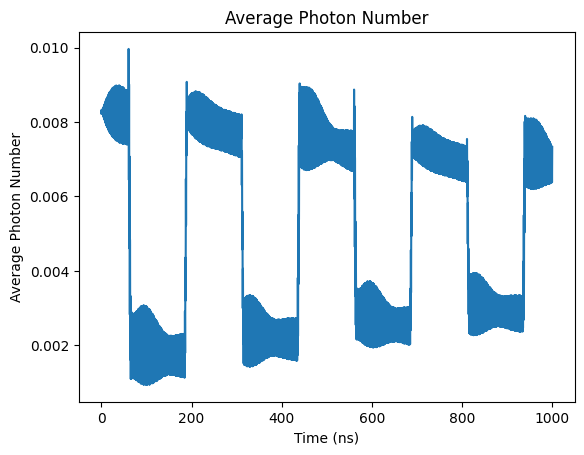

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

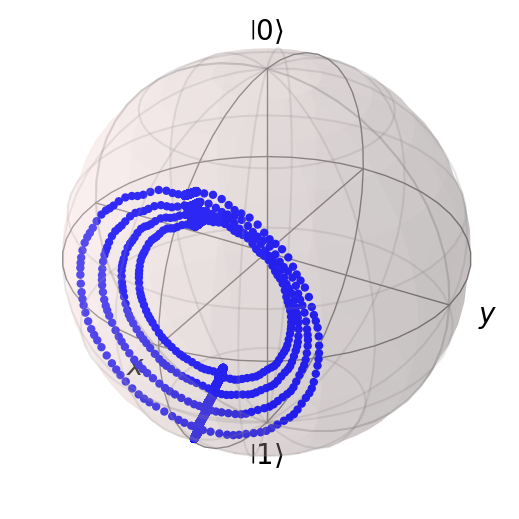

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.00498817721388314


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

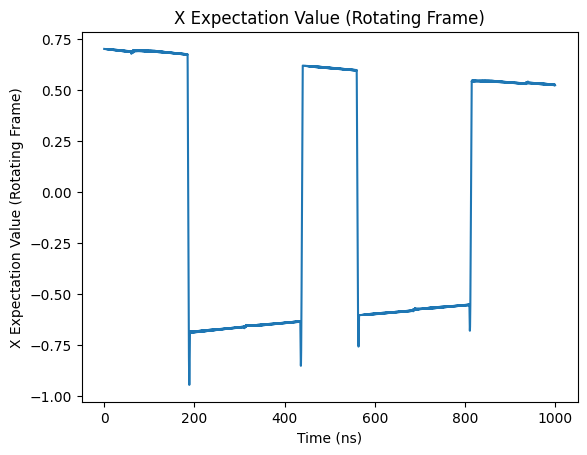

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

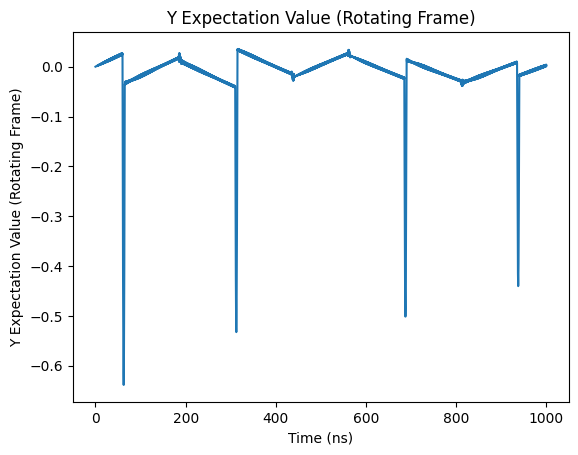

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

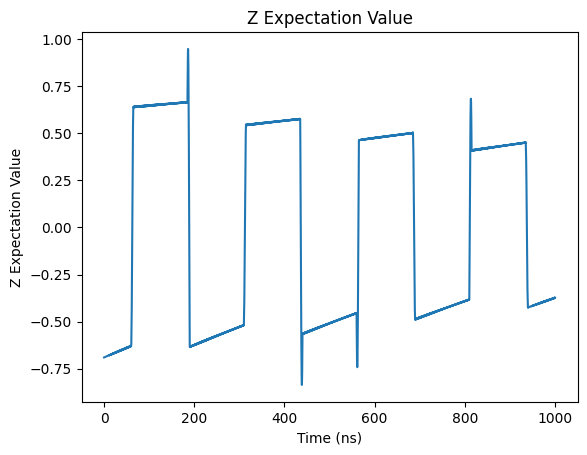

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

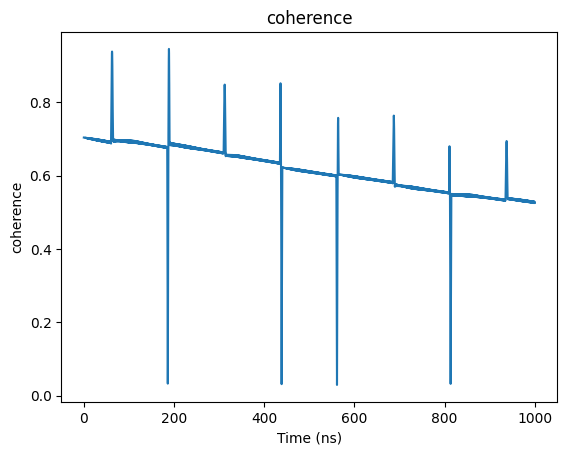

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

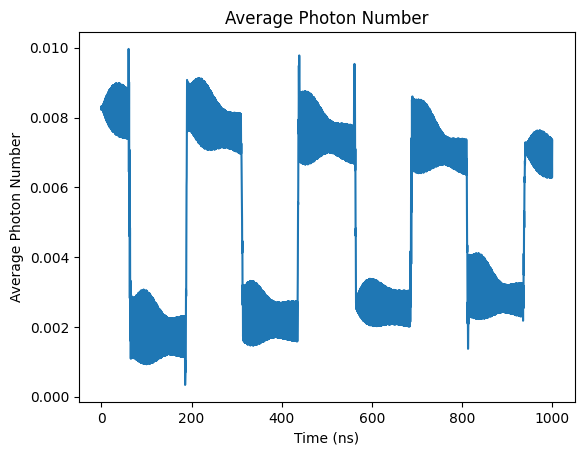

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

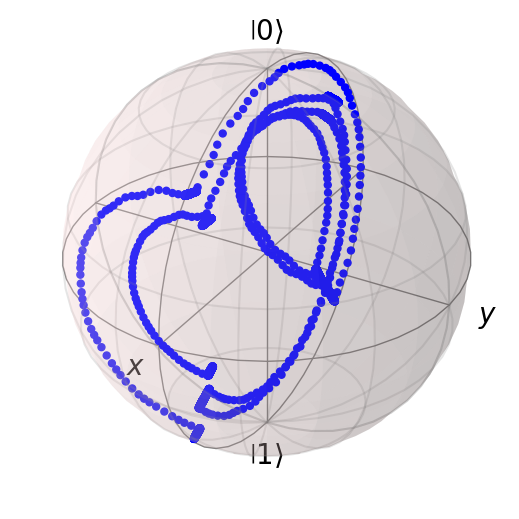

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005098420369182754


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

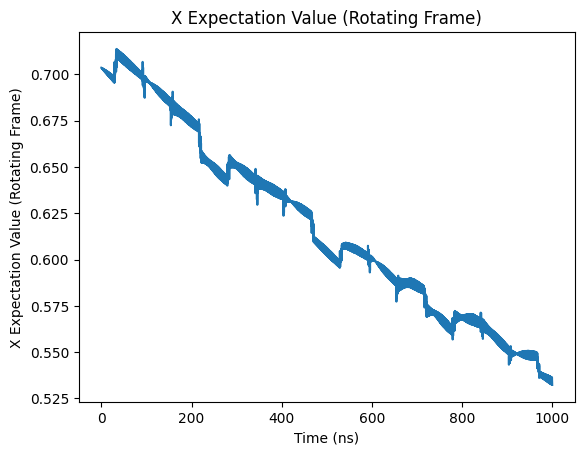

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

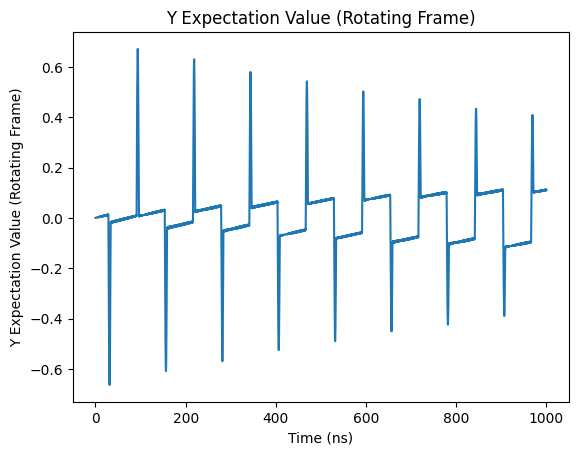

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

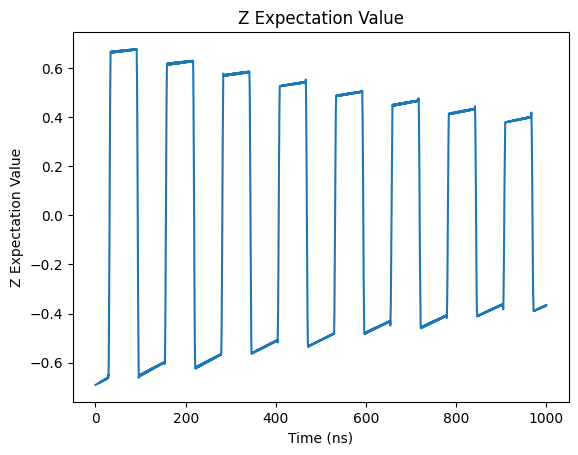

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

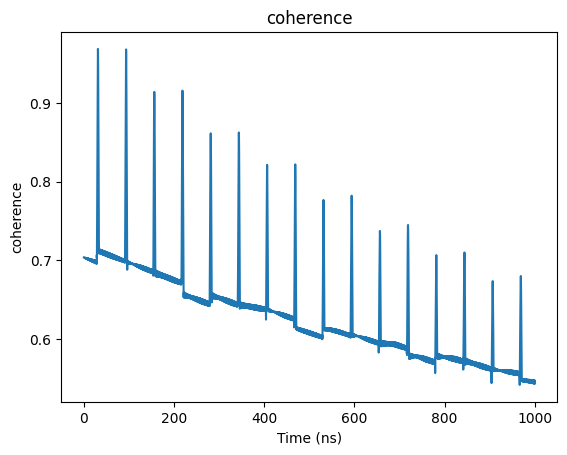

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

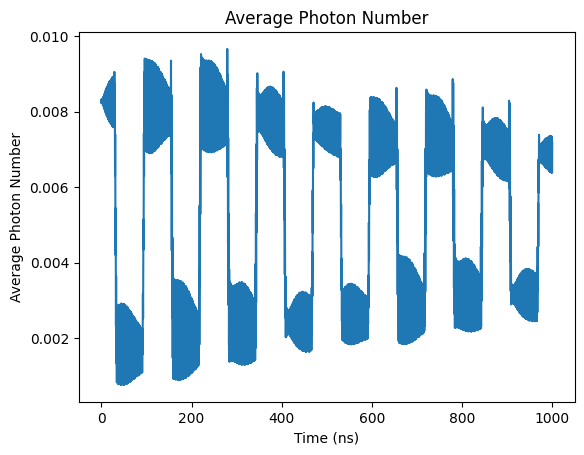

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

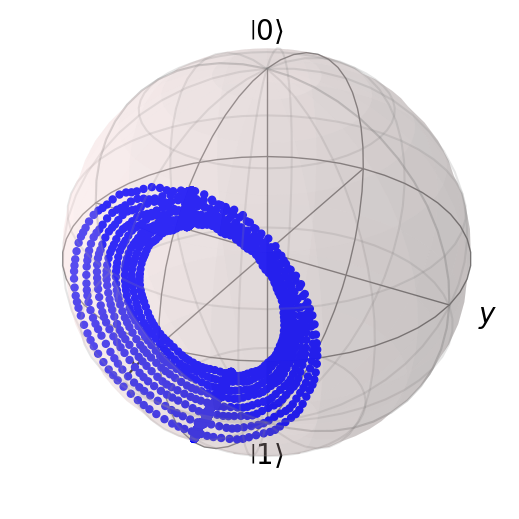

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005044499253988203


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

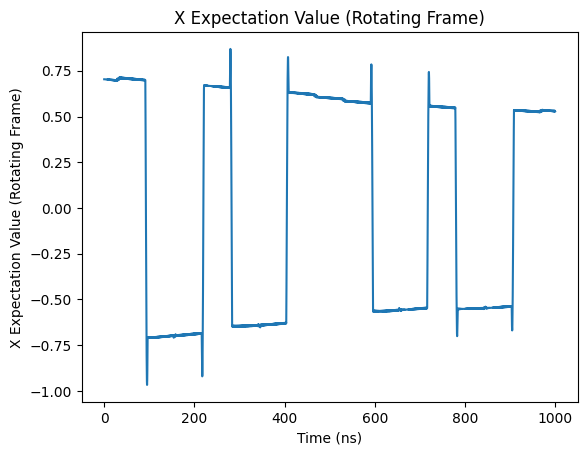

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

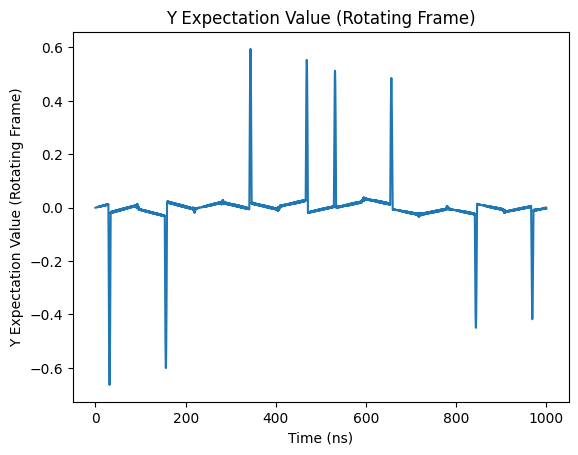

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

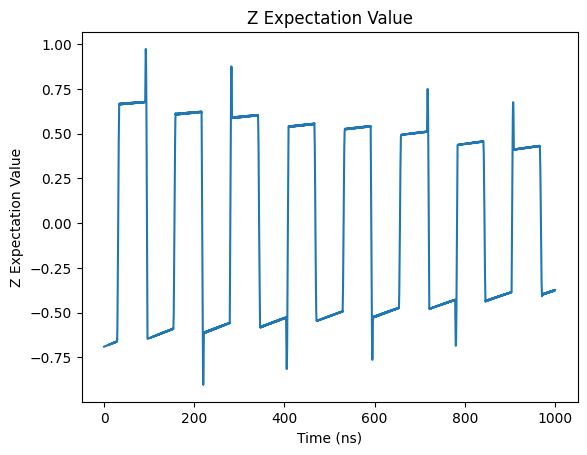

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

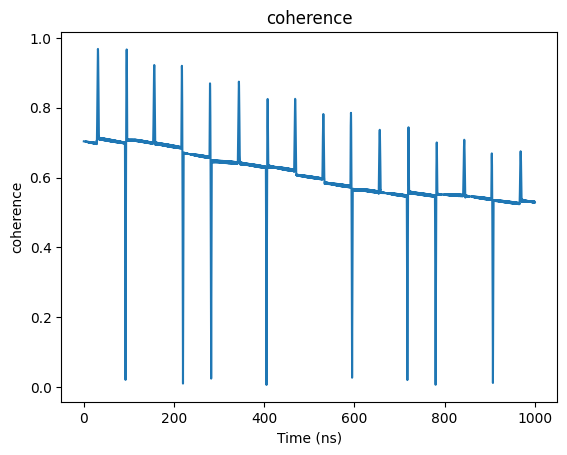

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

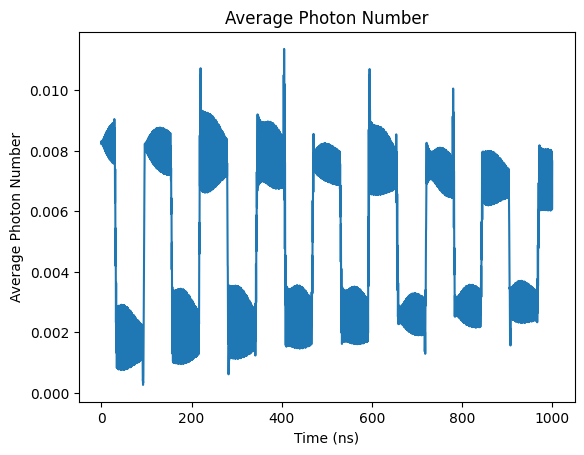

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

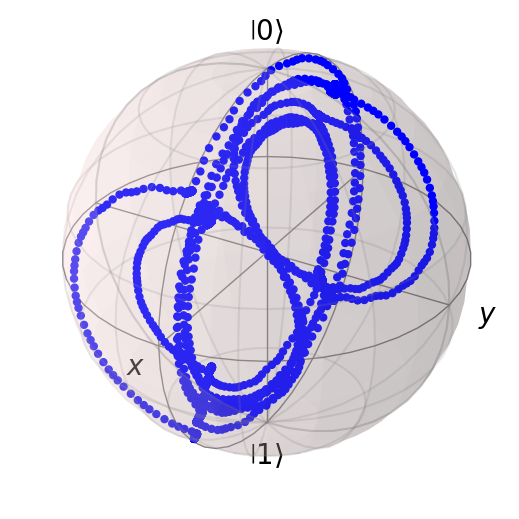

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [ ]:
x_list

[0.41636450643991835,
 0.5205228713559037,
 0.5080869840672018,
 0.5499539757266749,
 0.5153901626364312,
 0.527211501731788,
 0.5343048675372515,
 0.5295382769317241]

In [ ]:
y_list

[0.2995421262293251,
 0.02050999314770899,
 0.012914401639515353,
 -0.007231247009241307,
 0.0545633805119347,
 0.0022974305663696053,
 0.11085394700944406,
 -0.001665503748131933]

In [ ]:
z_list

[0.081248856207991,
 -0.3661282022107598,
 -0.3726382835767033,
 -0.3470406758018158,
 -0.3717212424721692,
 -0.37399197930107936,
 -0.3666507654026,
 -0.37538916253957116]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{3\pi}{8}) |0\rangle + e^{j\frac{1\pi}{2}} \sin(\frac{3\pi}{8}) |1\rangle $

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(3*np.pi/8) * psi_20 + np.exp(1j*np.pi*1/2) * np.sin(3*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [ ]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.006288899165593959
[4.308708654949945e-17, -0.7036655234717203, -0.6905313510795019]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

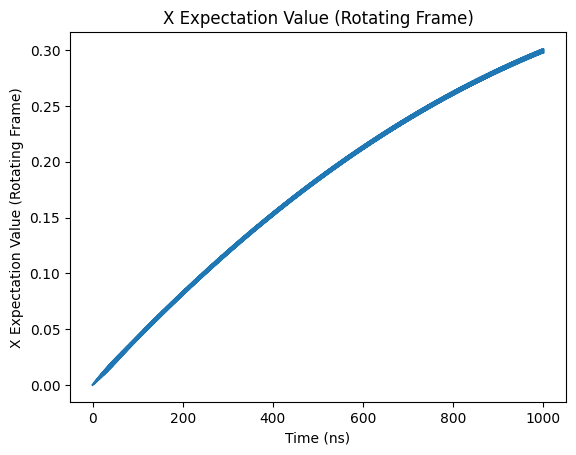

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

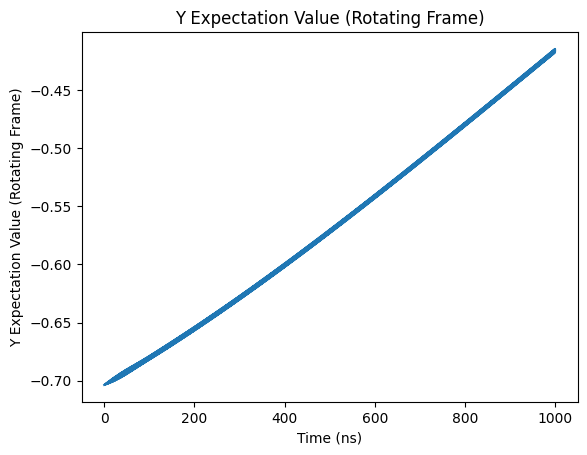

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

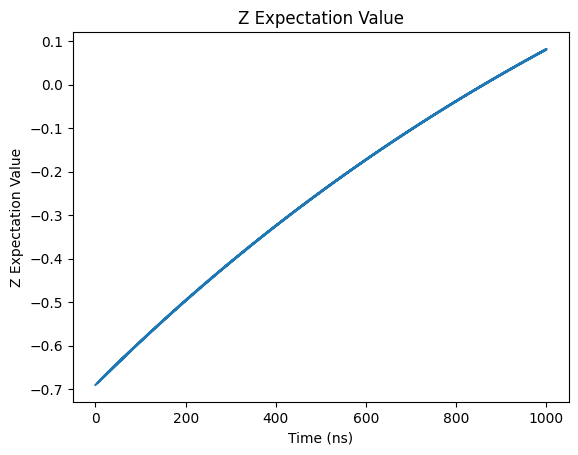

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

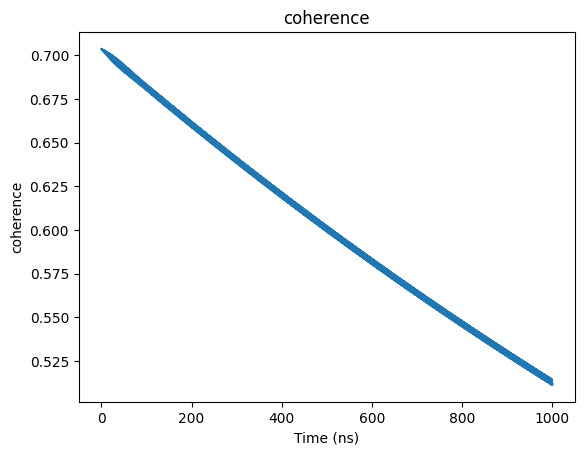

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

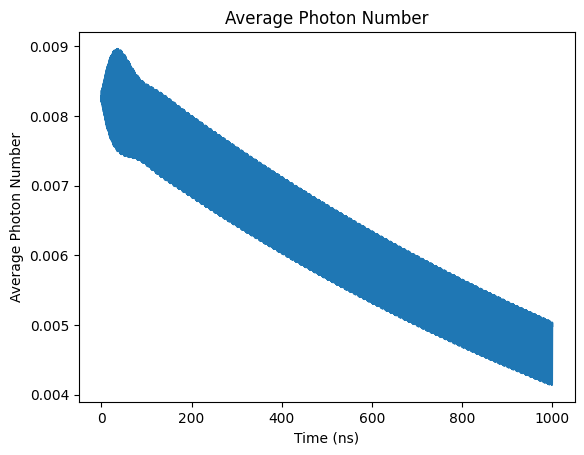

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

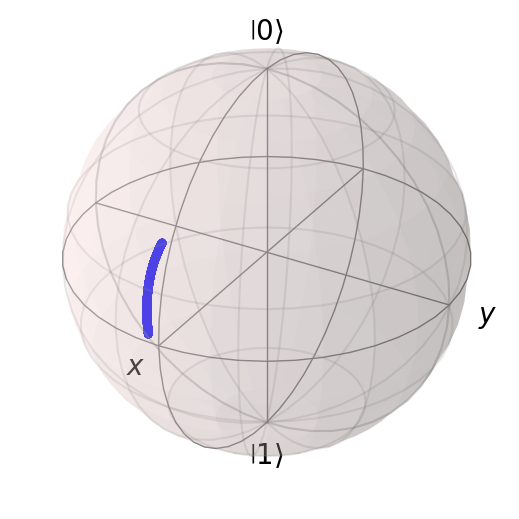

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [ ]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.0049279776284162306


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

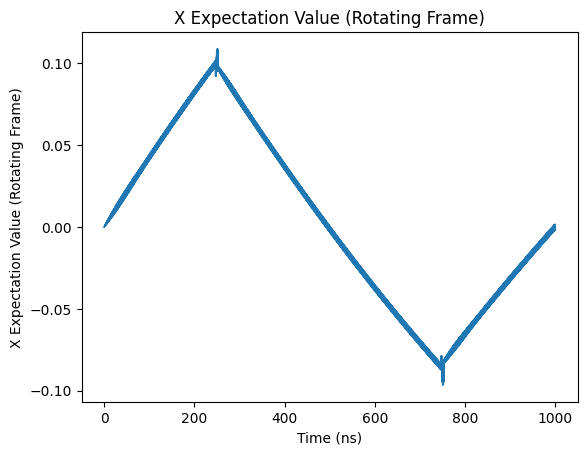

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

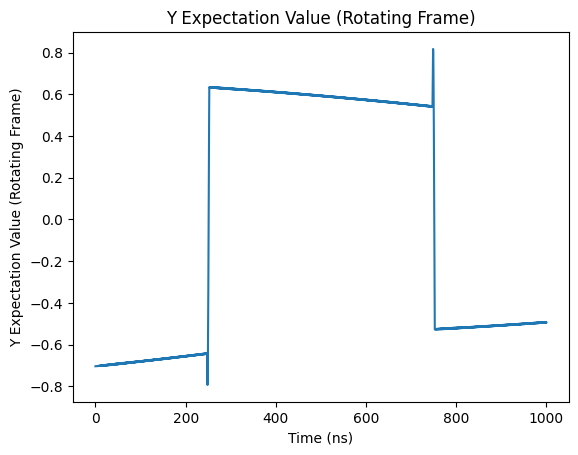

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

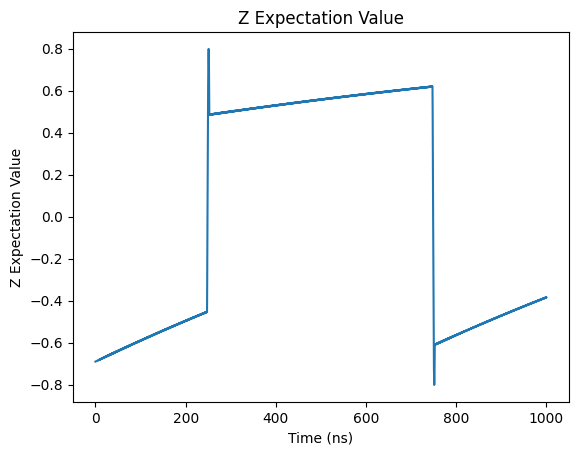

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

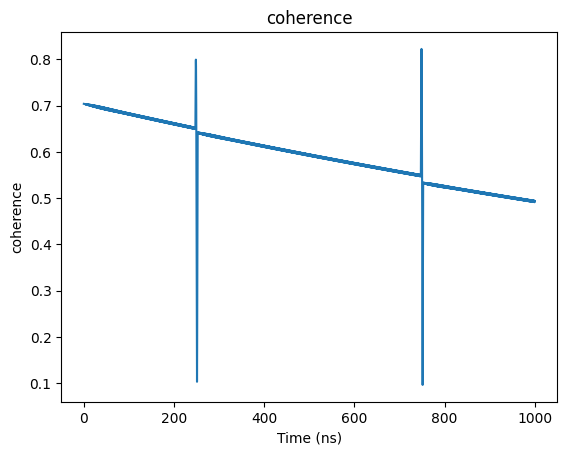

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

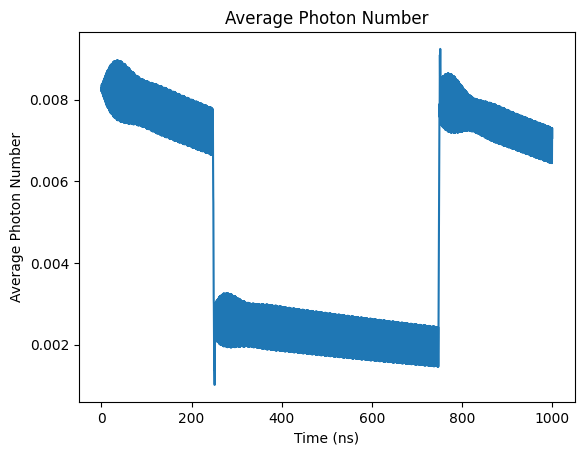

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

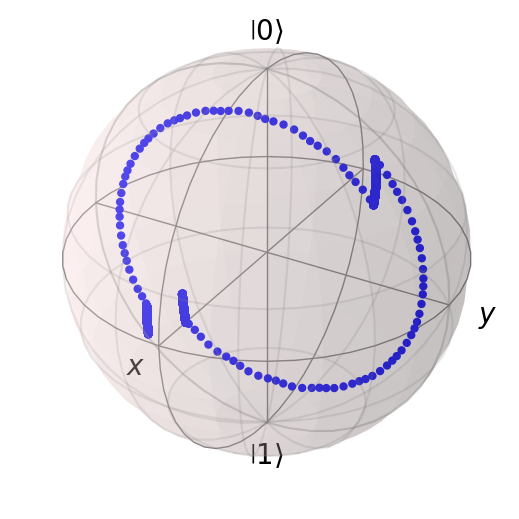

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004950887690525803


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

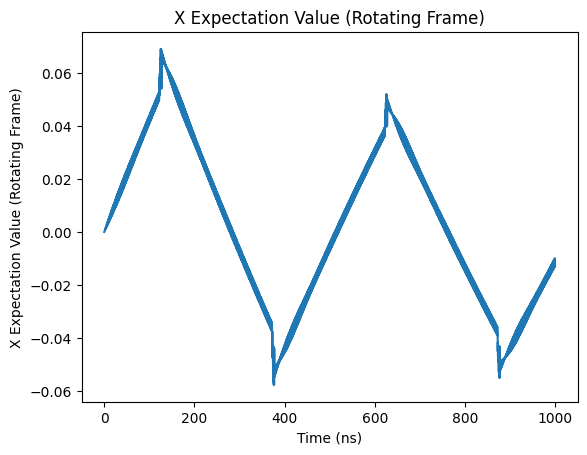

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

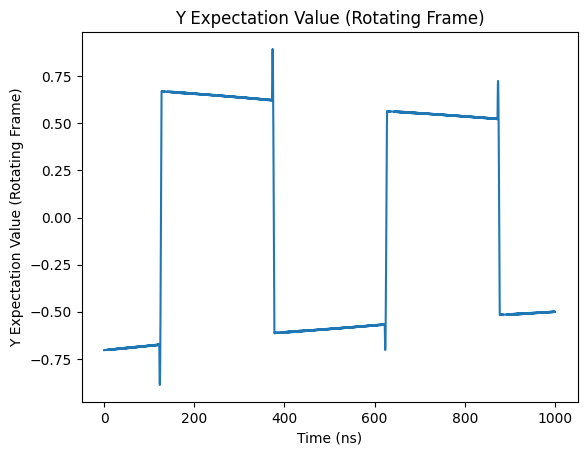

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

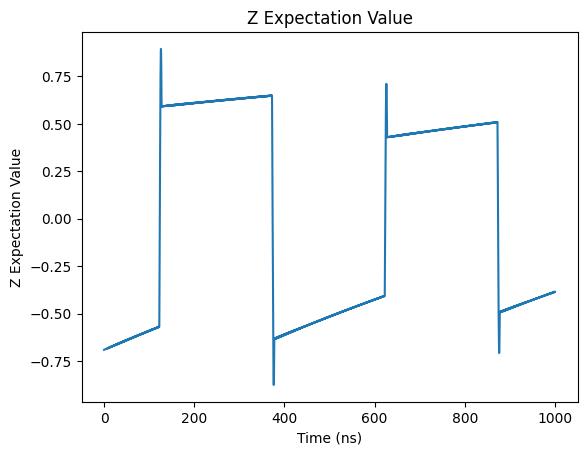

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

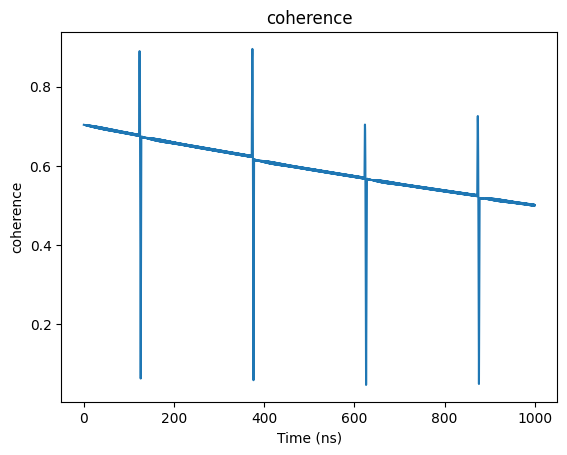

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

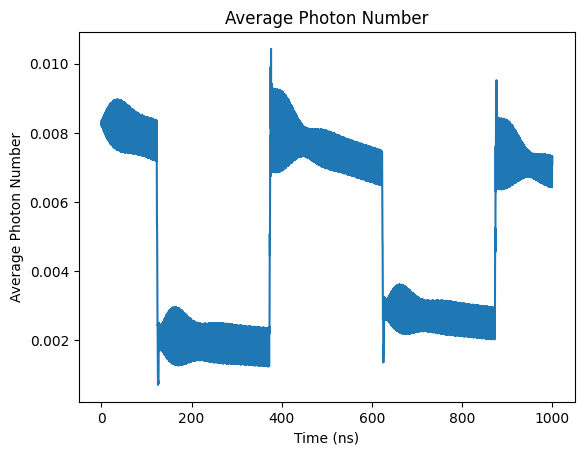

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

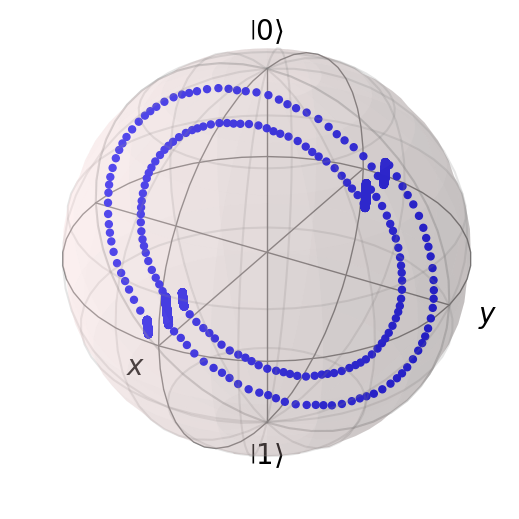

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004924498344789738


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

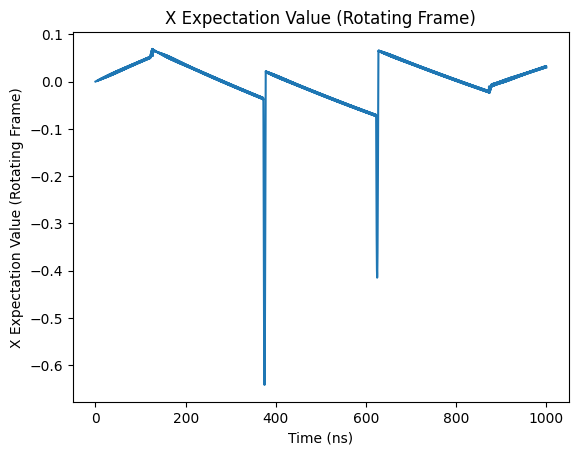

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

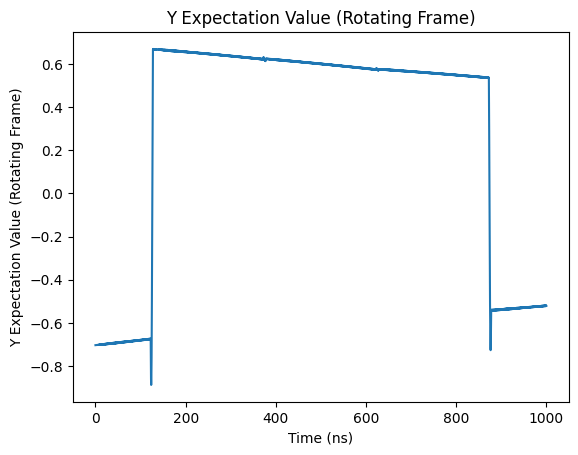

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

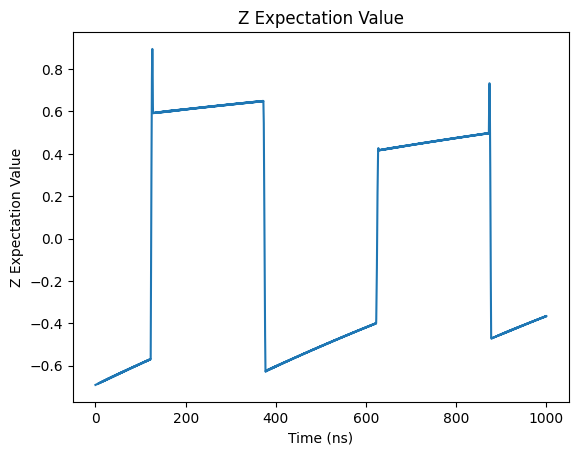

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

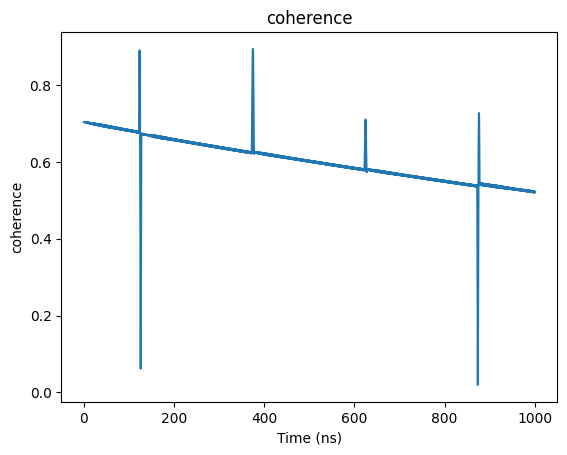

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

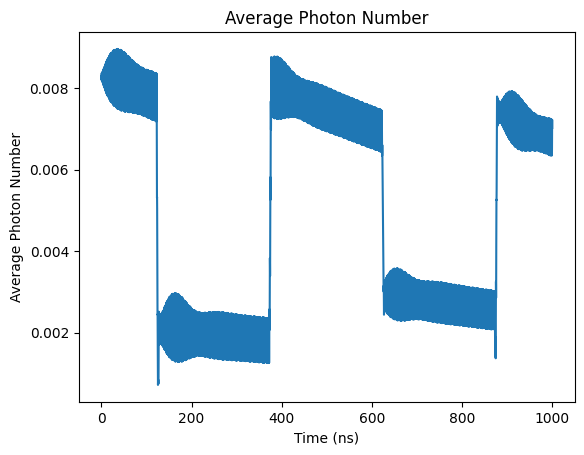

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

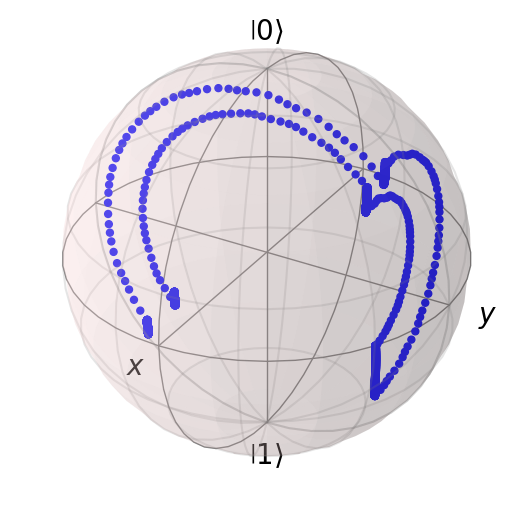

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004983558822354575


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

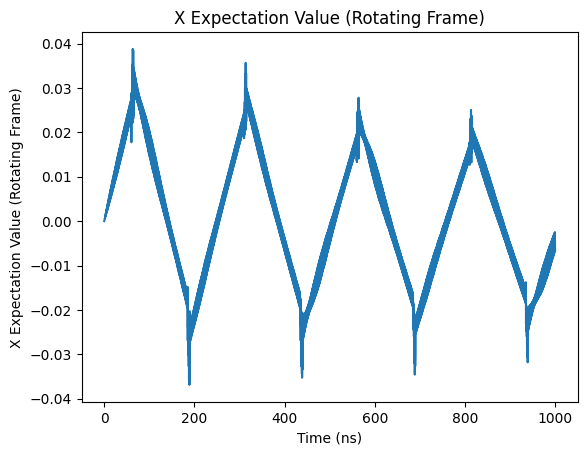

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

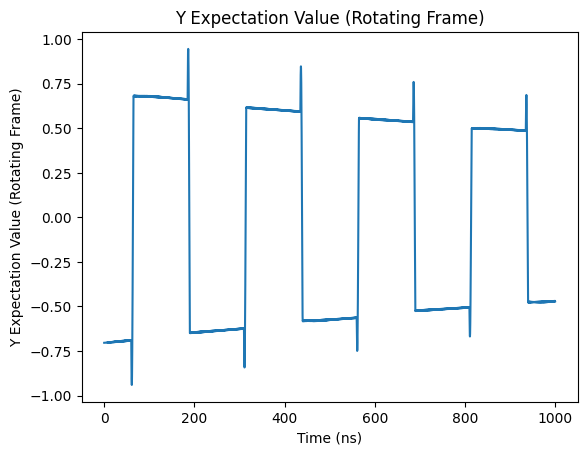

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

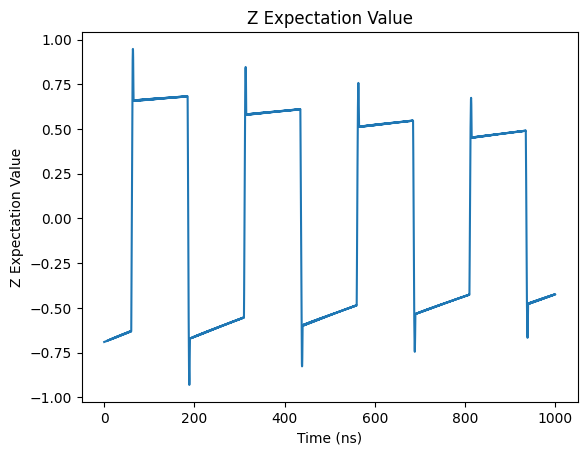

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

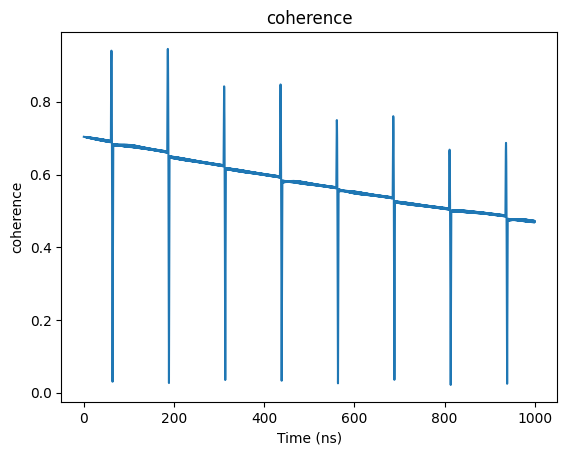

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

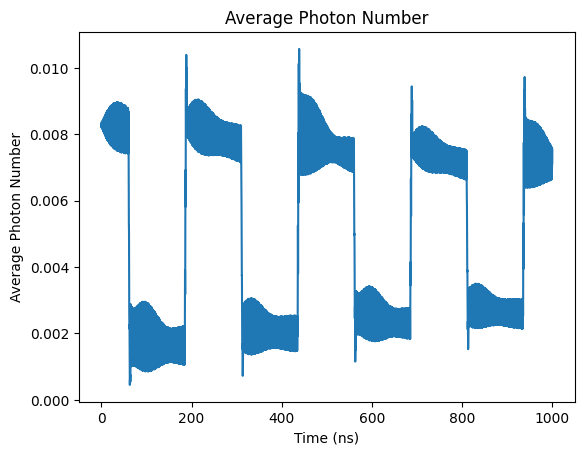

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

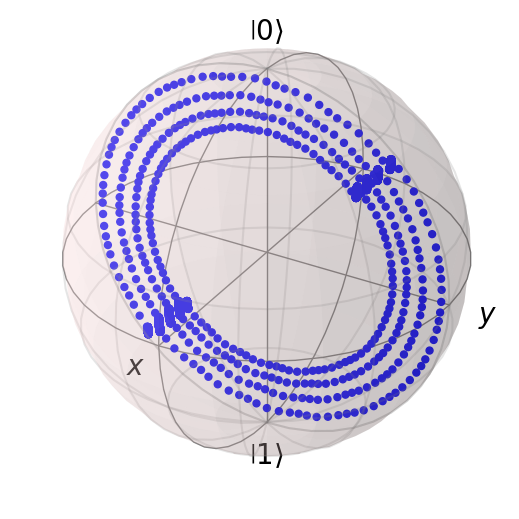

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.0049868638567702


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

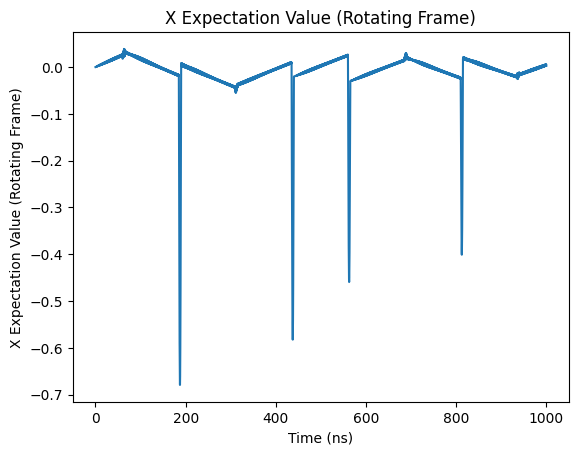

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

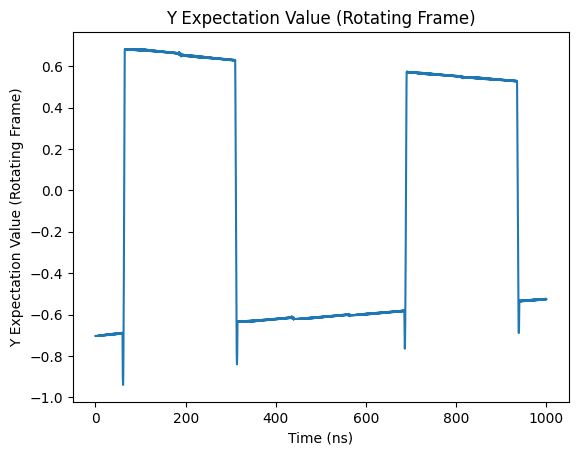

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

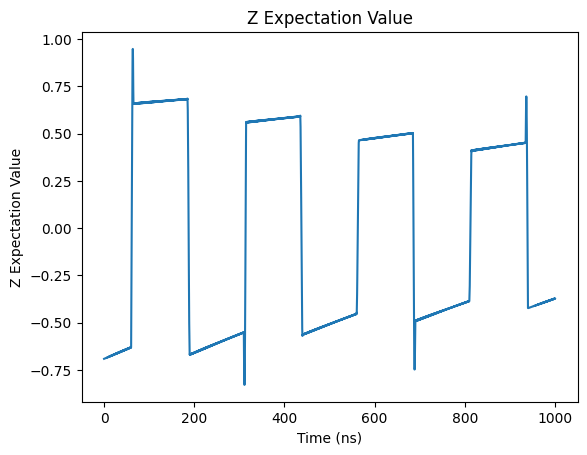

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

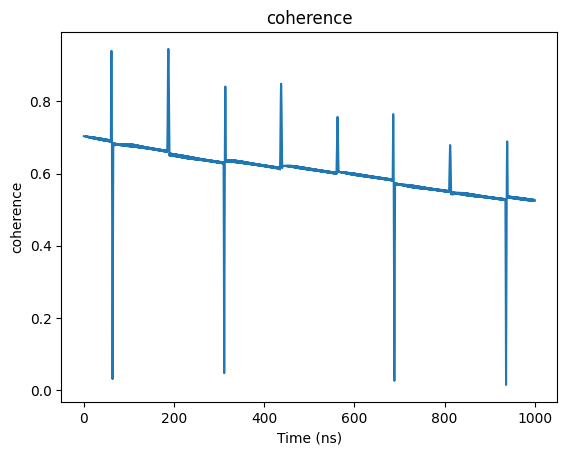

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

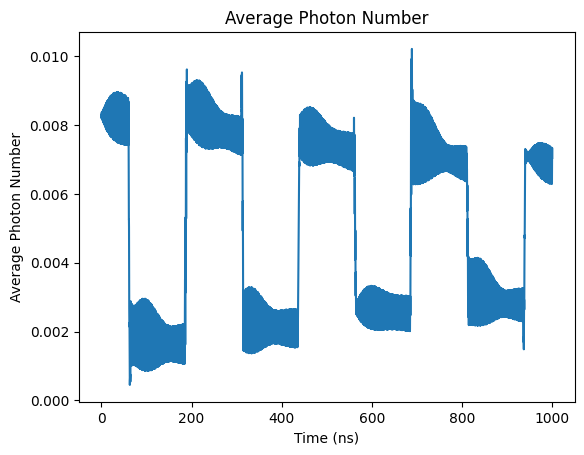

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

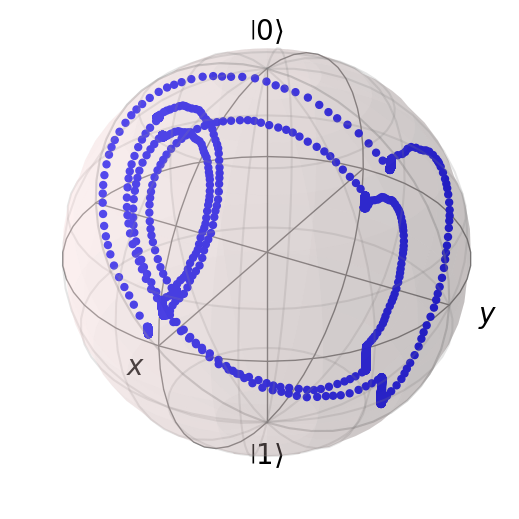

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005051033642797538


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

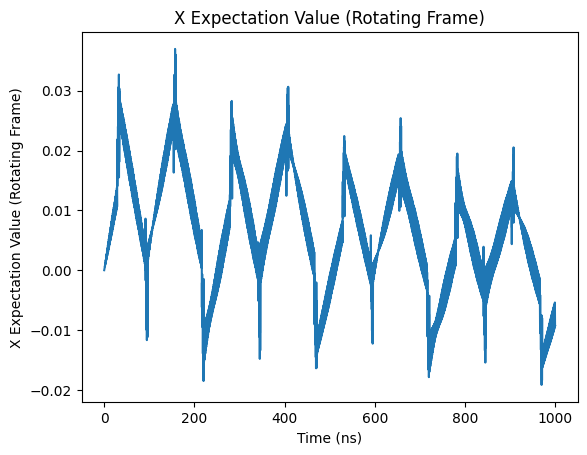

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

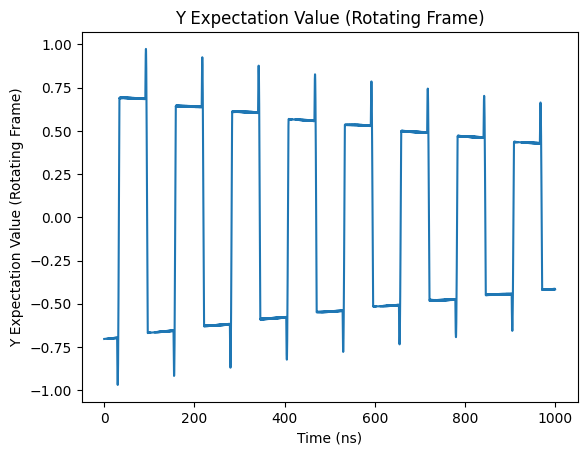

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

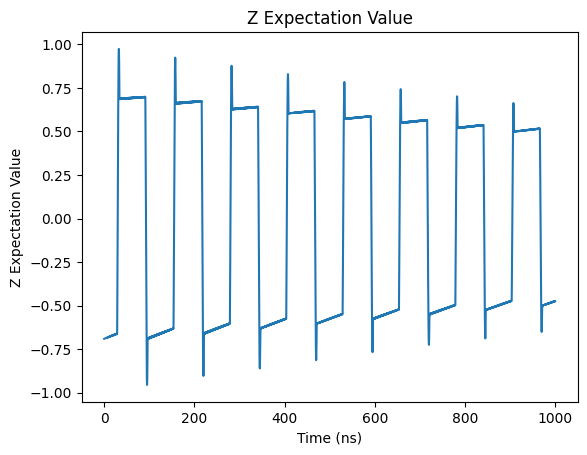

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

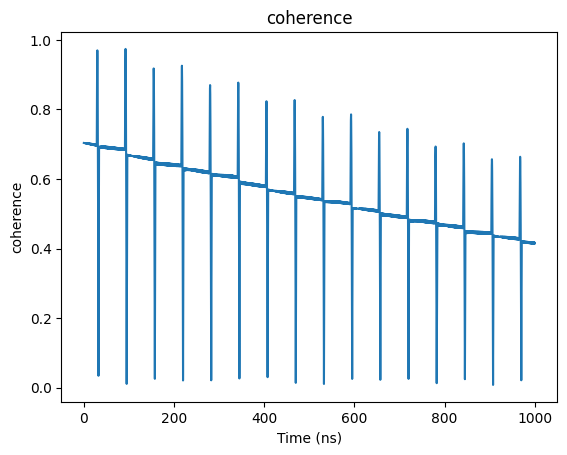

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

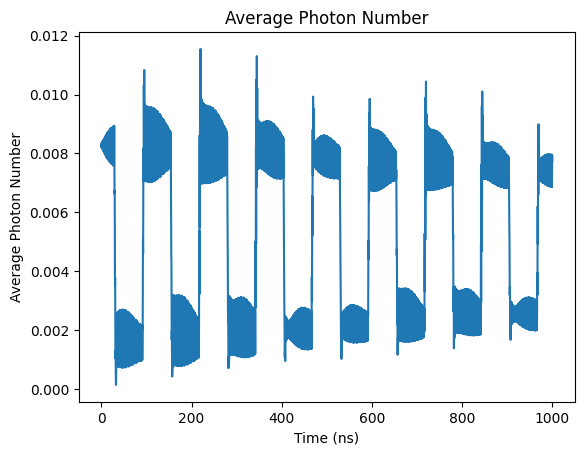

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

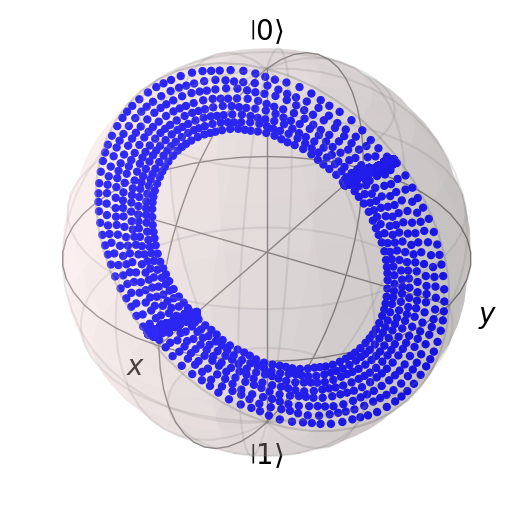

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005047623771867313


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

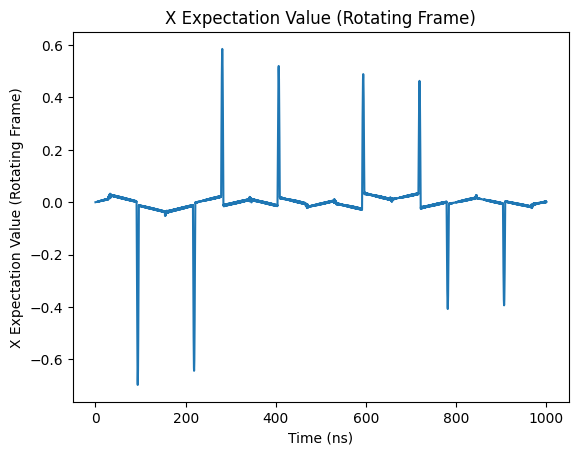

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

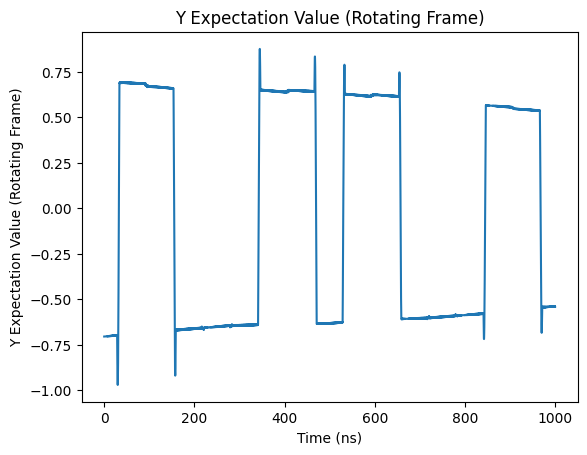

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

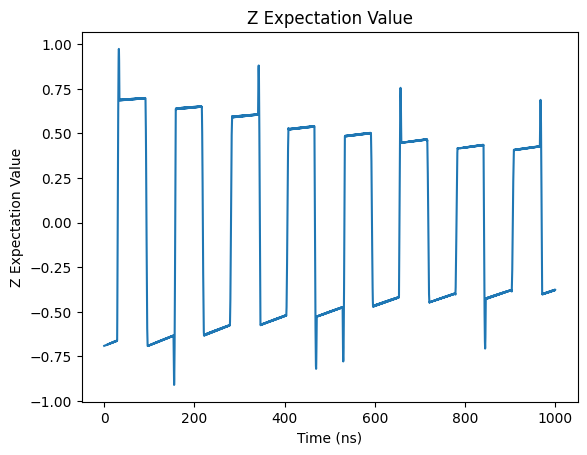

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

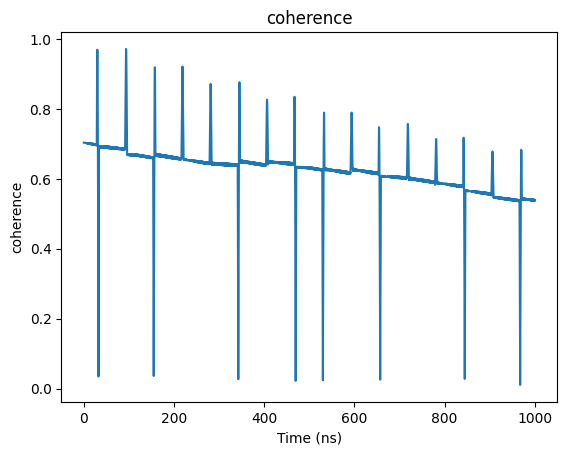

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

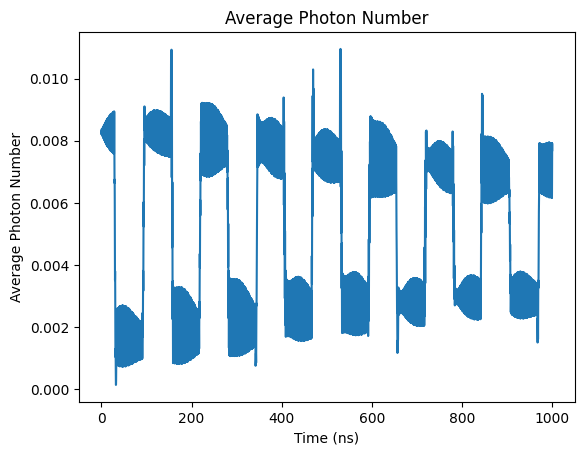

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

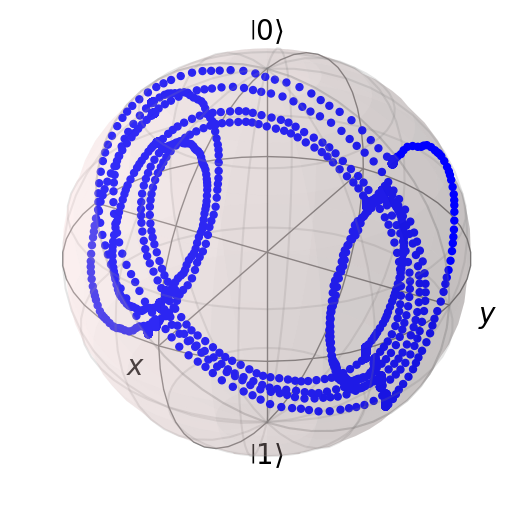

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [ ]:
x_list

[0.29953102316402036,
 -0.00012761295906211752,
 -0.011449656824780982,
 0.03145088936968175,
 -0.004593259366200914,
 0.004445728080665704,
 -0.007428206744498875,
 0.0017716695315230257]

In [ ]:
y_list

[-0.416389618856288,
 -0.49284081874537655,
 -0.5000711911306946,
 -0.5209062464858557,
 -0.47064753306211327,
 -0.5255696267297415,
 -0.41564922559834344,
 -0.5382972812094289]

In [ ]:
z_list

[0.08125581939573012,
 -0.3848799050831134,
 -0.3852215023618896,
 -0.36606248865990554,
 -0.4244326487797149,
 -0.3721813011744962,
 -0.4748334252950802,
 -0.37729333836659185]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{3\pi}{8}) |0\rangle + e^{j\frac{2\pi}{2}} \sin(\frac{3\pi}{8}) |1\rangle $

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(3*np.pi/8) * psi_20 + np.exp(1j*np.pi*2/2) * np.sin(3*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [ ]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.006288916981746009
[-0.7036655234717203, -8.61741730989989e-17, -0.6905313510795019]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

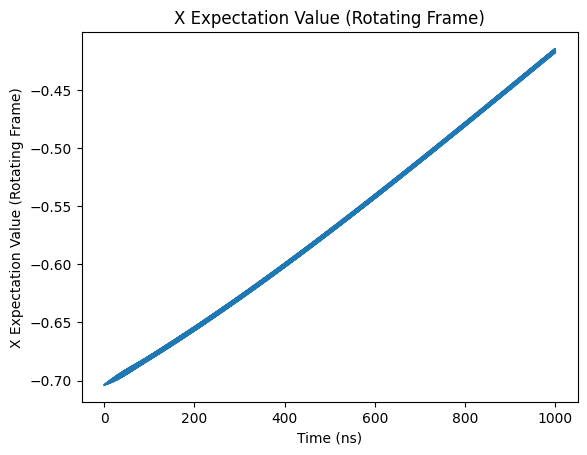

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

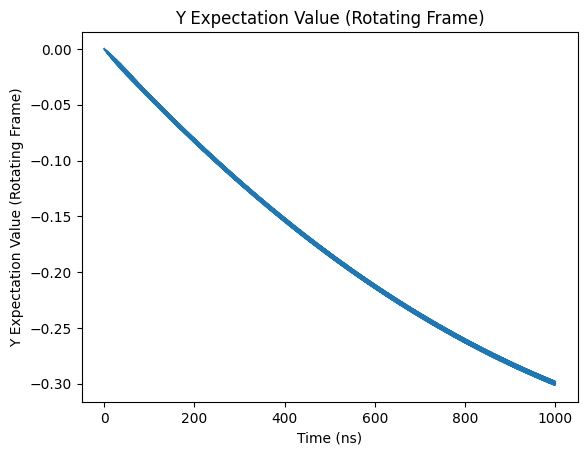

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

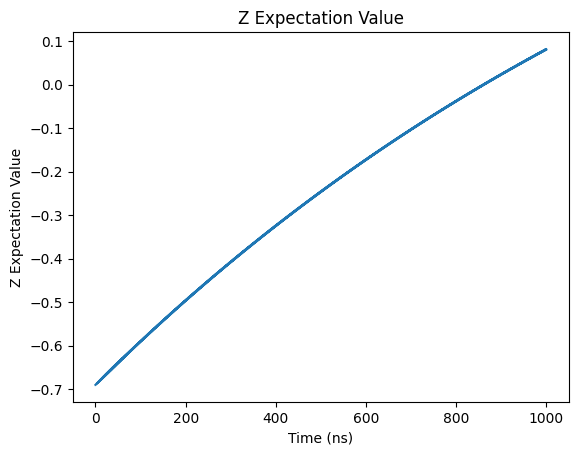

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

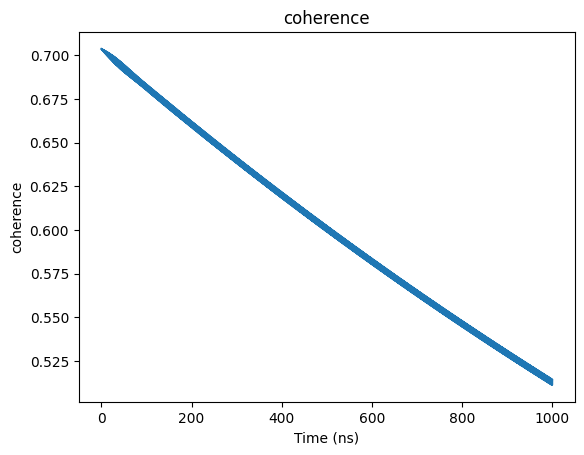

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

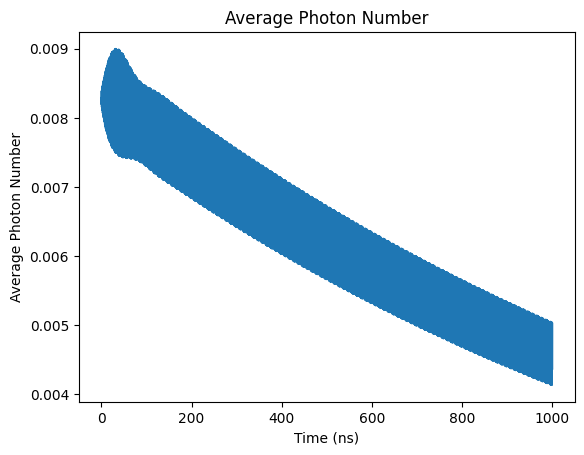

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

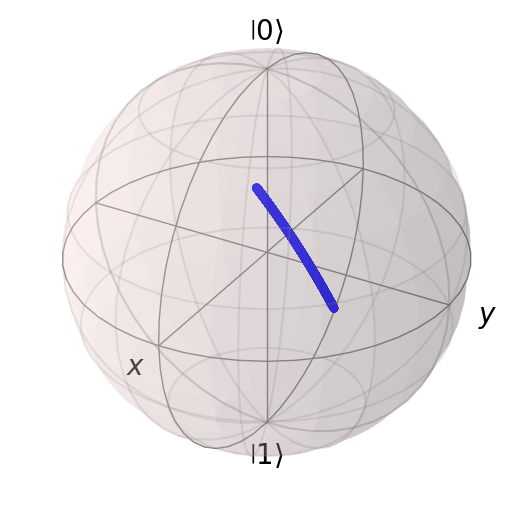

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [ ]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.0049312329991352995


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

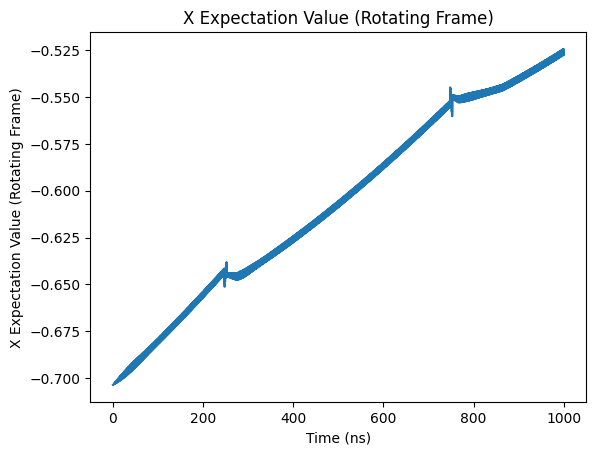

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

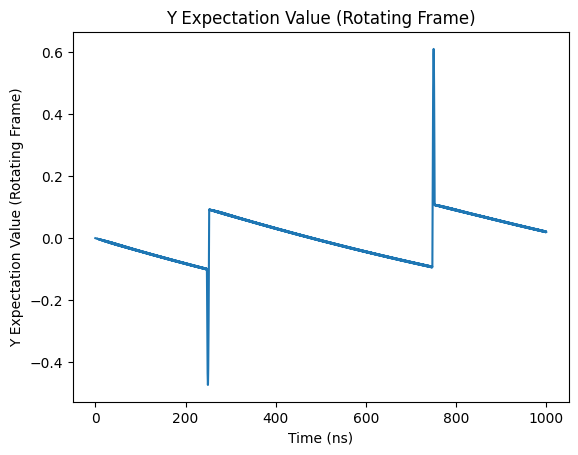

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

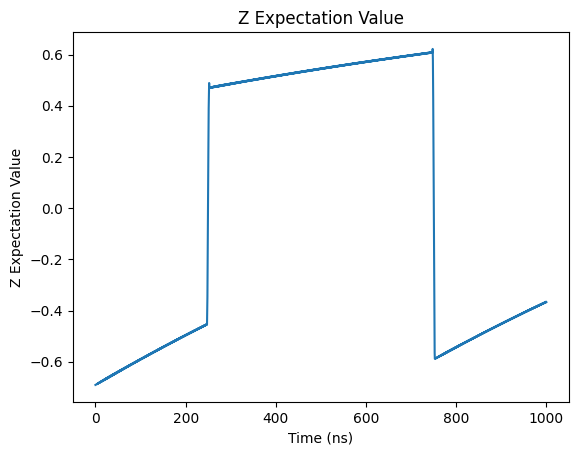

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

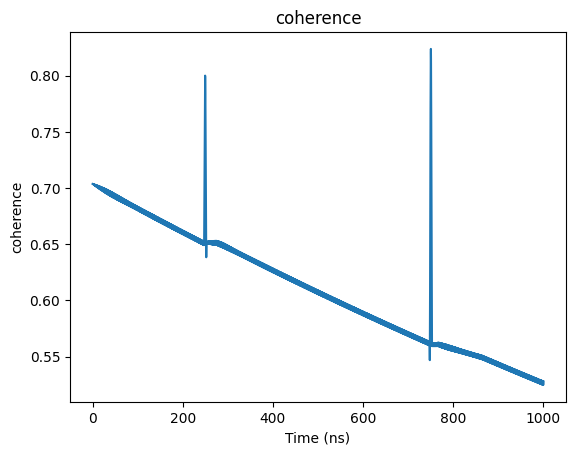

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

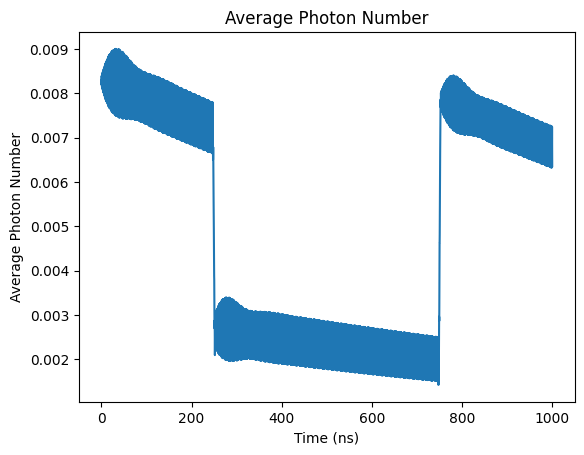

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

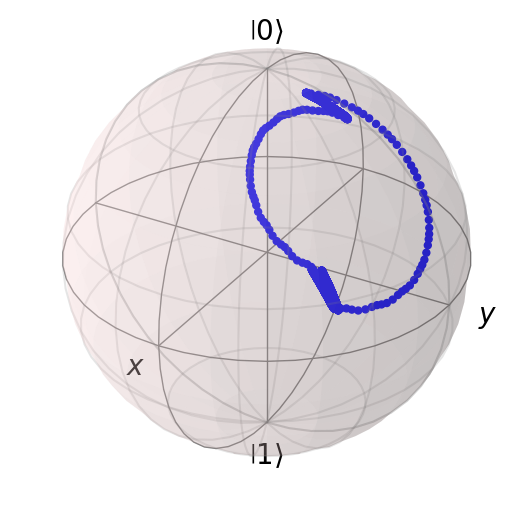

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004904827871360224


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

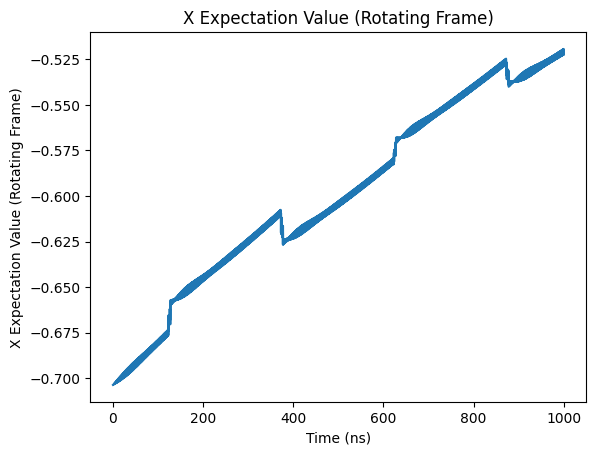

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

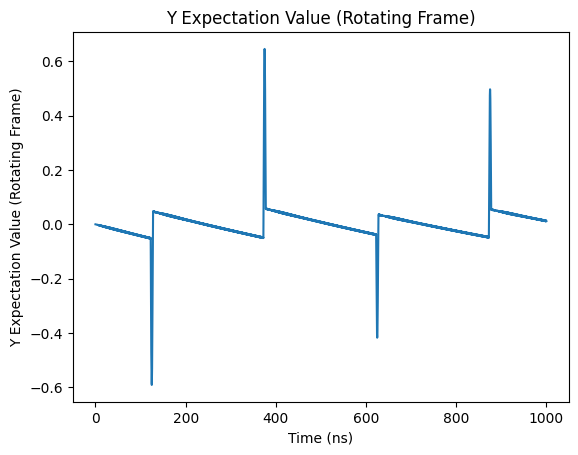

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

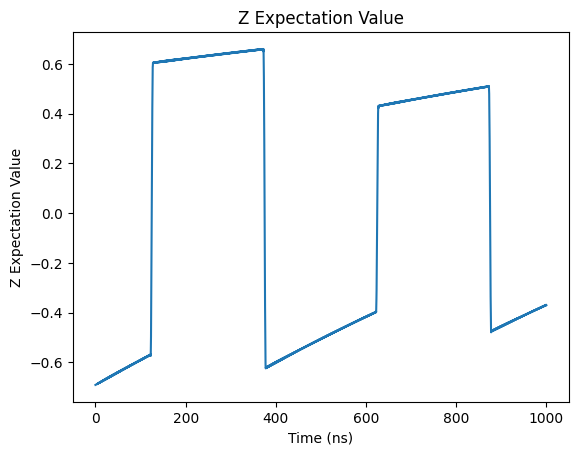

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

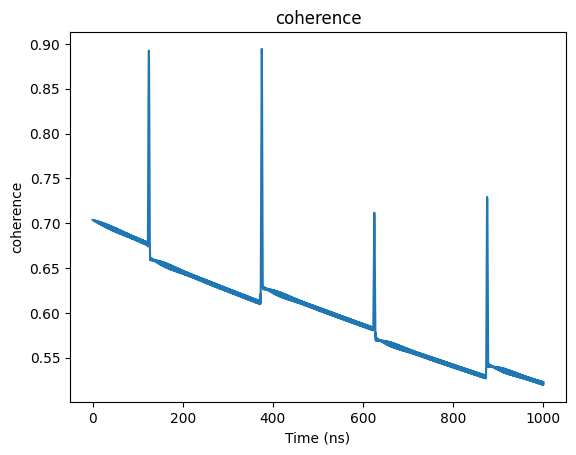

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

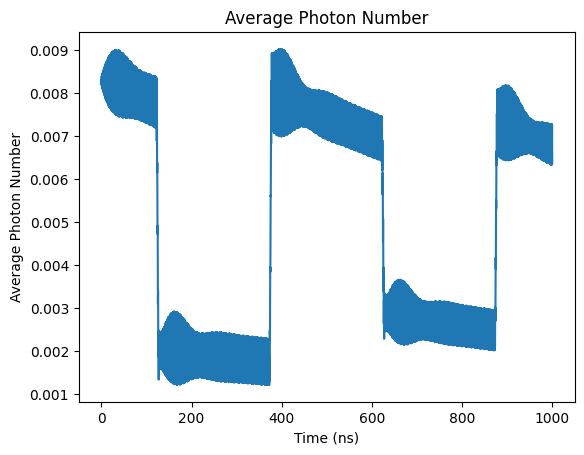

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

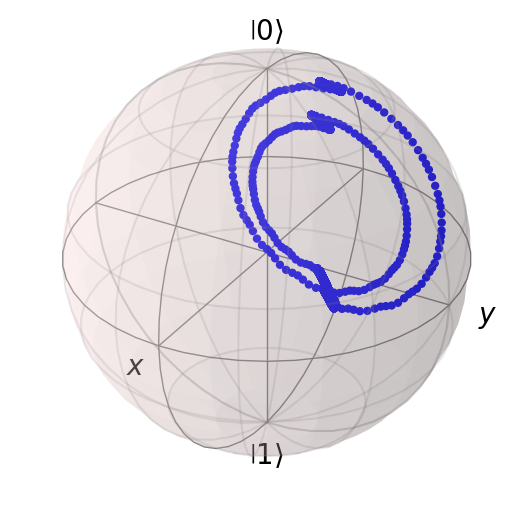

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004979517180087391


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

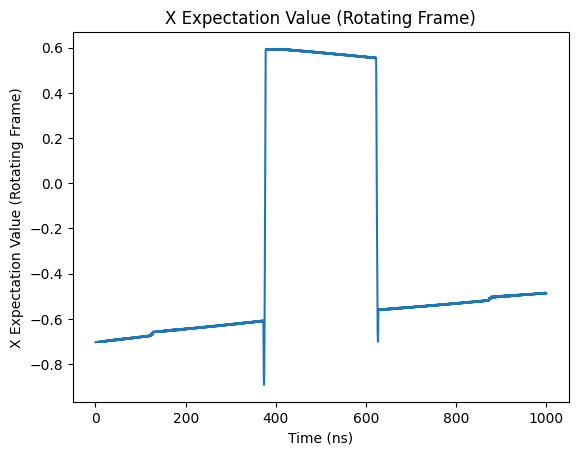

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

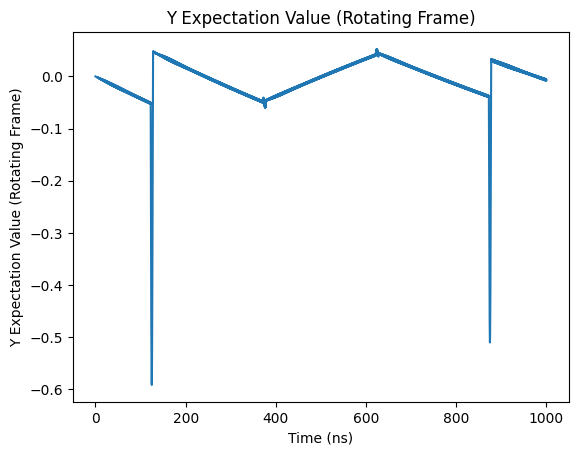

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

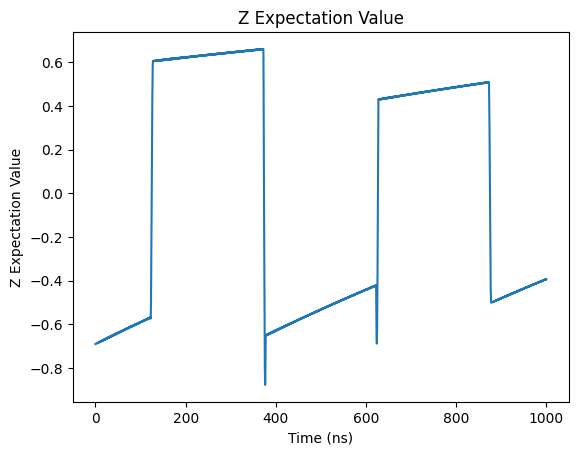

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

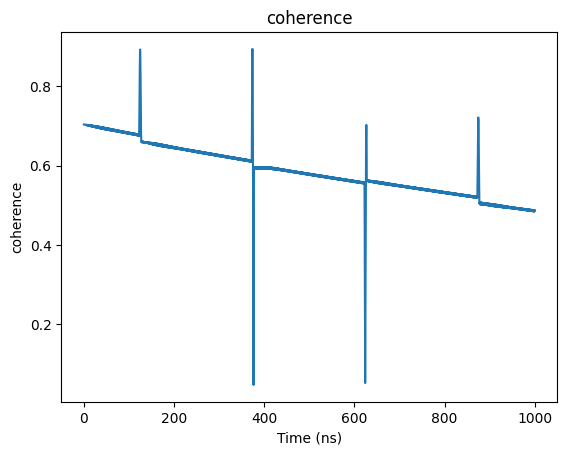

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

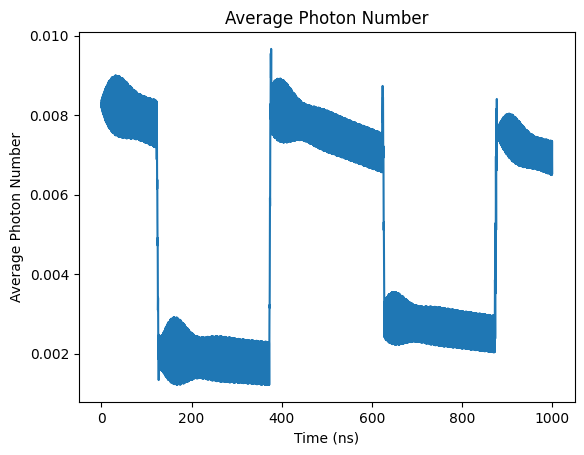

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

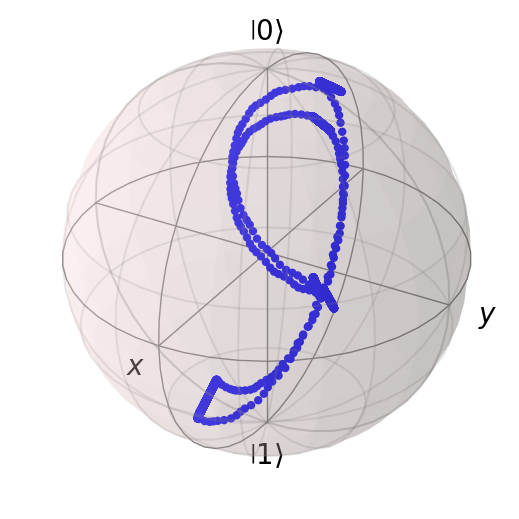

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004953262607133556


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

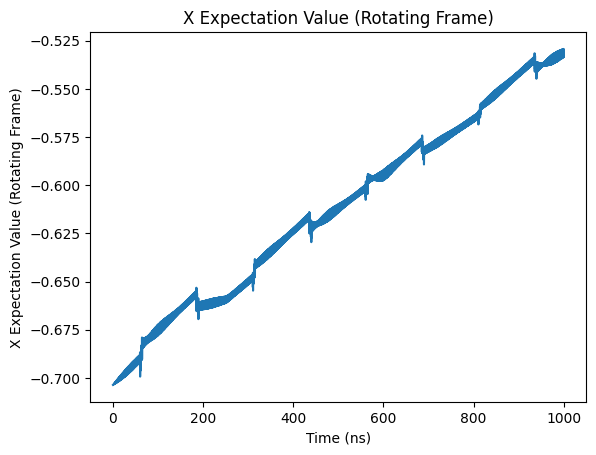

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

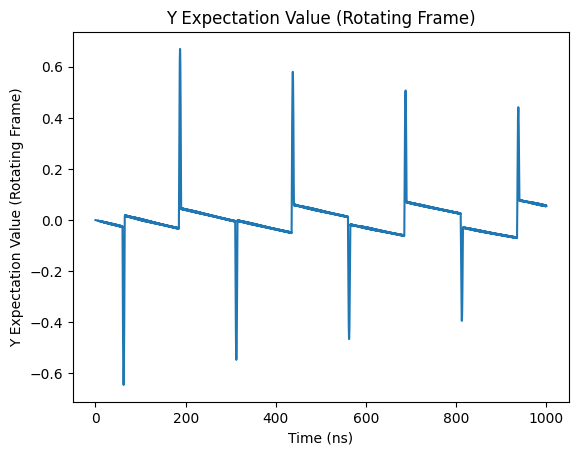

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

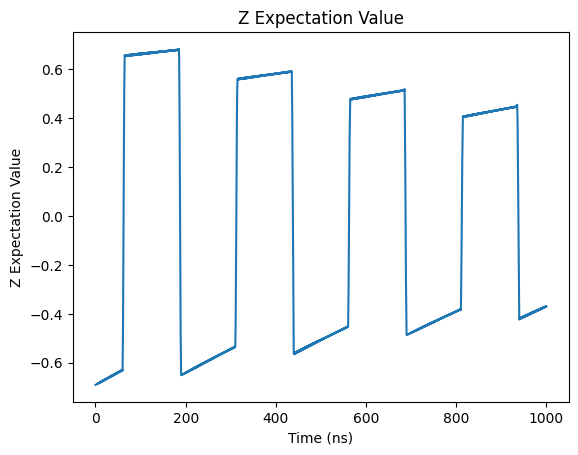

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

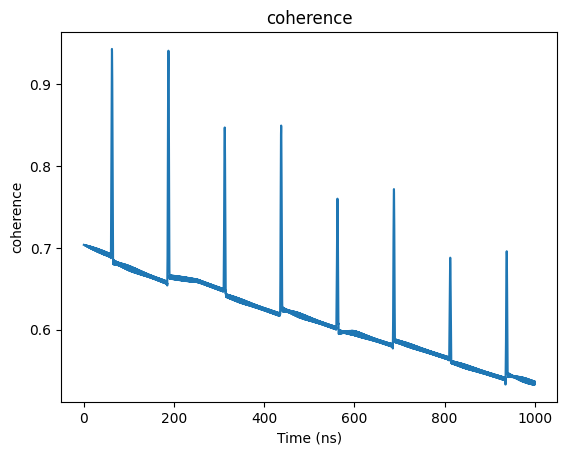

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

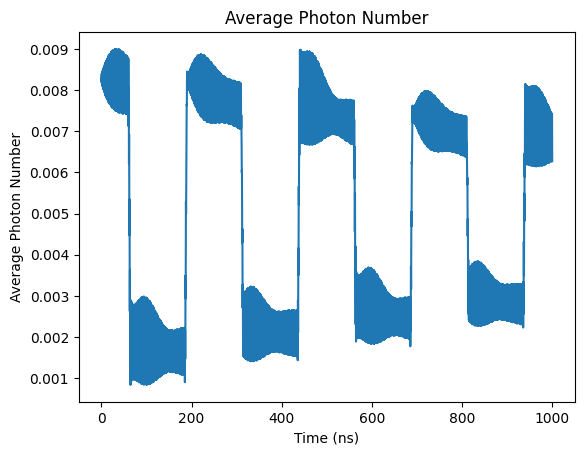

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

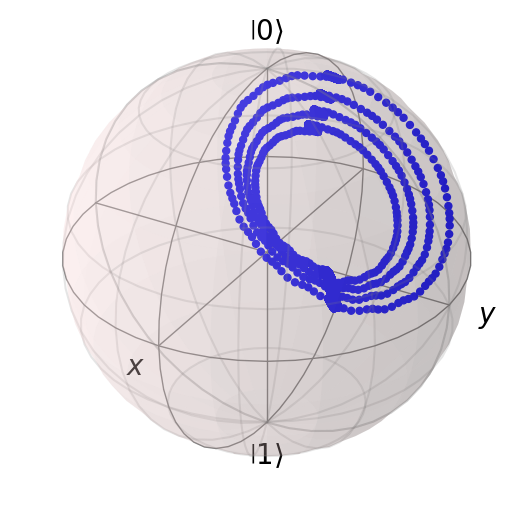

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.00498416091972908


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

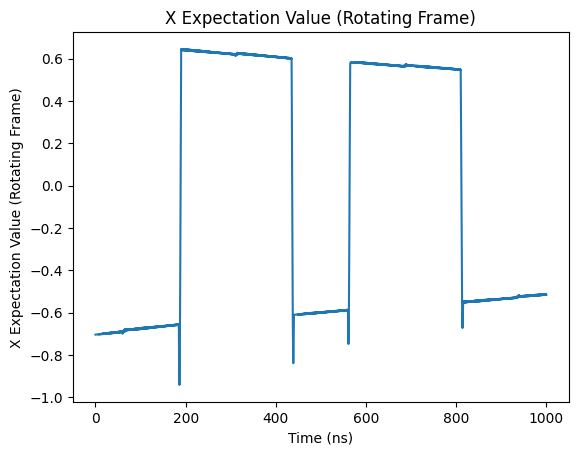

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

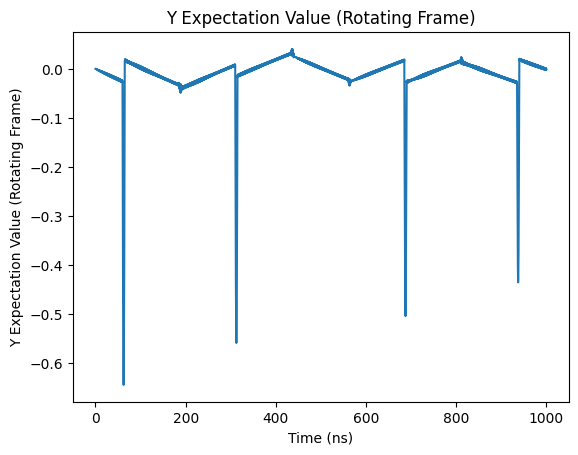

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

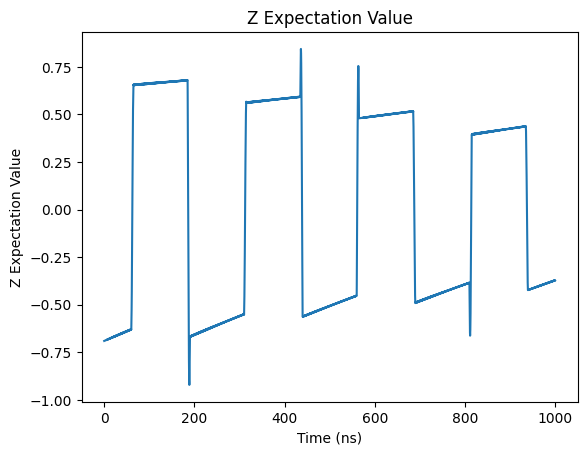

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

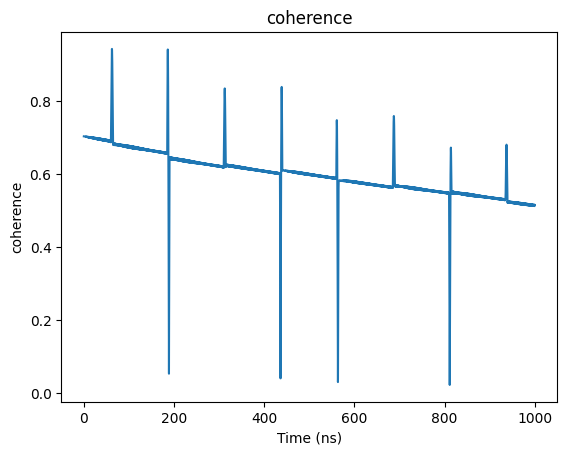

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

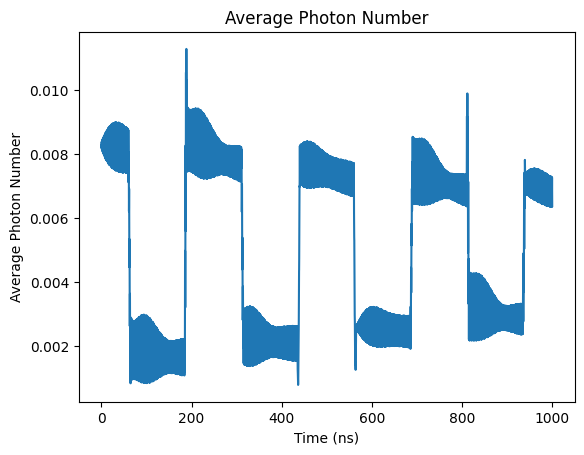

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

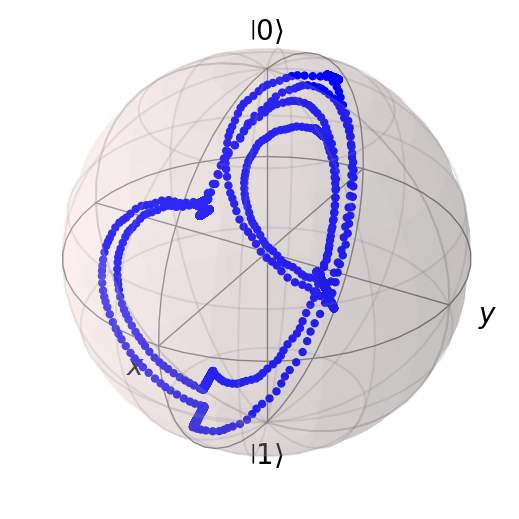

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005005794674940651


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

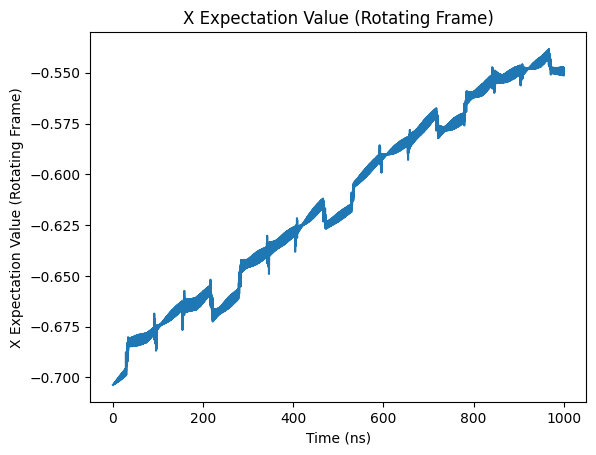

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

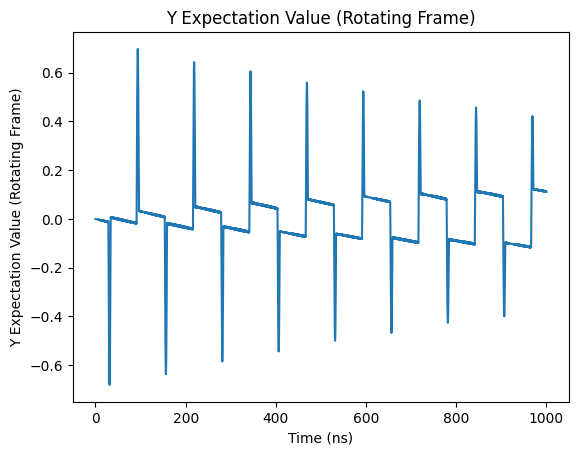

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

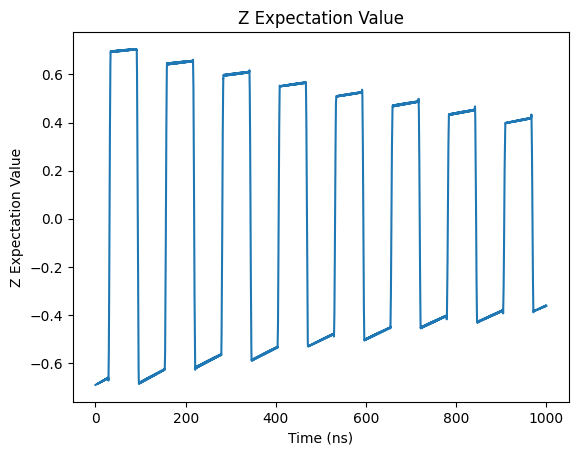

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

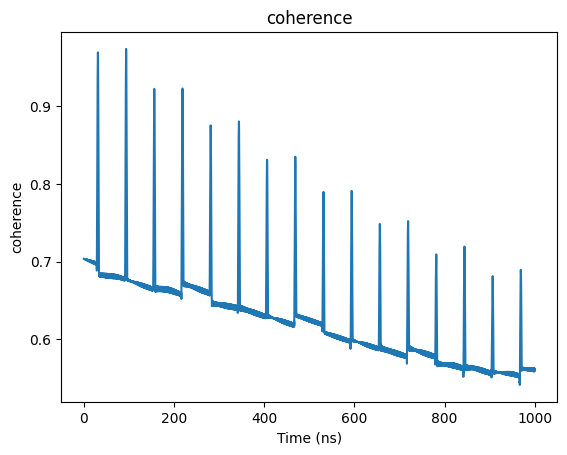

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

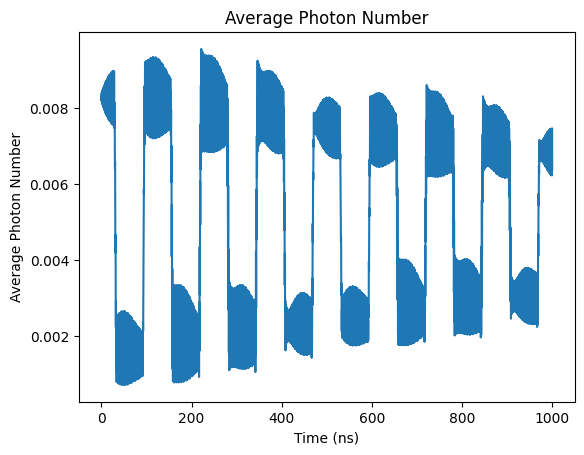

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

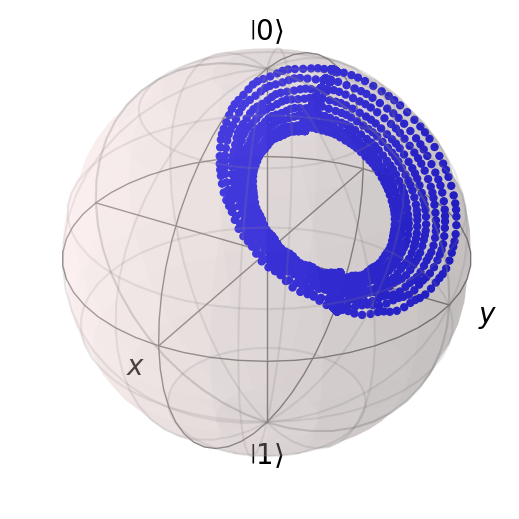

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005047793078268954


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

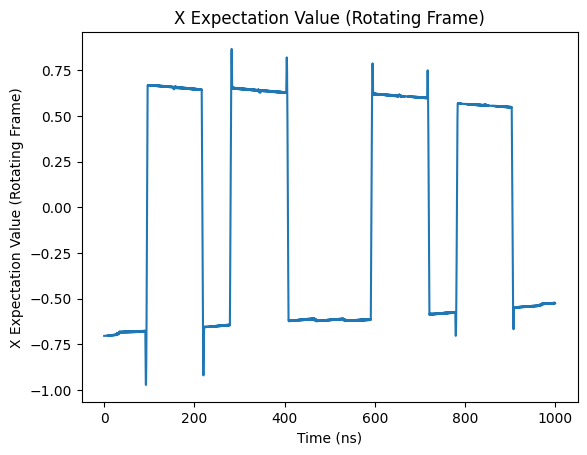

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

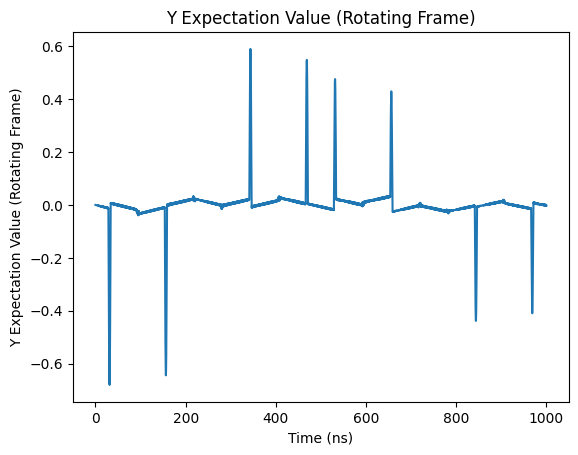

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

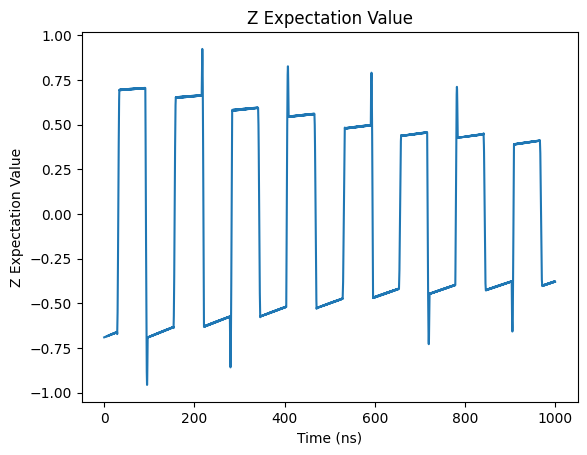

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

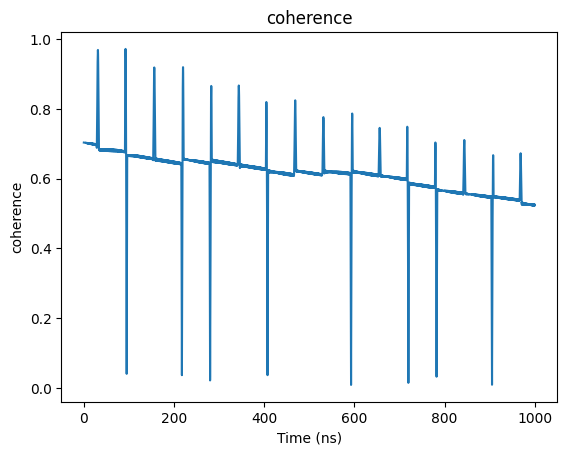

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

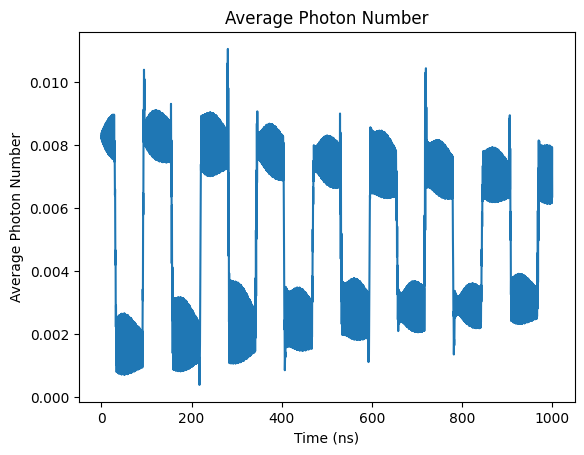

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

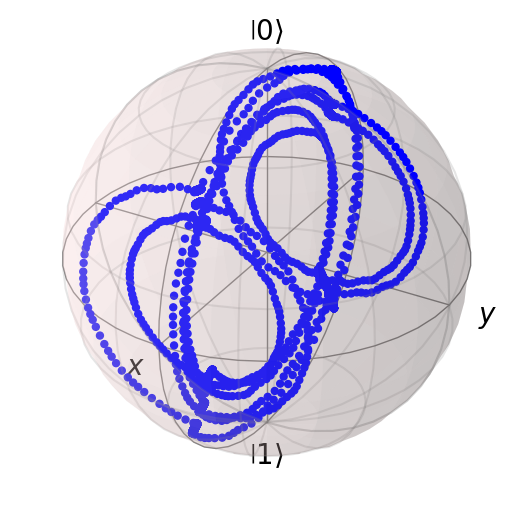

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [ ]:
x_list

[-0.4163959168108466,
 -0.5258896361299359,
 -0.5209192117815493,
 -0.48592957852174906,
 -0.5313811090949407,
 -0.5140645457924532,
 -0.5493112412156155,
 -0.5241868428079319]

In [ ]:
y_list

[-0.2995567131950684,
 0.020393402483129337,
 0.012422280934228118,
 -0.006843223181006672,
 0.05551827682197613,
 -0.0009765754855665942,
 0.11241187944163451,
 -0.0017008499347847855]

In [ ]:
z_list

[0.08124963579244432,
 -0.3663651899552041,
 -0.3691867711146831,
 -0.3936866168648418,
 -0.3695087901885036,
 -0.372167729933263,
 -0.36112765095093163,
 -0.3780580908370367]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{3\pi}{8}) |0\rangle + e^{j\frac{3\pi}{2}} \sin(\frac{3\pi}{8}) |1\rangle $

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(3*np.pi/8) * psi_20 + np.exp(1j*np.pi*3/2) * np.sin(3*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [ ]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.006288882587226477
[-1.2926125964849837e-16, 0.7036655234717203, -0.6905313510795019]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

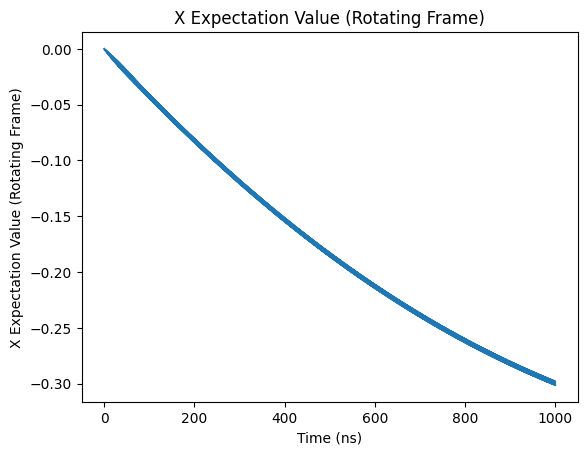

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

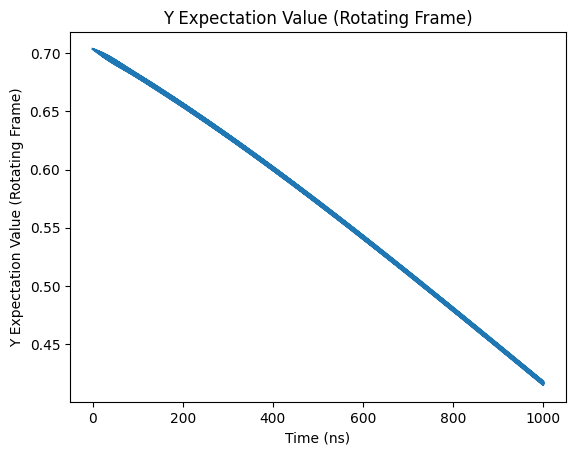

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

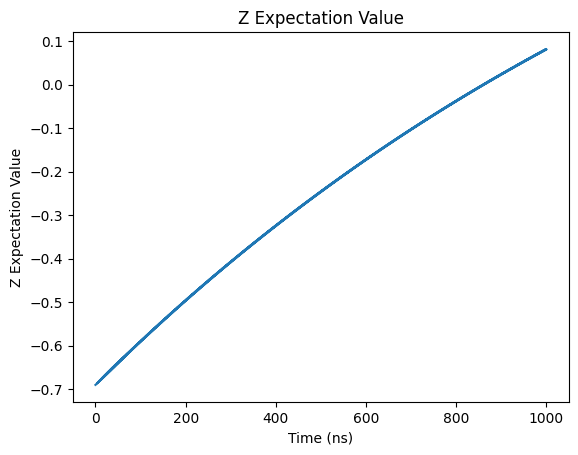

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

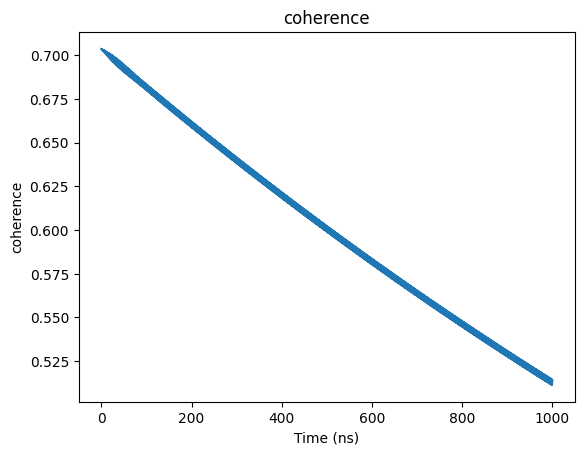

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

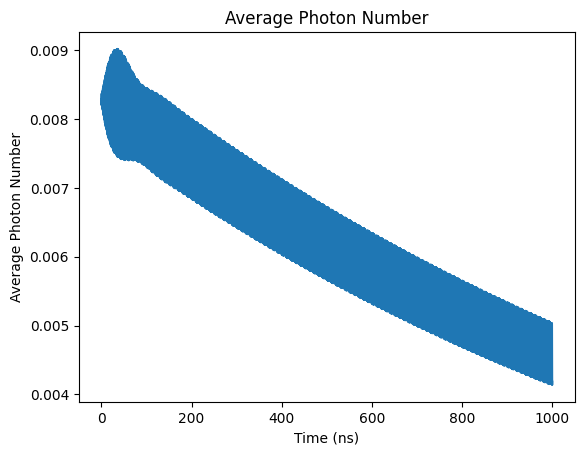

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

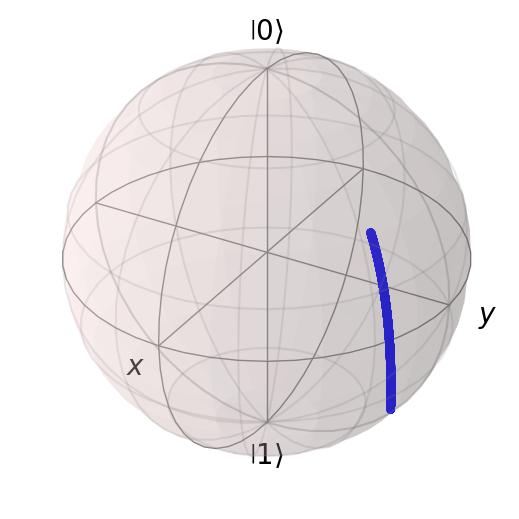

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [ ]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.00493933665039889


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

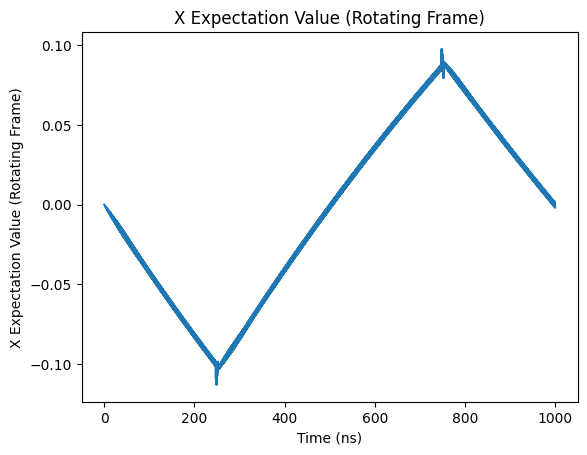

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

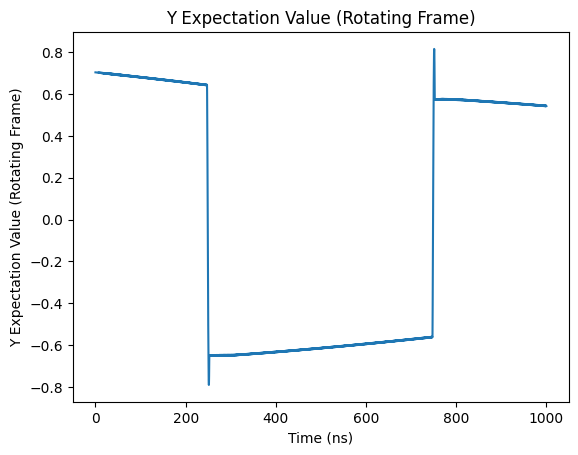

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

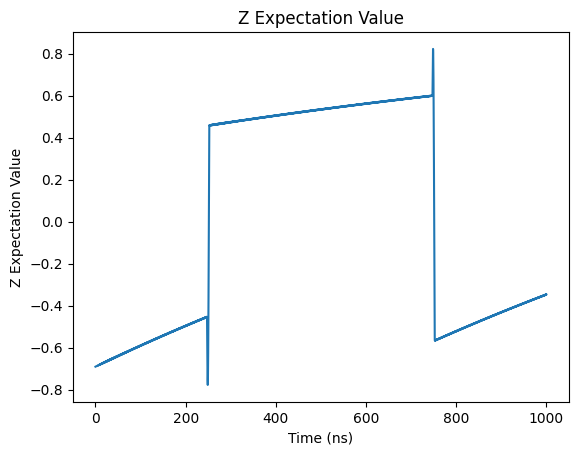

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

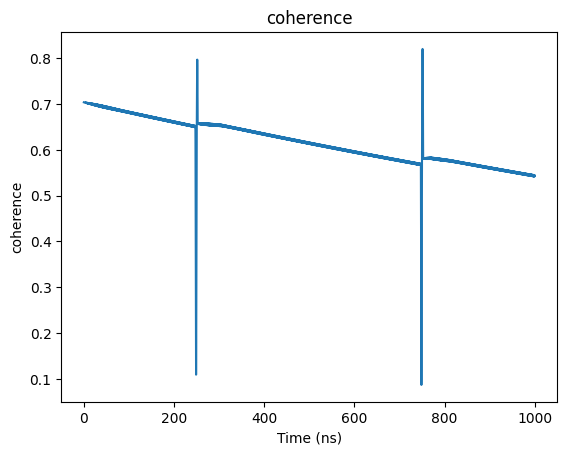

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

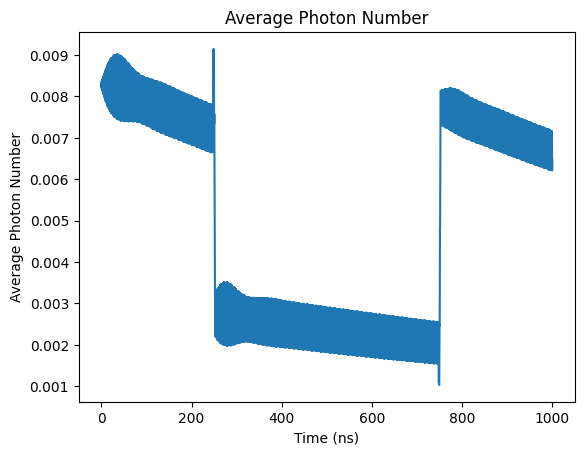

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

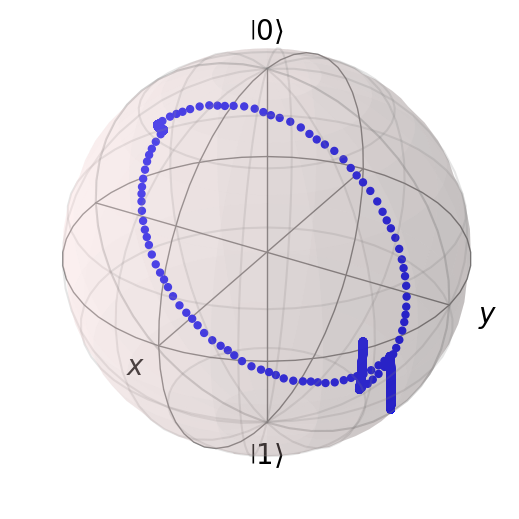

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.00495576387428708


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

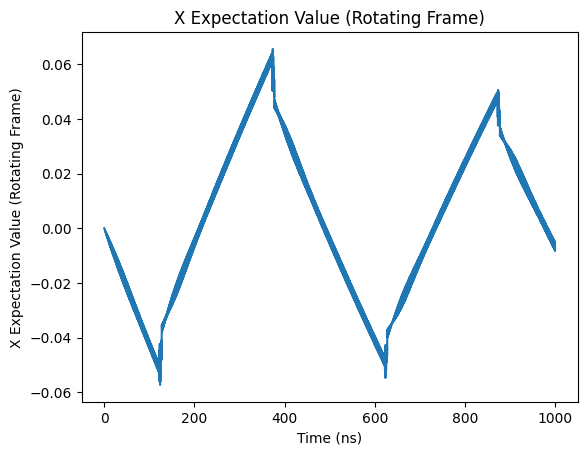

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

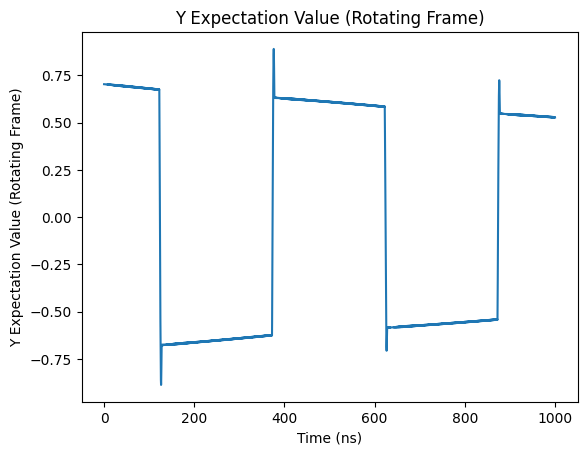

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

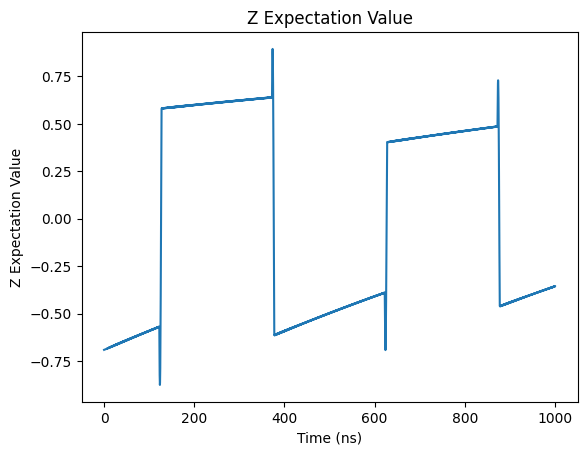

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

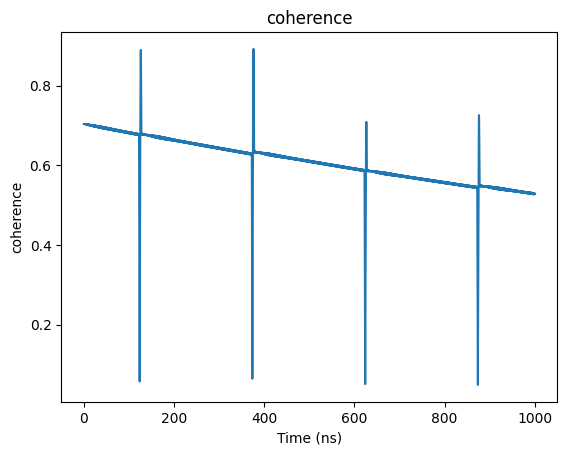

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

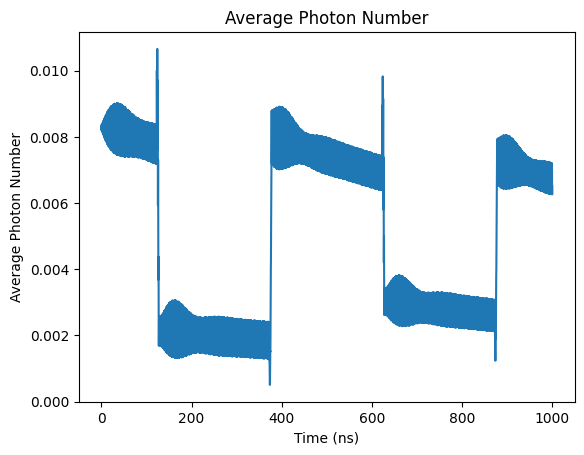

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

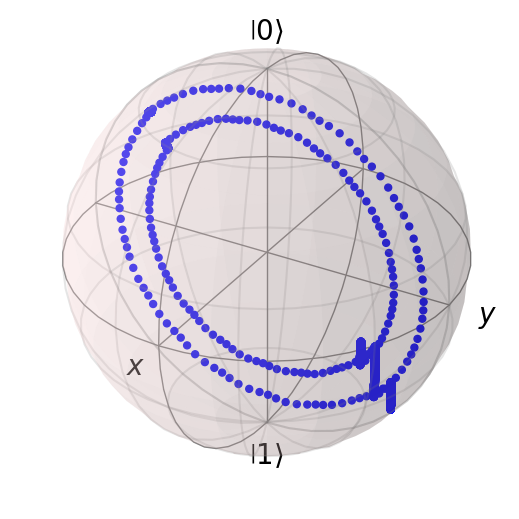

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004973251836377136


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

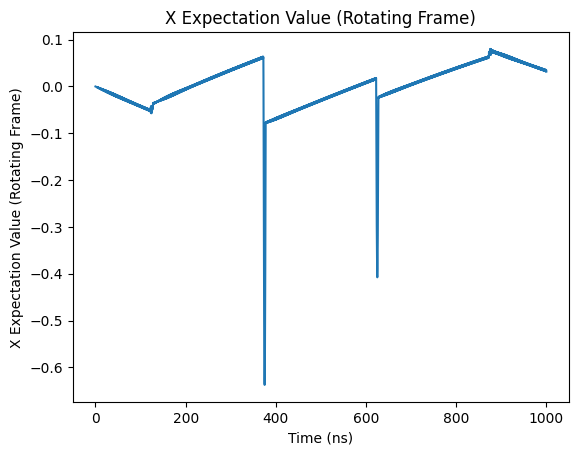

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

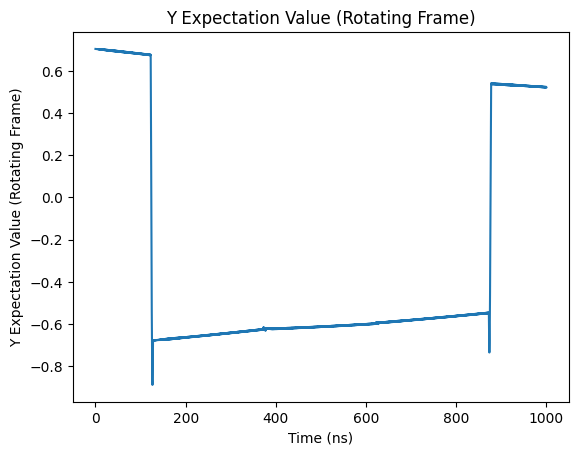

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

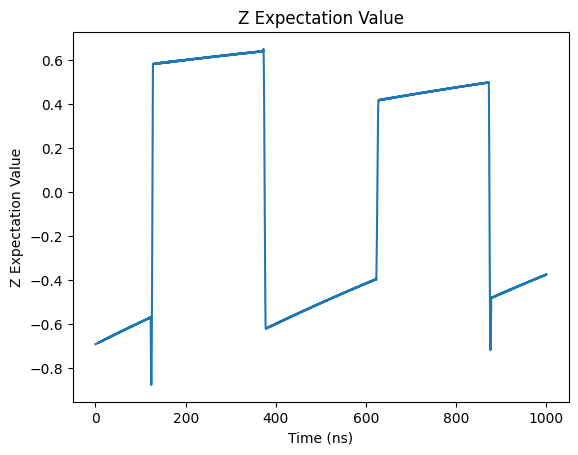

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

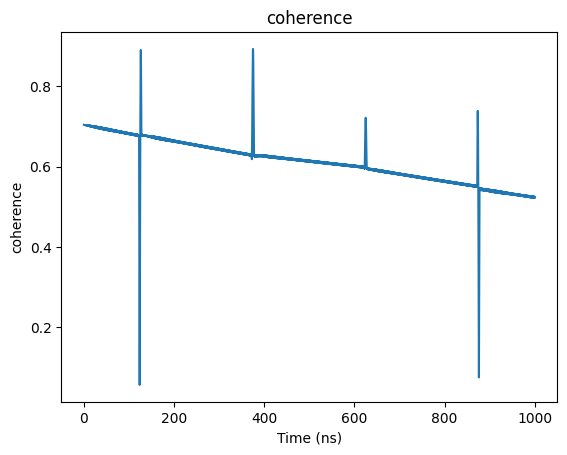

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

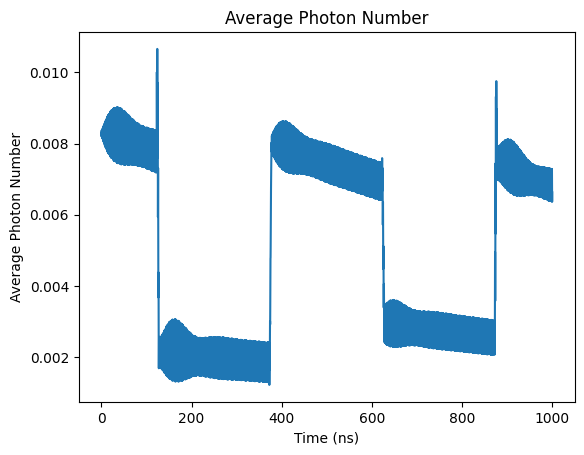

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

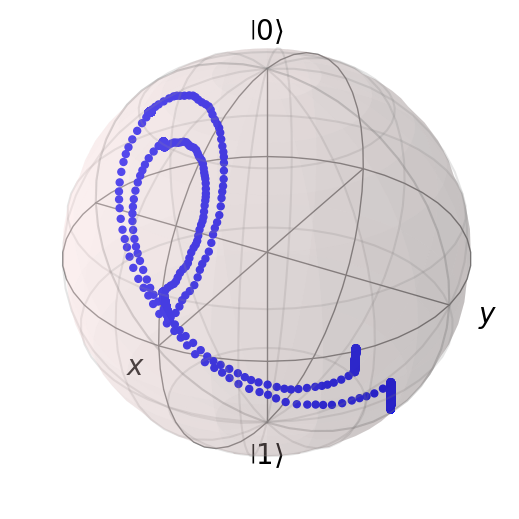

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004987818733413122


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

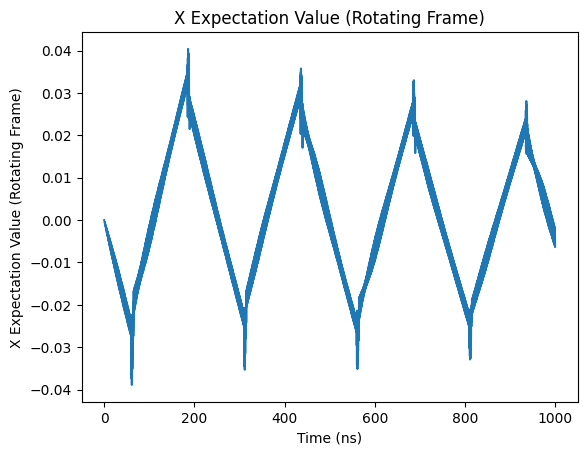

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

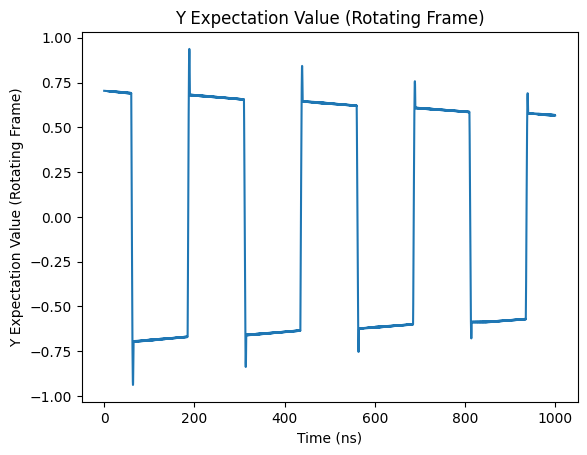

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

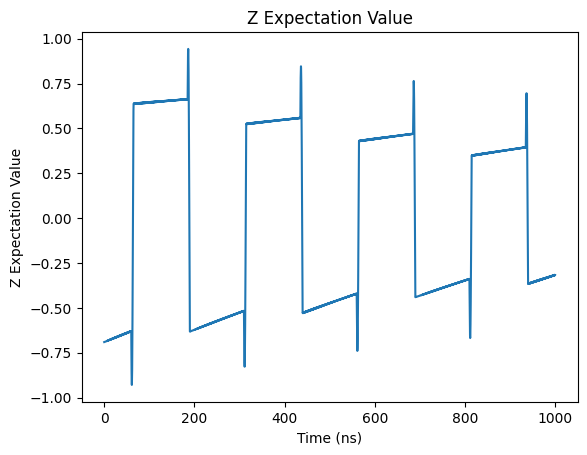

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

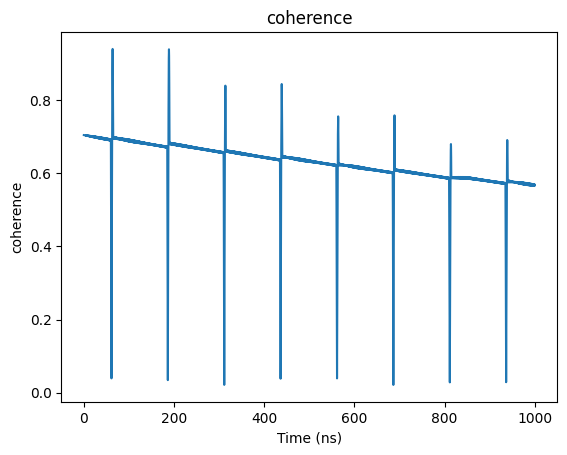

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

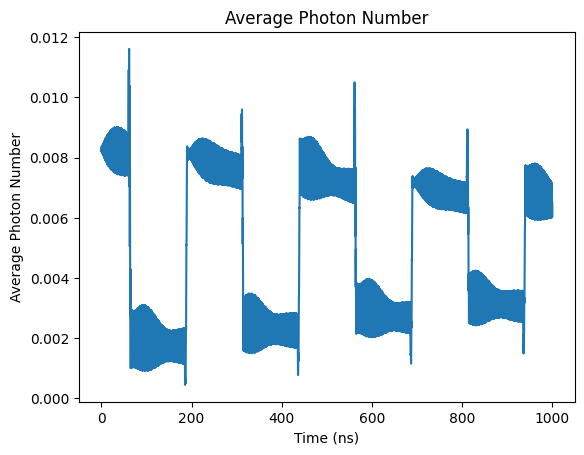

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

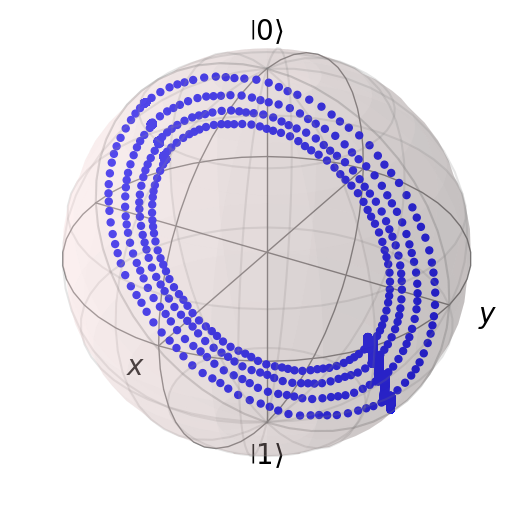

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004985528015618827


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

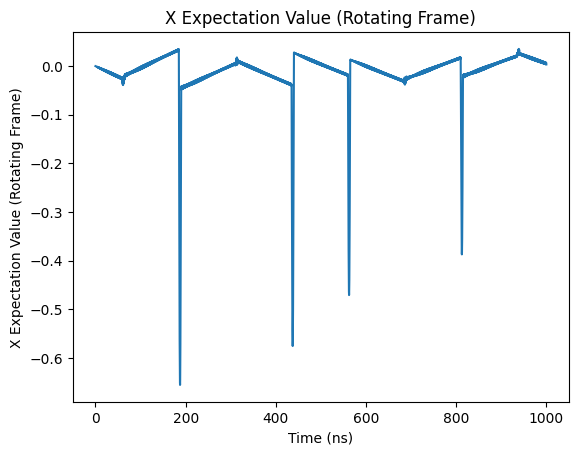

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

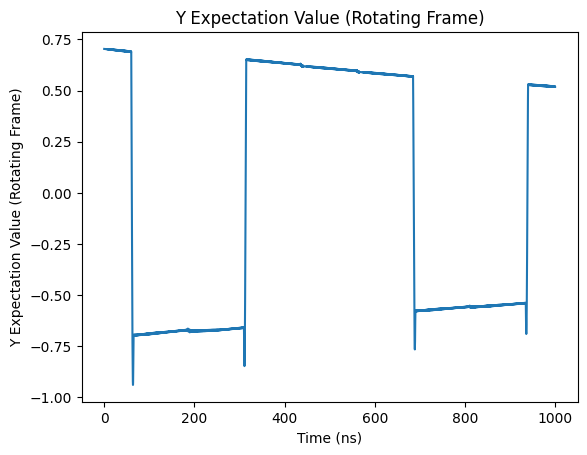

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

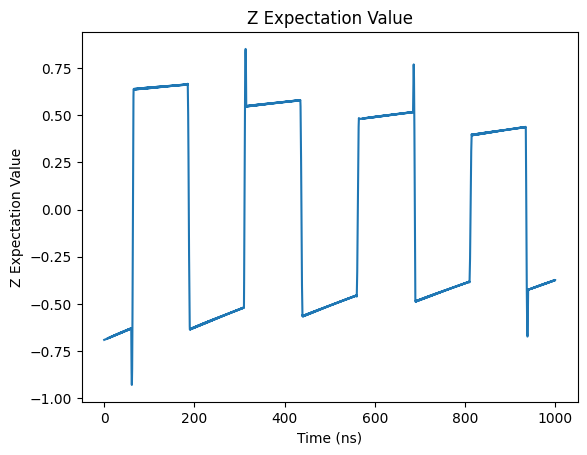

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

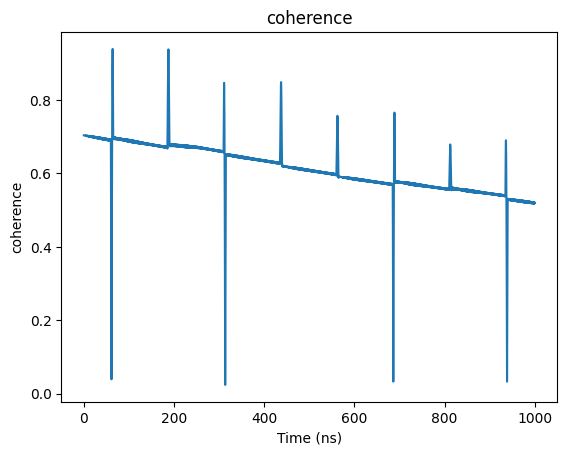

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

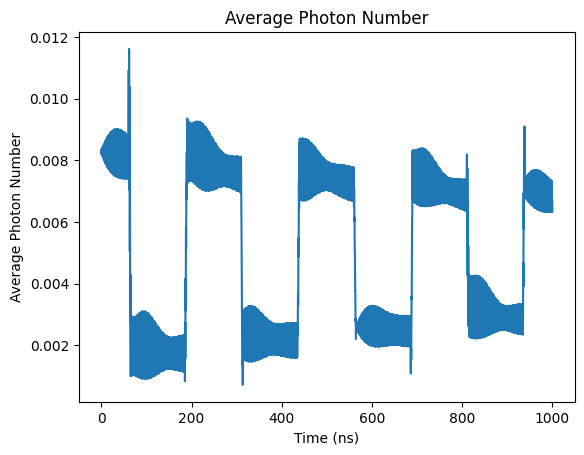

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

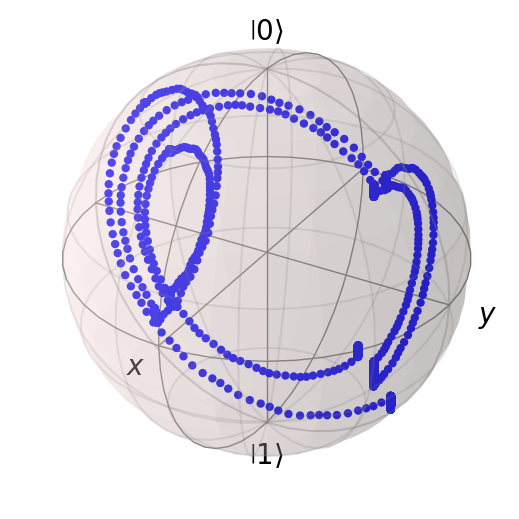

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.0050546913467087095


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

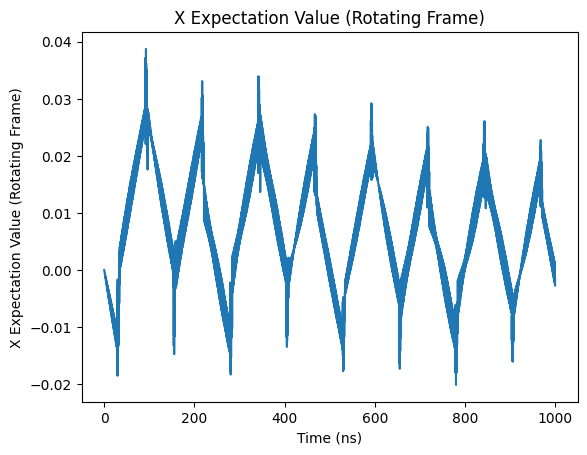

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

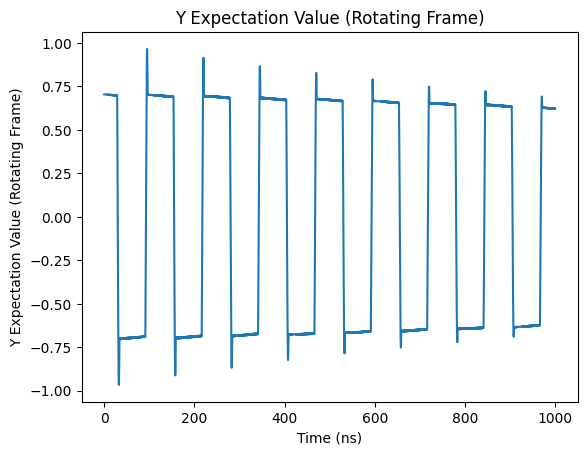

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

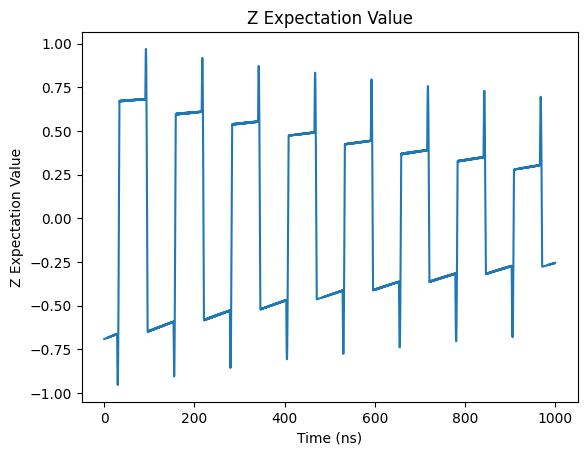

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

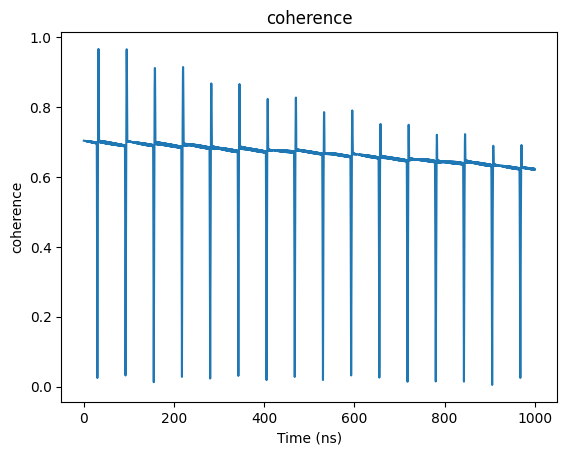

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

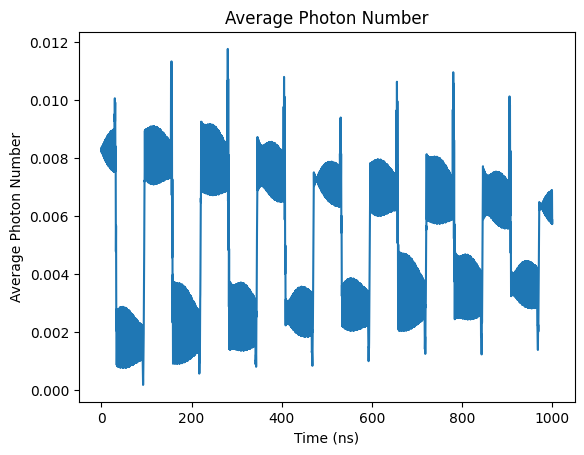

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

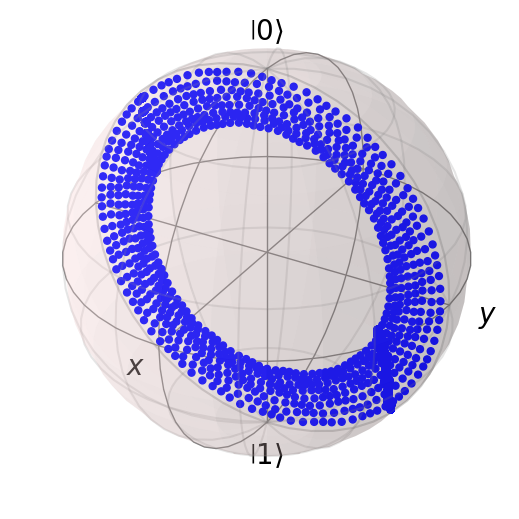

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005045209104041617


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

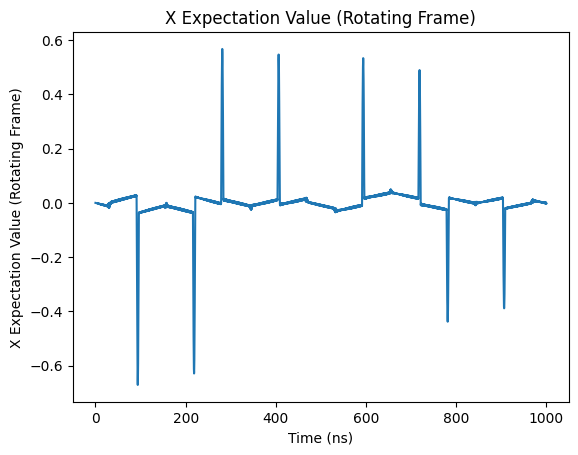

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

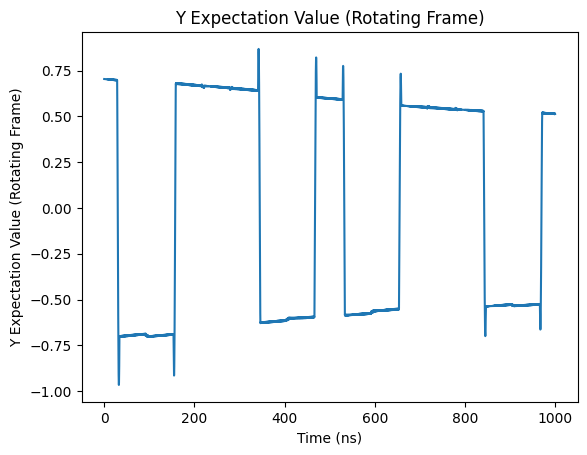

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

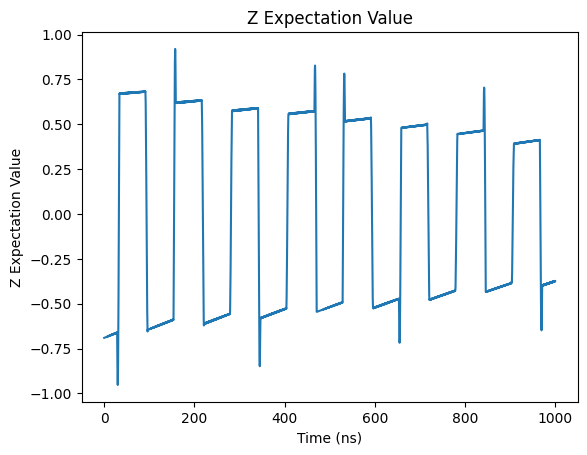

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

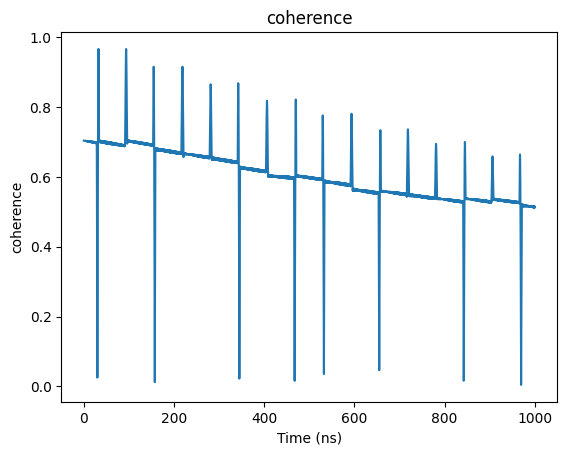

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

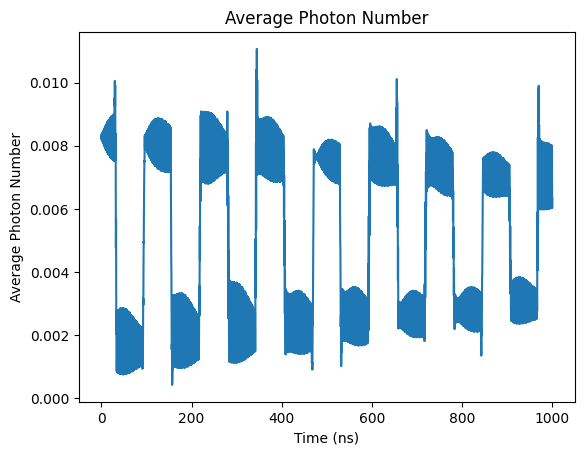

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

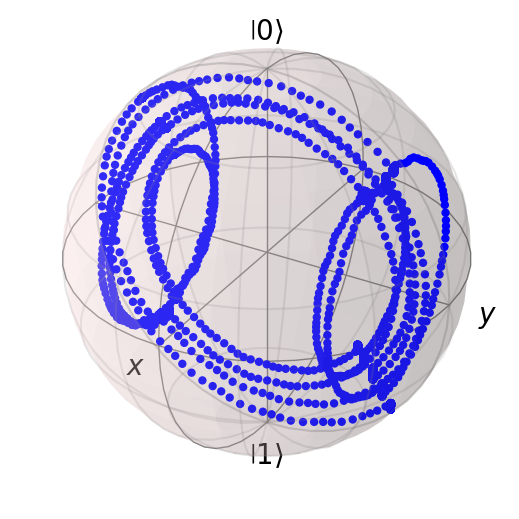

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [ ]:
x_list

[-0.2995675489915006,
 -0.00013094507267510328,
 -0.006532438434653868,
 0.03370808888461692,
 -0.004047775475053571,
 0.005349058304831072,
 -0.0007021593210839091,
 -0.0007786176243231599]

In [ ]:
y_list

[0.41637110943566774,
 0.5431069550535731,
 0.528232944403998,
 0.5222965304504802,
 0.5669212158152221,
 0.5193742266816004,
 0.6217840852965735,
 0.5138673881183834]

In [ ]:
z_list

[0.08124267250763512,
 -0.3472927426113725,
 -0.3560955392722779,
 -0.3746032253130458,
 -0.31705664031093767,
 -0.3742936172689279,
 -0.2550434456568221,
 -0.3747111485409139]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ |1\rangle $

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [ ]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.0073541542107688285
[0.0, -0.0, -0.9805806756909203]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

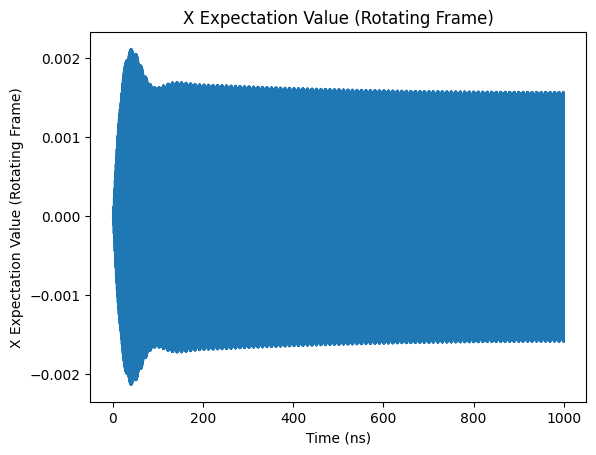

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

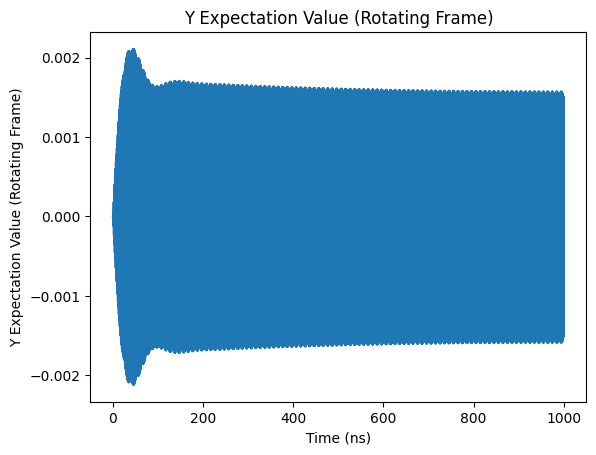

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

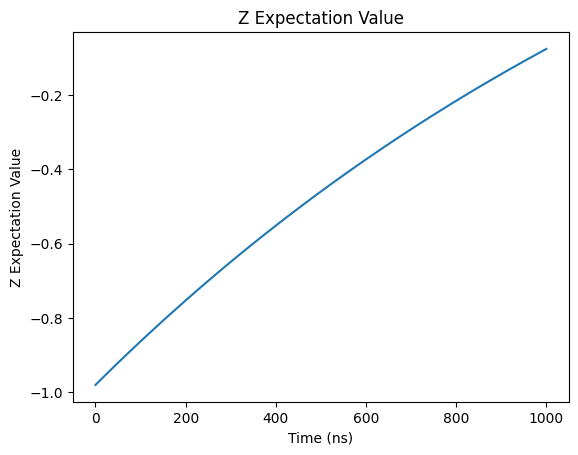

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

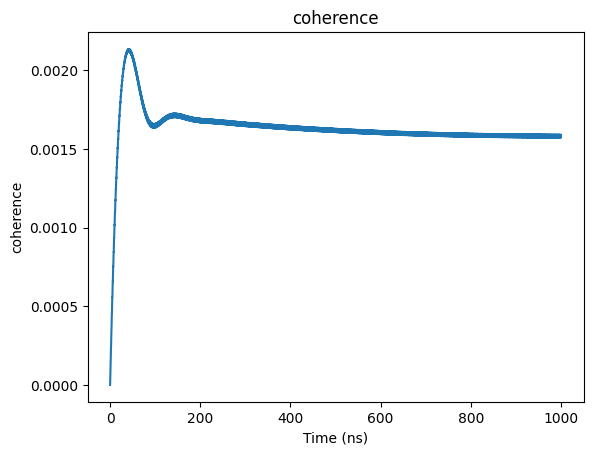

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

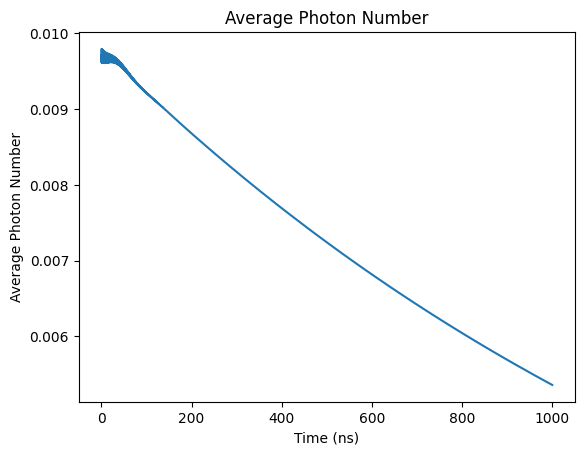

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

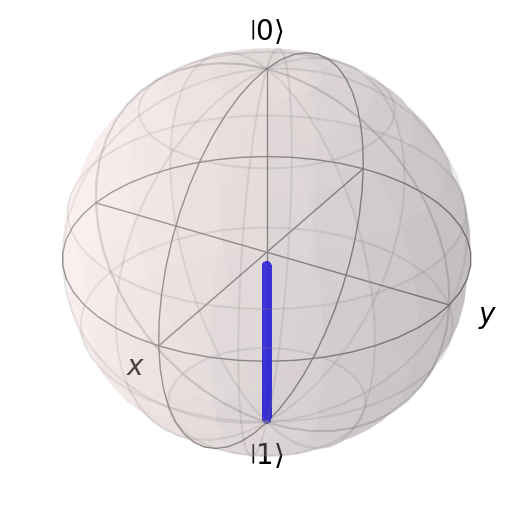

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [ ]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004946060731014858


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

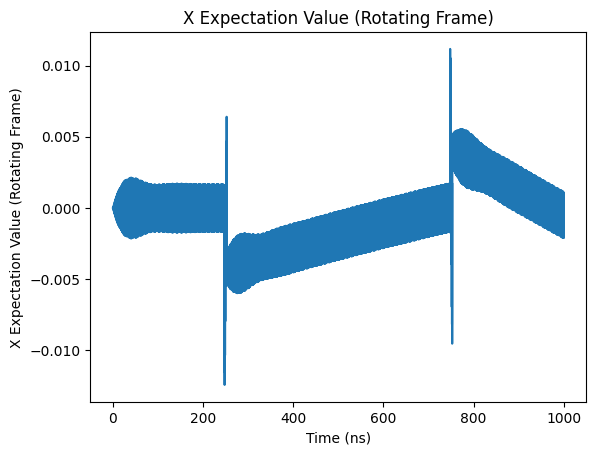

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

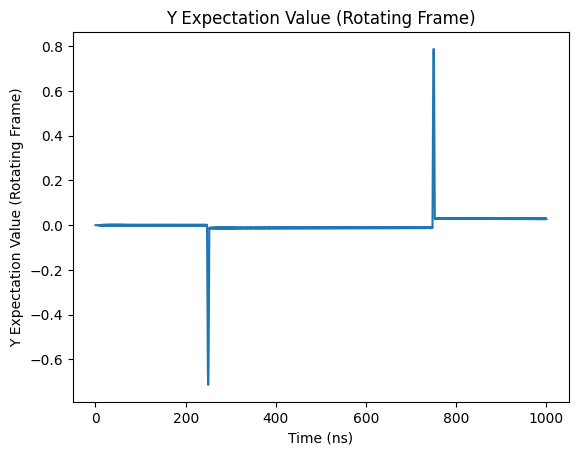

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

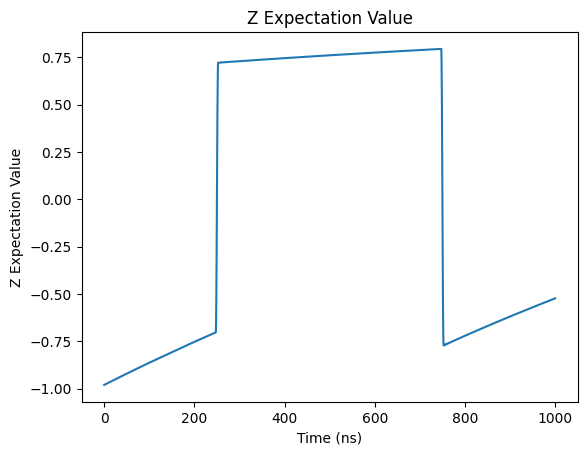

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

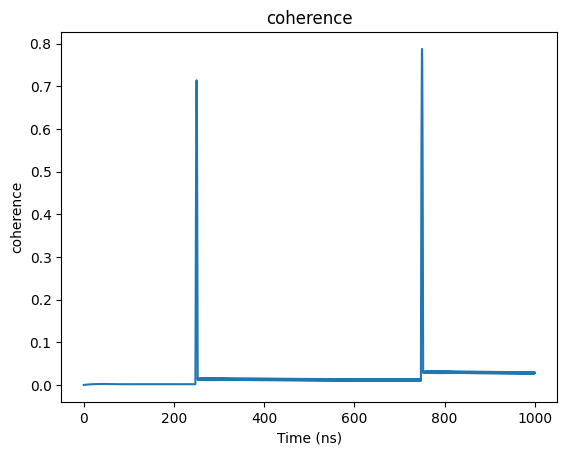

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

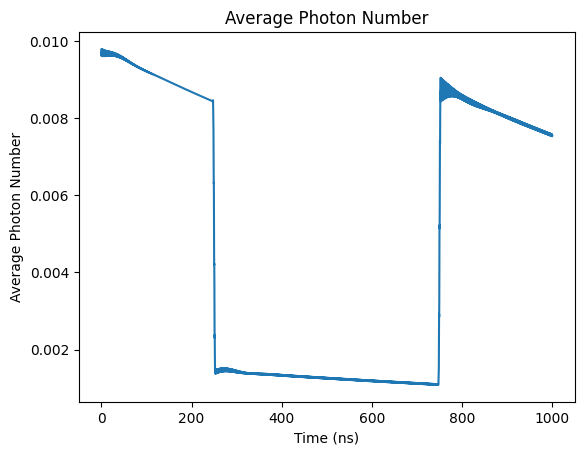

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

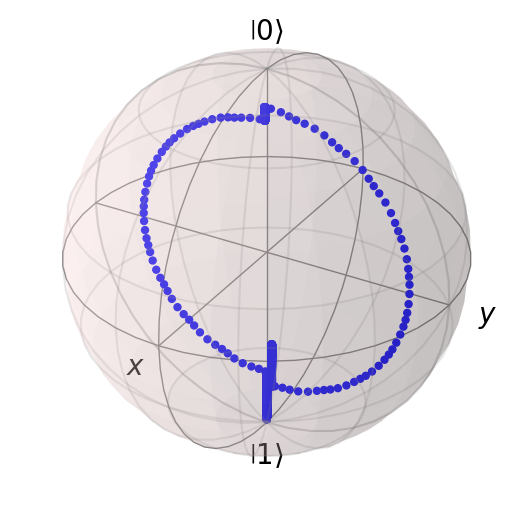

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004953771988657009


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

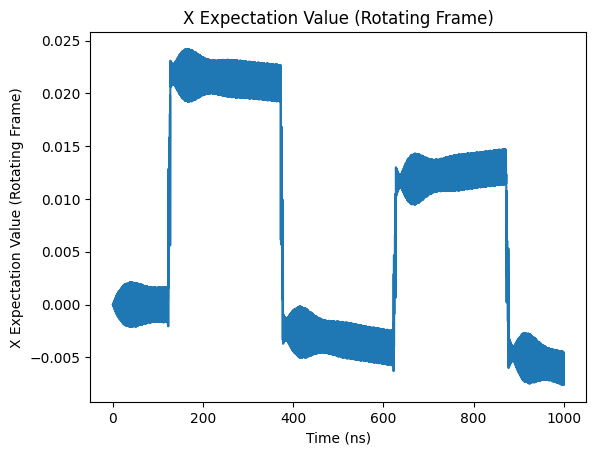

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

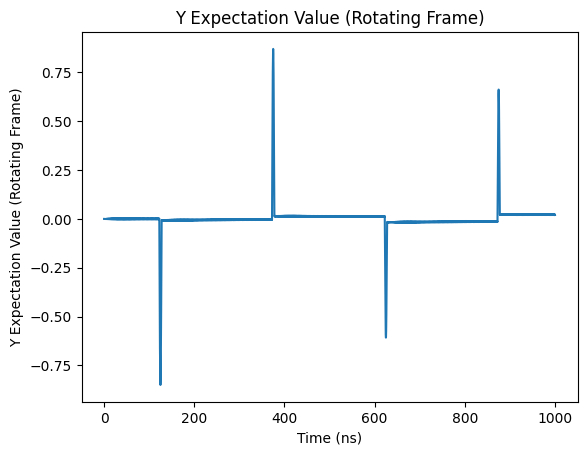

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

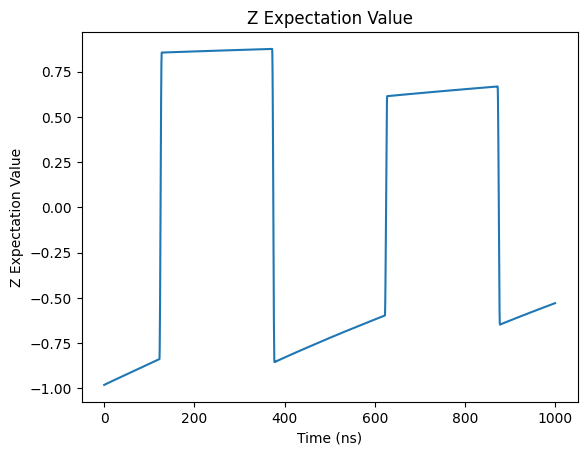

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

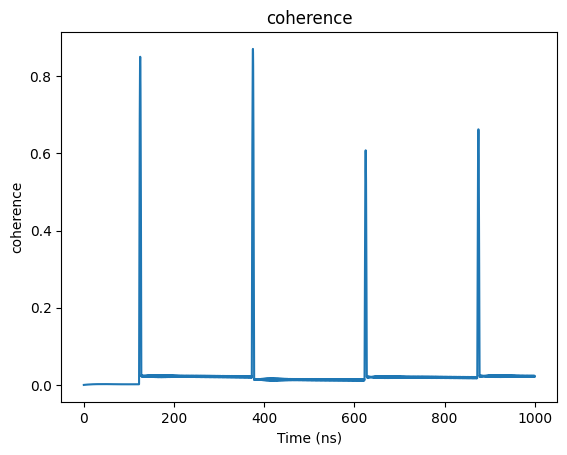

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

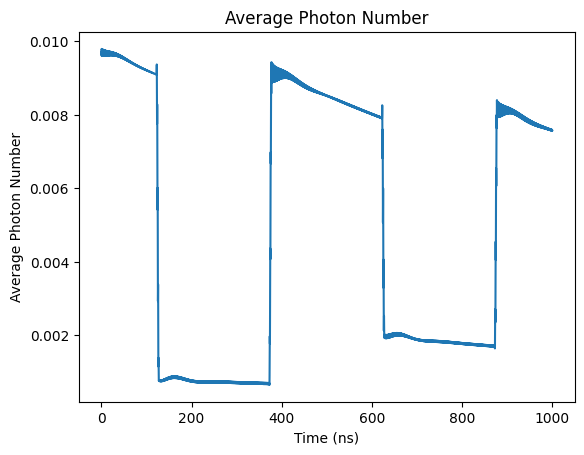

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

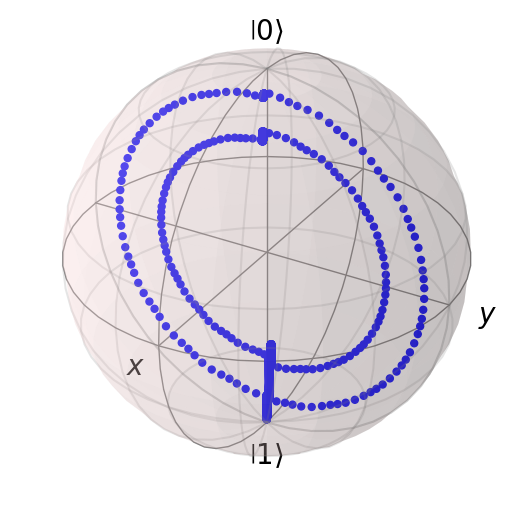

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [ ]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004950726234110568


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

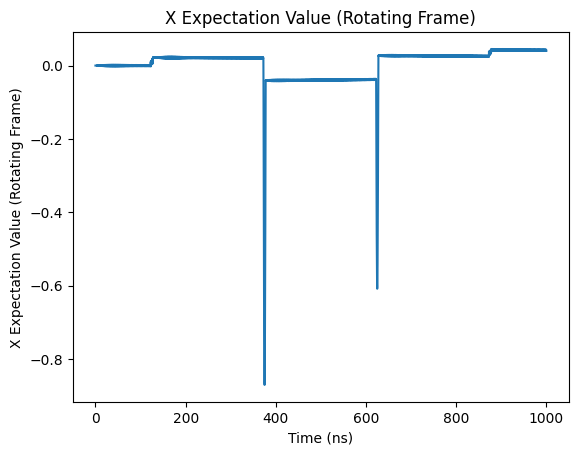

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

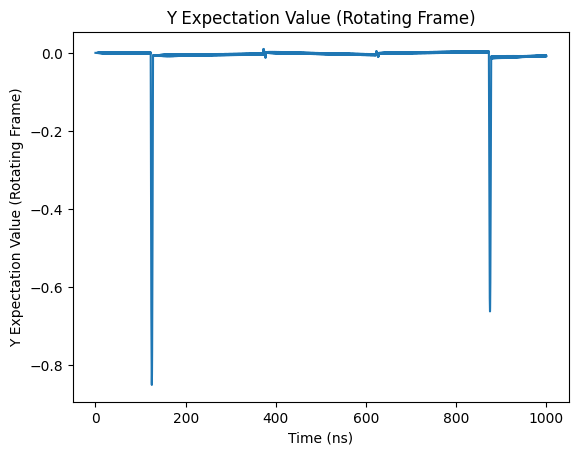

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

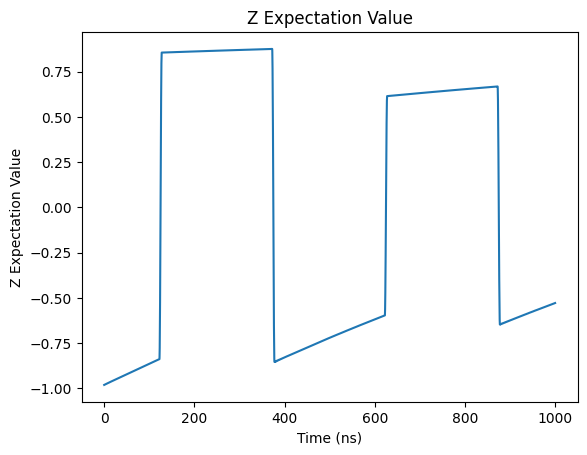

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

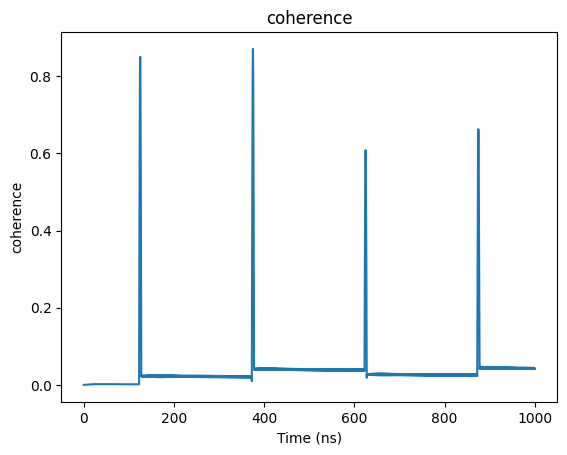

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

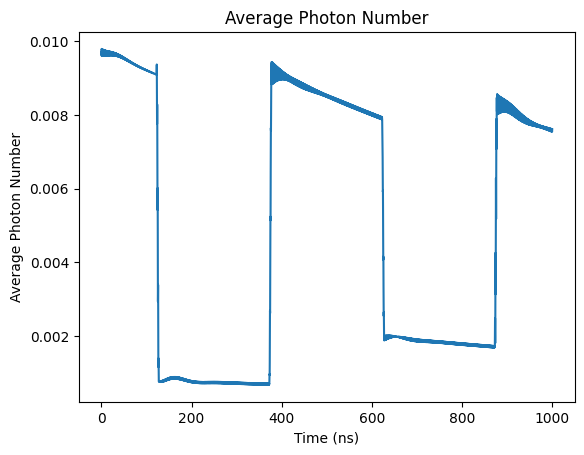

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

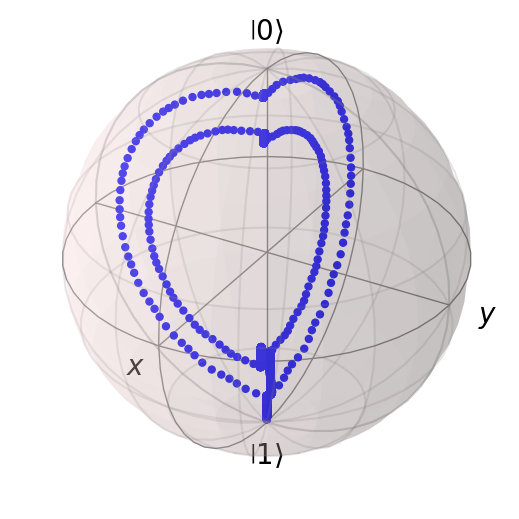

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004985892033461258


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

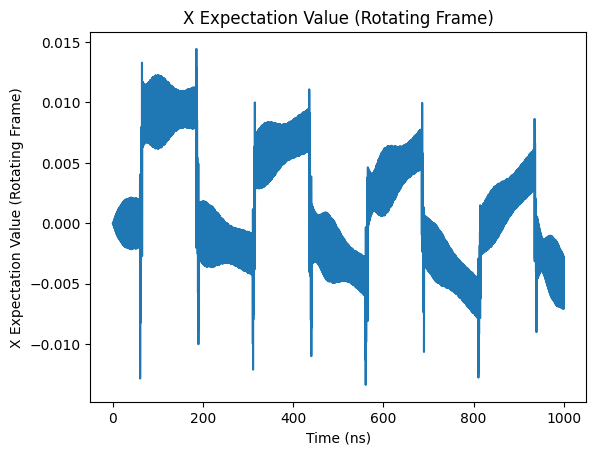

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

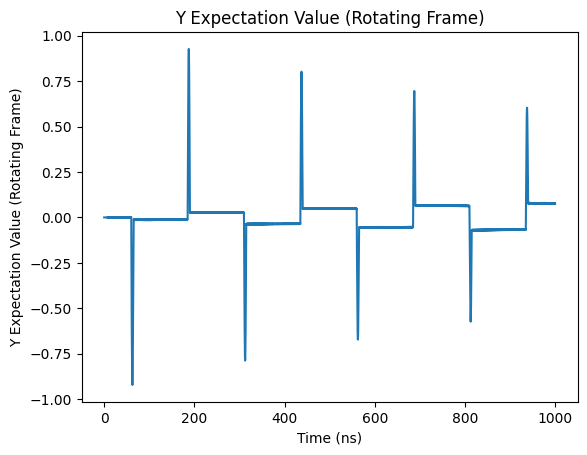

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

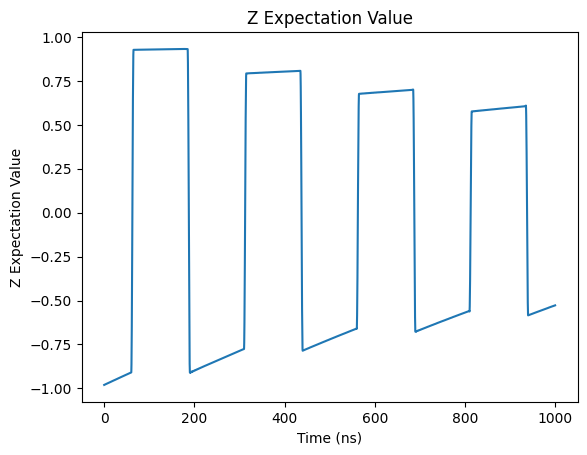

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

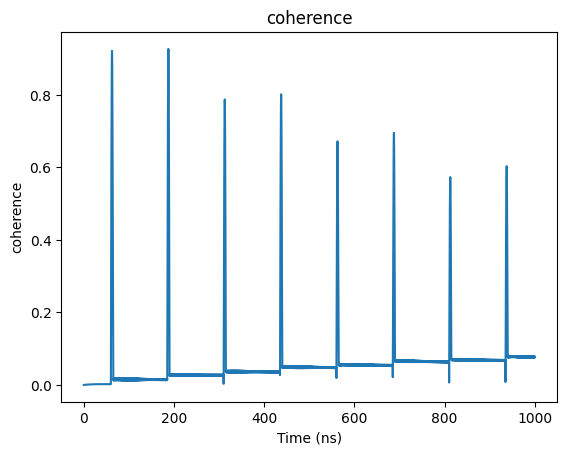

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

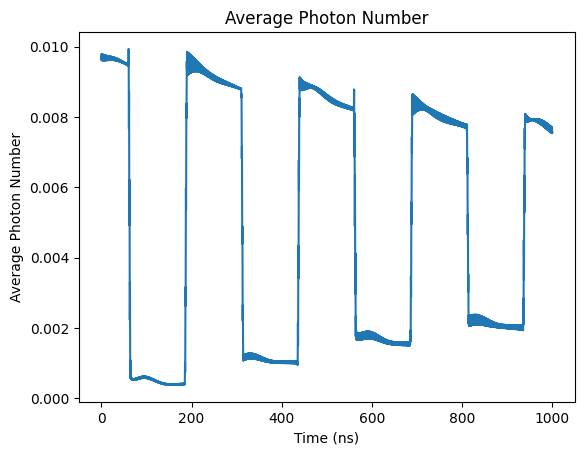

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

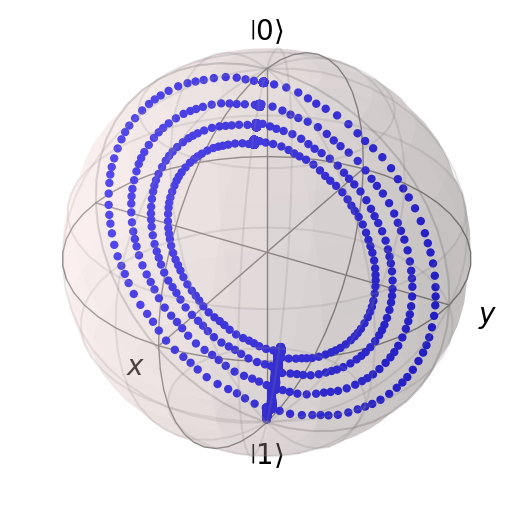

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [ ]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004986912469953784


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

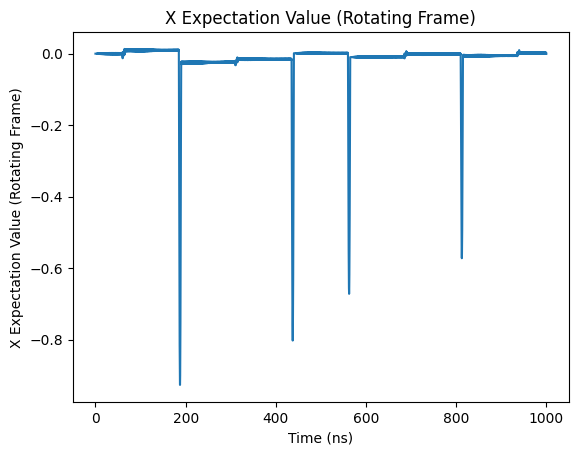

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

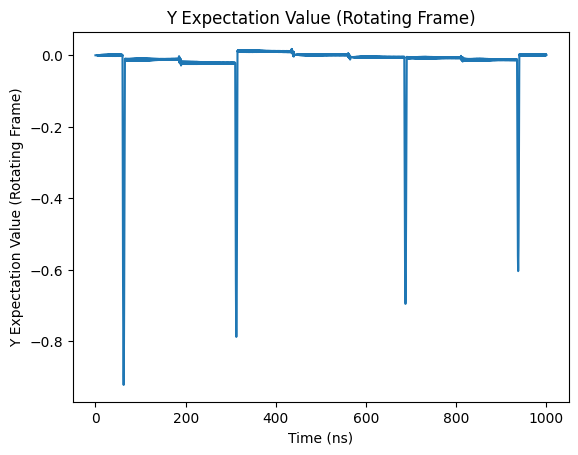

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

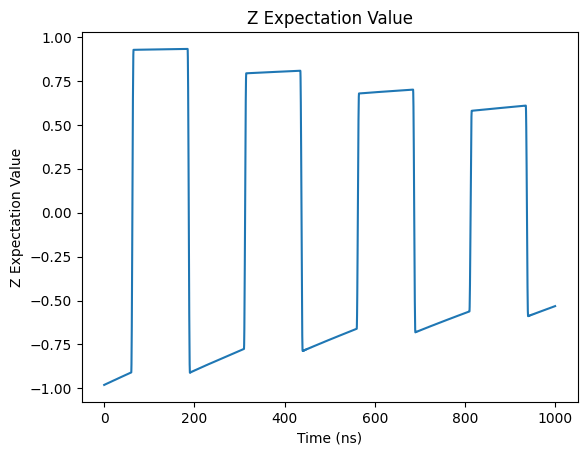

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

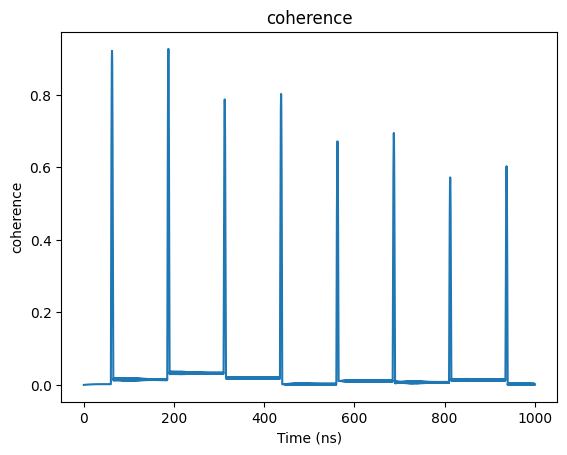

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

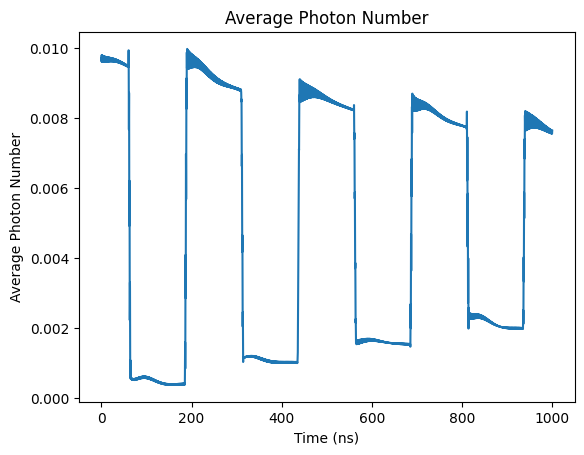

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

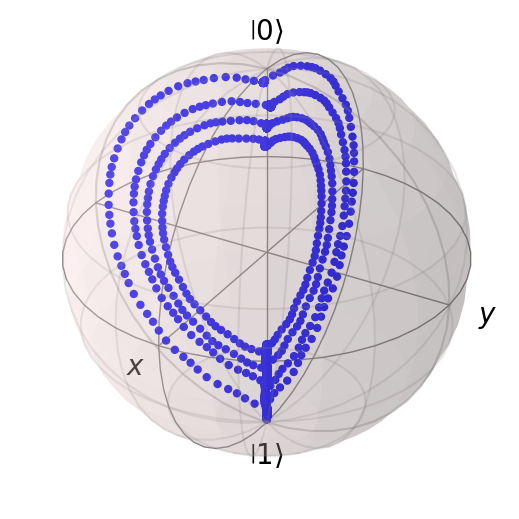

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005052908510077182


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

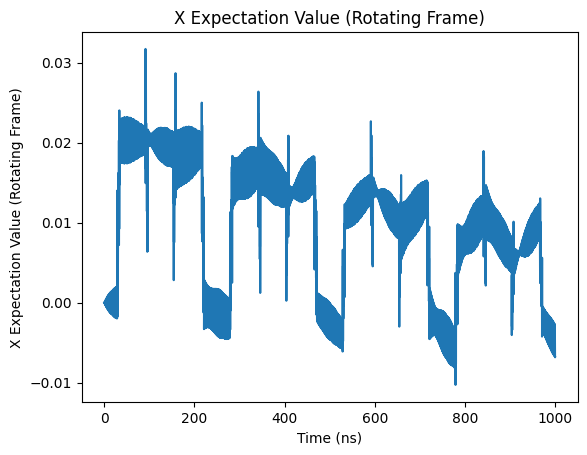

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

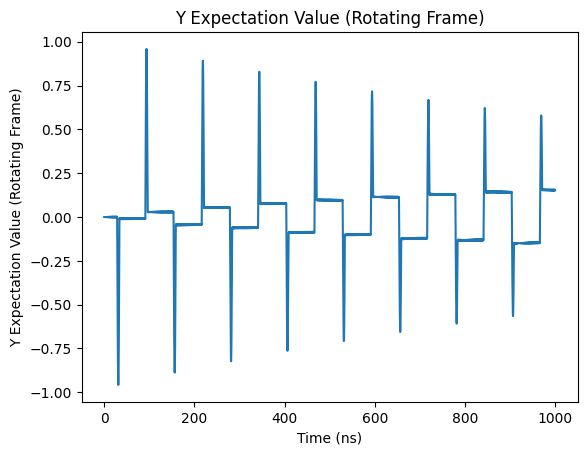

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

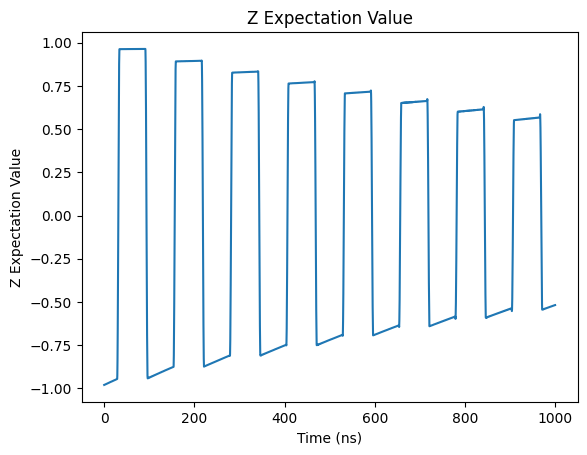

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

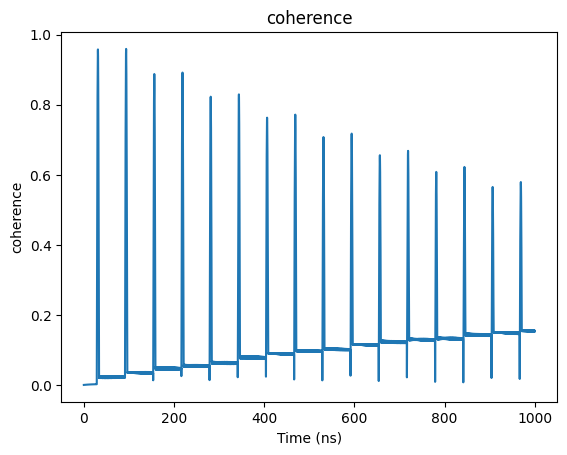

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

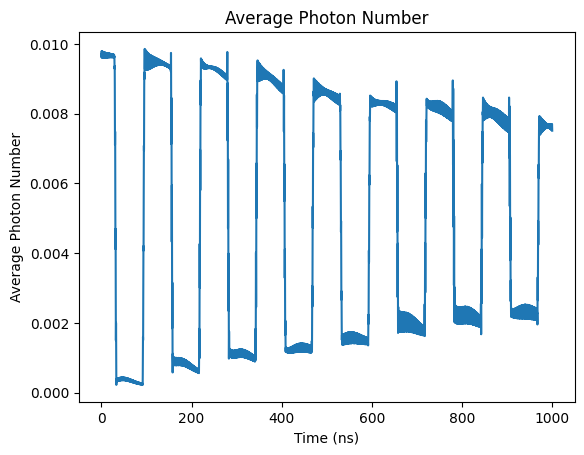

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

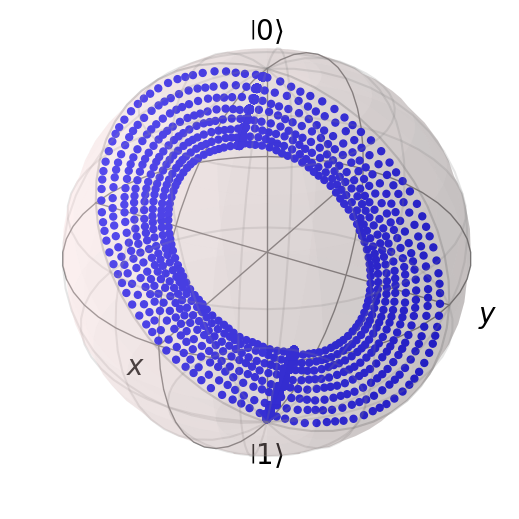

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [ ]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005047176565727207


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

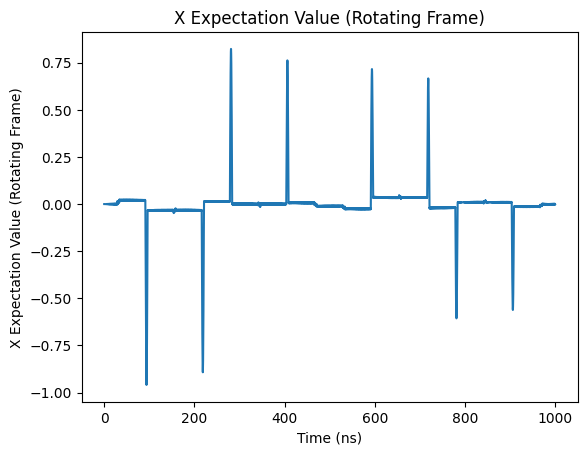

In [ ]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

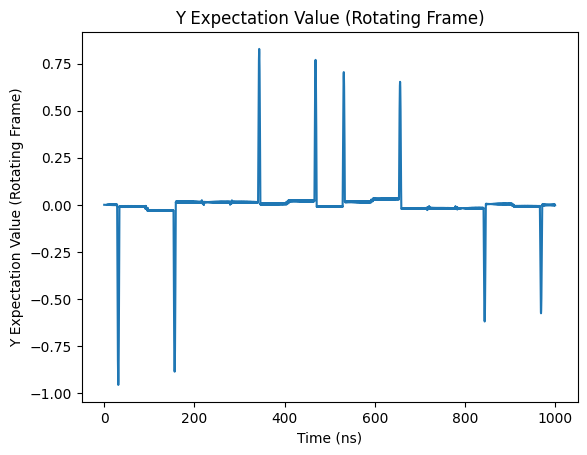

In [ ]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

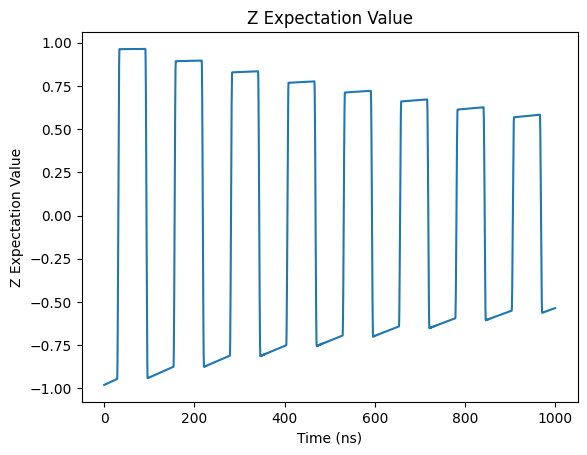

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

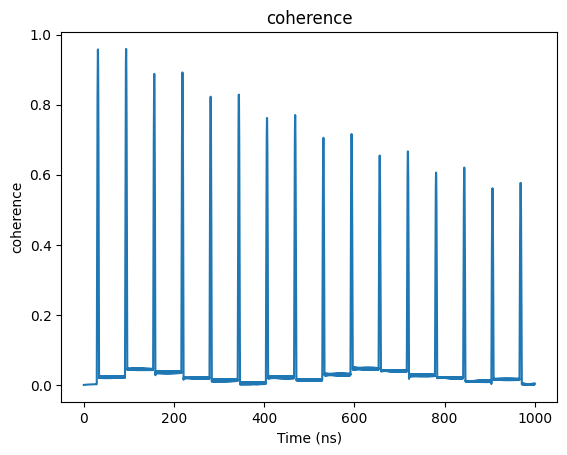

In [ ]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

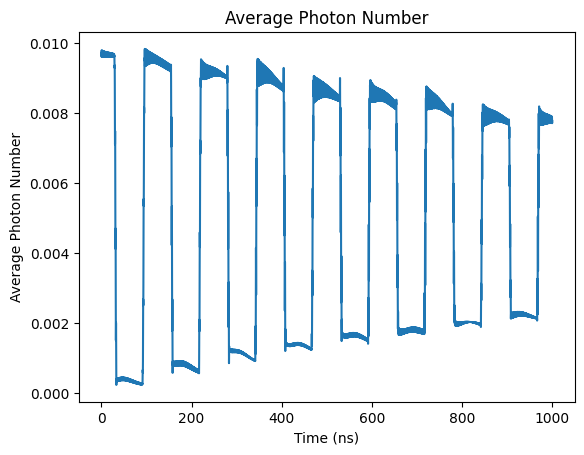

In [ ]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

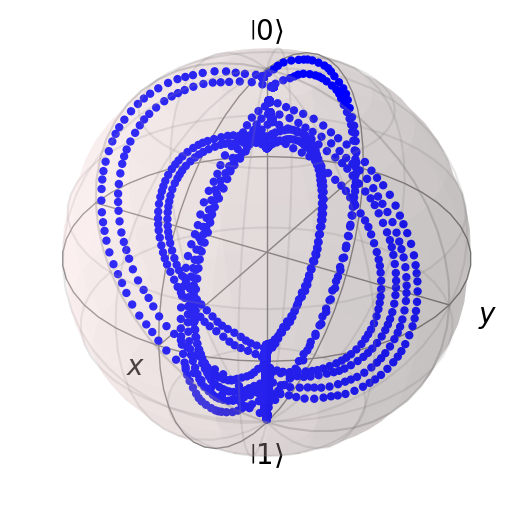

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [ ]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [ ]:
x_list

[-2.0288489188522233e-05,
 -0.0005108837769022591,
 -0.006063373960735728,
 0.04186655824420561,
 -0.004911886522290176,
 0.0014198589598486372,
 -0.00478141317808371,
 -0.0008014607409603904]

In [ ]:
y_list

[-1.2754068378077775e-05,
 0.02839117363695413,
 0.02132140682024582,
 -0.007893970501019127,
 0.07661421812728425,
 0.0010831366911310406,
 0.15362066754490622,
 -0.0008813174037418574]

In [ ]:
z_list

[-0.07638318978022937,
 -0.5240740398270797,
 -0.5290825921397239,
 -0.5285342667553335,
 -0.5279243735611193,
 -0.5323678149783435,
 -0.5185972679009698,
 -0.5362168807641741]